In [113]:
import matplotlib.pyplot as plt
from Bio import Entrez
import pickle as pk  

In [116]:
chem_gene_df = pd.read_csv("input/CTD/CTD_chem_gene_ixns.tsv",delimiter= '\t',
            skipinitialspace=True)
chem_vocabolary = pd.read_csv("input/CTD/CTD_chemicals_cleaned.txt",delimiter= '\t',
           skipinitialspace=True)

In [117]:

chem_homo = chem_gene_df[(chem_gene_df['Organism'] == 'Homo sapiens')]

chem_gene = {}
for i,v in chem_homo.iterrows():
    try:
        chem_gene[v["ChemicalID"]] |= {v["GeneSymbol"]}
    except KeyError as e:
        chem_gene[v["ChemicalID"]] = set([v["GeneSymbol"]])

#Here, we remove the elements that do not perturb any genes:
chem_gene_cleaned = {}
tot_gene_list=[]
for k,v in chem_gene.items():
    if len(v)>0:
        chem_gene_cleaned[k]=v
        for gene in v:
            tot_gene_list.append(gene)
    else:
        pass



In [62]:
#Let's define a dictionary that will convert the chemical id in chemical Name
chem_id_name_conversion = {}
for i,v in chem_homo.iterrows():
    chem_id_name_conversion[v["ChemicalID"]] = v["# ChemicalName"]

In [64]:
#Let's define a dictionary that will convert the chemical id in CasRN 
chem_id_cas_conversion = {}
for i,v in chem_homo.iterrows():
    chem_id_cas_conversion[v["ChemicalID"]] = v["CasRN"]

In [125]:
gene_associations = pd.read_csv("input/Disease/all_gene_disease_associations.tsv",
           delimiter= '\t',
           skipinitialspace=True)

In [70]:
#Let's define a dictionary that will convert the disease name in disease ID
dis_name_id_conversion = {}
for i,v in gene_associations.iterrows():
        dis_name_id_conversion[v["diseaseName"]] = v["diseaseId"]

In [ ]:
#From literature we will retrieve the following key search terms:
# chme_id, dis_name
# chem_id, dis_id
# chem_name, dis_name
# chem_name, dis_id
# chem_cas,  dis_name
# chem_cas,  dis_id

In [123]:
#Let's import the proximal disease-exposure predictions
with open('output/exp_random/real_significant_final_exp_proximity.pickle', 'rb') as handle:
    real_significant_final_exp_proximity = pk.load(handle)

In [124]:
len(real_significant_final_exp_proximity)

176259

In [ ]:
#Let's look for abstracts in Pubmed with the above defined associations and synonyms
from Bio import Entrez
Entrez.email = "yourmail@gmail.com"
lit_associations_dis_chem_dict={}

for dis_chem_pair in real_significant_final_exp_proximity.keys():
    dis_chem_lit_association_list=[]
    try:
        handle = Entrez.esearch(db="pubmed", term="%s AND %s" %(dis_chem_pair[1],dis_chem_pair[0]), retmax=100000, usehistory = 'y', retmode="xml")
        records = Entrez.read(handle)
        dis_chem_lit_association_list.extend(records["IdList"])
    except:
        pass  
    try:
        handle = Entrez.esearch(db="pubmed", term="%s AND %s" %(dis_name_id_conversion[dis_chem_pair[1]],dis_chem_pair[0]), retmax=100000, usehistory = 'y', retmode="xml")
        records = Entrez.read(handle)
        dis_chem_lit_association_list.extend(records["IdList"])
    except:
        pass
    try:
        handle = Entrez.esearch(db="pubmed", term="%s AND %s" %(dis_chem_pair[1],chem_id_name_conversion[dis_chem_pair[0]]), retmax=100000, usehistory = 'y', retmode="xml")
        records = Entrez.read(handle)
        dis_chem_lit_association_list.extend(records["IdList"])
    except:
        pass  
    try:
        handle = Entrez.esearch(db="pubmed", term="%s AND %s" %(dis_name_id_conversion[dis_chem_pair[1]],chem_id_name_conversion[dis_chem_pair[0]]), retmax=100000, usehistory = 'y', retmode="xml")
        records = Entrez.read(handle)
        dis_chem_lit_association_list.extend(records["IdList"])
    except:
        pass
    try:
        handle = Entrez.esearch(db="pubmed", term="%s AND %s" %(dis_chem_pair[1],chem_id_cas_conversion[dis_chem_pair[0]]), retmax=100000, usehistory = 'y', retmode="xml")
        records = Entrez.read(handle)
        dis_chem_lit_association_list.extend(records["IdList"])
    except:
        pass  
    try:
        handle = Entrez.esearch(db="pubmed", term="%s AND %s" %(dis_name_id_conversion[dis_chem_pair[1]],chem_id_cas_conversion[dis_chem_pair[0]]), retmax=100000, usehistory = 'y', retmode="xml")
        records = Entrez.read(handle)
        dis_chem_lit_association_list.extend(records["IdList"])
    except:
        pass        
    lit_associations_dis_chem_dict[dis_chem_pair]=len(set(dis_chem_lit_association_list))


In [ ]:
with open('output/exp_random/lit_associations_dis_chem_dict_real.pickle', 'wb') as handle:
    pk.dump(lit_associations_dis_chem_dict, handle, protocol=pk.HIGHEST_PROTOCOL)

In [2]:

with open('output/exp_random/lit_associations_dis_chem_dict_real.pickle', 'rb') as handle:
    lit_associations_dis_chem_dict_real = pk.load(handle)

In [3]:
len(lit_associations_dis_chem_dict_real)

176259

In [104]:


benzene_proximaldis_zlist=[]
benzene_proximaldis_citlist=[]

for chdis,z_dict in real_significant_final_exp_proximity.items():
    if chdis[0]=='D001554':
        benzene_proximaldis_zlist.append(z_dict[1])
        benzene_proximaldis_citlist.append(lit_associations_dis_chem_dict_real[chdis])

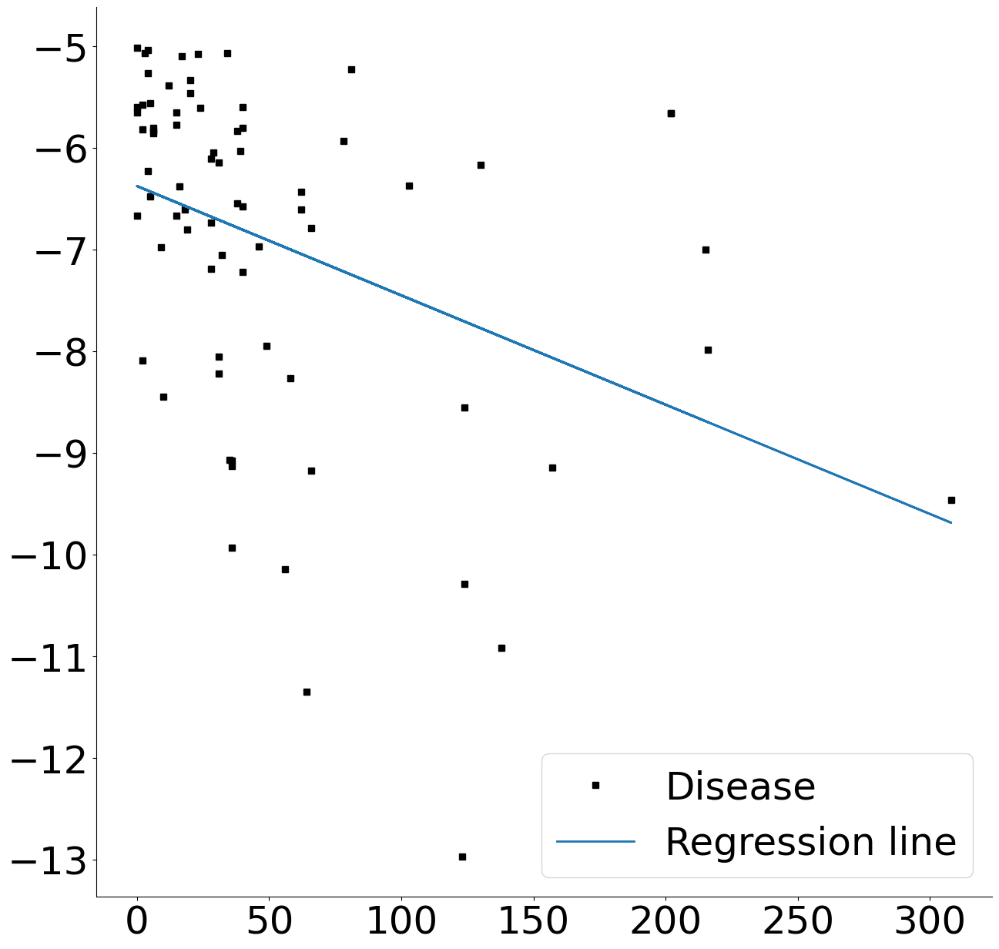

In [109]:

import scipy
from matplotlib.pyplot import figure
from scipy import stats


fig, ax = plt.subplots(figsize=(15,15))
slope, intercept, r, p, stderr = scipy.stats.linregress(benzene_proximaldis_citlist, benzene_proximaldis_zlist)

ax.plot(benzene_proximaldis_citlist,benzene_proximaldis_zlist, linewidth=0, marker='s',c='k', label='Disease')
y=[]
for i in benzene_proximaldis_citlist:
    g=(intercept + slope * i)
    y.append(g)
line = "Regression line" 

ax.plot(benzene_proximaldis_citlist, y, label=line,linewidth=2)
#ax.set_xlabel('Max degree value', fontsize=18)
#ax.set_ylabel('Hazard',fontsize=18)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(True)
ax.spines['left'].set_visible(True)
plt.xticks(fontsize=36) 
plt.yticks(fontsize=36) 

ax.legend(facecolor='white',fontsize=36)
plt.show()

In [7]:
#Let's create a network from the lit_associations
dis_exp_dict={}
dis_set=set([k[1] for k in lit_associations_dis_chem_dict_real.keys()])
for dis1 in dis_set:
    exp_list=[]
    for exp,dis in lit_associations_dis_chem_dict_real.keys():
        if dis1==dis:
            exp_list.append(exp)
    dis_exp_dict[dis1]=exp_list
    

In [9]:
len(dis_exp_dict)

704

In [17]:
import scipy.stats as stats

def overlap_set_exposures(listA, listB,background):    
    """
    Accepts to lists
    M is the population size (previously N)
    n is the number of successes in the population
    N is the sample size (previously n)
    x is still the number of drawn “successes”
    """
    M=  background #total number of genes
    n= len(set(listA))
    N= len(set(listB))
    x= len(set(listA).intersection(set(listB)))
    return str(stats.hypergeom.sf(x-1, M, n, N))

from statsmodels.sandbox.stats.multicomp import multipletests
def fdr_adjustment(list_of_pvals,alpha):    
    return multipletests(list_of_pvals,alpha=alpha,method='fdr_bh')[1] #the benjamin hochberg method is used

In [20]:
exp_set=set([k[0] for k in lit_associations_dis_chem_dict_real.keys()])

disdis_pval={}
for dis1,explist1 in dis_exp_dict.items():
    for dis2,explist2 in dis_exp_dict.items():
        if dis1!=dis2:
            pval=overlap_set_exposures(explist1,explist2,len(exp_set))
            disdis_pval[dis1,dis2]=float(pval)
            
            
adj_pvals=fdr_adjustment(list(disdis_pval.values()),alpha=0.05)
dis_keys_list=list(disdis_pval.keys())
disdis_pval_adjusted={} #here we obtain a dictionary of pairs with adjusted p-values
for el in range(len(dis_keys_list)):
    disdis_pval_adjusted[dis_keys_list[el]]=adj_pvals[el]

In [11]:
lit_associations_dis_chem_dict_real_sort=dict(sorted(lit_associations_dis_chem_dict_real.items(), key=lambda item: item[1],reverse=True))


In [16]:
for k,v in lit_associations_dis_chem_dict_real_sort.items():
    print(chem_id_name_conversion[k[0]],k[1],v)

Immunologic Factors Neoplasms 104896
Immunologic Factors Malignant Neoplasms 104896
Antineoplastic Agents Malignant Neoplasms 104817
Enzyme Inhibitors Neoplasms 104761
Enzyme Inhibitors Malignant Neoplasms 104761
Amino Acids, Peptides, and Proteins Inflammation 100891
Peptides Inflammation 100881
Amino Acids, Peptides, and Proteins Hypertensive disease 100425
Amino Acids, Peptides, and Proteins Lung Neoplasms 100264
Amino Acids, Peptides, and Proteins Breast Carcinoma 100204
Amino Acids, Peptides, and Proteins Mammary Neoplasms 100197
Amino Acids, Peptides, and Proteins Malignant neoplasm of breast 100189
Amino Acids, Peptides, and Proteins Obesity 100189
Amino Acids, Peptides, and Proteins Neoplasm Metastasis 95789
Heterocyclic Compounds Inflammation 95147
Lipids Inflammation 90446
Biological Factors Mammary Neoplasms 84951
Amino Acids, Peptides, and Proteins Diabetes Mellitus, Non-Insulin-Dependent 84589
Amino Acids, Peptides, and Proteins Alzheimer's Disease 82018
Biological Factors

INK128 Neoplasms 5143
INK128 Malignant Neoplasms 5143
silmitasertib Neoplasms 5143
silmitasertib Malignant Neoplasms 5143
PD 173074 Neoplasms 5142
PD 173074 Malignant Neoplasms 5142
CD 437 Neoplasms 5141
CD 437 Malignant Neoplasms 5141
Peptides Hyperalgesia 5140
salubrinal Neoplasms 5139
salubrinal Malignant Neoplasms 5139
Selegiline Neoplasms 5139
garcinol Neoplasms 5136
garcinol Malignant Neoplasms 5136
Biological Products Colorectal Carcinoma 5133
Ginkgo biloba extract Neoplasms 5130
17-(dimethylaminoethylamino)-17-demethoxygeldanamycin Neoplasms 5129
17-(dimethylaminoethylamino)-17-demethoxygeldanamycin Malignant Neoplasms 5129
FTI 277 Neoplasms 5129
FTI 277 Malignant Neoplasms 5129
Lipids Seizures 5129
apicidin Neoplasms 5127
apicidin Malignant Neoplasms 5127
cyanoginosin LR Neoplasms 5126
cyanoginosin LR Malignant Neoplasms 5126
Plant Preparations Malignant neoplasm of liver 5126
Plant Preparations Liver neoplasms 5124
chan su Neoplasms 5123
chan su Malignant Neoplasms 5123
SB 21

Amino Acids Thyroid carcinoma 3558
Plant Preparations Mental Depression 3555
Oxygen Malignant neoplasm of liver 3553
Biological Products Head and Neck Neoplasms 3552
Enzyme Inhibitors Thyroid carcinoma 3547
Oxygen Liver neoplasms 3546
Amino Acids Colorectal Neoplasms 3540
Methotrexate Breast Carcinoma 3536
gemcitabine Malignant neoplasm of lung 3533
Quinazolines Hypertensive disease 3532
Amidines Hypertensive disease 3530
Fluoxetine Unipolar Depression 3529
gemcitabine Lung Neoplasms 3529
Polycyclic Aromatic Hydrocarbons Dementia 3525
Reactive Oxygen Species Cerebrovascular accident 3522
Daunorubicin Neoplasm Metastasis 3521
Polycyclic Aromatic Hydrocarbons Squamous cell carcinoma 3521
Calcium Malignant neoplasm of breast 3519
Cisplatin Breast Carcinoma 3518
Pyrimidines Skin Neoplasms 3514
Gefitinib Small cell carcinoma of lung 3511
Calcium Diabetes Mellitus, Non-Insulin-Dependent 3510
Acids Reperfusion Injury 3509
Phenol Mammary Neoplasms 3509
Fish Oils Fatty Liver 3504
Phenobarbital 

Plant Preparations Prostatic Neoplasms 1785
Reactive Oxygen Species Mental Depression 1782
Aniline Compounds Mammary Neoplasms 1781
Pyrroles Mammary Neoplasms 1780
Enalapril Heart failure 1779
Enalapril Congestive heart failure 1779
Pesticides Hypertensive disease 1779
Antirheumatic Agents Diabetes Mellitus, Experimental 1778
Protein Synthesis Inhibitors Neoplasm Metastasis 1777
Heterocyclic Compounds, 3-Ring Head and Neck Neoplasms 1776
Fluticasone Inflammation 1775
Vincristine Mammary Neoplasms 1775
Testosterone Malignant neoplasm of breast 1773
Pyrimidines Malignant neoplasm of urinary bladder 1772
Immunologic Factors Squamous cell carcinoma of esophagus 1771
Metoprolol Hypertensive disease 1771
Nitrogen Reperfusion Injury 1770
Organometallic Compounds Brain Neoplasms 1770
Mustard Compounds Malignant neoplasm of skin 1769
Morphine Hyperalgesia 1768
Doxorubicin Colorectal Neoplasms 1766
Cholesterol Malignant neoplasm of breast 1764
Nitric Oxide Donors Heart failure 1764
Nitric Oxide 

Oxygen Schizophrenia 1149
Air Pollutants Obesity 1148
Aristolochic Acids Inflammation 1148
Chelating Agents Brain Neoplasms 1148
Mitomycin Lung Neoplasms 1147
Pyrazoles Neoplasm Metastasis 1147
carnosol Inflammation 1146
GW 501516 Inflammation 1146
osimertinib Small cell carcinoma of lung 1146
SR 144528 Inflammation 1146
27-hydroxycholesterol Inflammation 1145
6-chloro-2,3,4,9-tetrahydro-1H-carbazole-1-carboxamide Inflammation 1145
Amidines Malignant neoplasm of lung 1145
Vemurafenib Inflammation 1145
garcinol Inflammation 1144
Methylmercury Compounds Inflammation 1144
Pesticides Malignant neoplasm of breast 1144
Sunitinib Hypertensive disease 1144
2-aminoethoxydiphenyl borate Inflammation 1143
Heterocyclic Compounds, 3-Ring Myocardial Infarction 1143
Organometallic Compounds Malignant neoplasm of pancreas 1142
S 1 (combination) Seizures 1142
T 91825 Inflammation 1142
Vinorelbine Breast Carcinoma 1142
Chelating Agents Alzheimer's Disease 1141
cyanoginosin LR Inflammation 1141
Amidines 

Resveratrol Breast Carcinoma 893
alpha-Linolenic Acid Fatty Liver 892
Desipramine Depressive disorder 892
NVP-AEW541 Adenocarcinoma 892
AG 1879 Adenocarcinoma 891
Diarylheptanoids Prostatic Neoplasms 891
Phytochemicals Prostatic Neoplasms 891
Protein Synthesis Inhibitors Malignant tumor of colon 891
Resveratrol Mammary Neoplasms 891
Retinoids Obesity 891
Retinoids Mental Depression 891
Amino Acids Mammary Neoplasms, Experimental 890
chan su Adenocarcinoma 890
Everolimus Malignant neoplasm of lung 890
Norepinephrine Cardiomegaly 890
Protein Kinase Inhibitors Esophageal Neoplasms 890
Caspase Inhibitors Non-Small Cell Lung Carcinoma 889
Everolimus Lung Neoplasms 889
olaparib Mammary Neoplasms 889
Soil Pollutants Adenocarcinoma 889
talazoparib Adenocarcinoma 889
aurapten Adenocarcinoma 888
Iron Compounds Malignant neoplasm of breast 888
liposomal doxorubicin Mammary Carcinoma, Human 888
Mitomycin Liver carcinoma 888
Quinolones Malignant neoplasm of prostate 888
Camptothecin Colonic Neoplas

Acids Malignant neoplasm of urinary bladder 756
Phthalic Acids Hypertensive disease 756
Plant Extracts Seizures 756
Flavonols Malignant neoplasm of breast 755
olaparib Ovarian Carcinoma 755
Oxaliplatin Carcinoma of lung 755
Pyrazoles Reperfusion Injury 755
quinoline Psoriasis 755
Sodium Chloride Reperfusion Injury 755
Sodium Chloride Acute kidney injury 755
Erlotinib Hydrochloride Squamous cell carcinoma 754
Heparin Malignant neoplasm of lung 754
NAD Hypertensive disease 754
Phytochemicals Liver carcinoma 754
Sulfates Prostatic Neoplasms 754
Arachidonic Acid Malignant neoplasm of breast 753
Biological Products Malignant neoplasm of esophagus 753
Chalcones Malignant neoplasm of prostate 753
Dasatinib Prostatic Neoplasms 753
Dietary Carbohydrates Malignant neoplasm of lung 753
Drugs, Chinese Herbal Colorectal Neoplasms 753
raltitrexed Colorectal Neoplasms 753
Resveratrol Malignant neoplasm of lung 753
Retinoids Colorectal Neoplasms 753
Stilbenes Brain Neoplasms 753
Streptozocin Insulin R

inecalcitol Malignant neoplasm of prostate 691
kuguacin J Malignant neoplasm of prostate 691
LGK974 Malignant neoplasm of prostate 691
linsidomine Malignant neoplasm of prostate 691
lonafarnib Malignant neoplasm of prostate 691
mahanine Prostatic Neoplasms 691
molibresib Prostatic Neoplasms 691
N-(4-bromo-2-fluorophenyl)-6-methoxy-7-((1-methylpiperidin-4-yl)methoxy)quinazolin-4-amine Malignant neoplasm of prostate 691
N-acetylsphingosine Prostatic Neoplasms 691
napabucasin Malignant neoplasm of prostate 691
N,N-dimethylsphingosine Malignant neoplasm of prostate 691
norcantharidin Prostatic Neoplasms 691
NSC 74859 Malignant neoplasm of prostate 691
NVP ADW742 Malignant neoplasm of prostate 691
NVP-BKM120 Prostatic Neoplasms 691
octylphenol Malignant neoplasm of prostate 691
ON 01910 Malignant neoplasm of prostate 691
Organotin Compounds Prostatic Neoplasms 691
panduratin A Malignant neoplasm of prostate 691
PD168393 Malignant neoplasm of prostate 691
peonidin 3-glucoside Malignant neopl

Aerosols Prostatic Neoplasms 686
afuresertib Prostatic Neoplasms 686
AG-012986 Prostatic Neoplasms 686
AGN 193109 Prostatic Neoplasms 686
AGN 194204 Prostatic Neoplasms 686
AL-10 compound Prostatic Neoplasms 686
alpha-cyano-(3,4-dihydroxy)-N-benzylcinnamide Prostatic Neoplasms 686
alpinetin Prostatic Neoplasms 686
aminoflavone Prostatic Neoplasms 686
amurensin G Prostatic Neoplasms 686
anthraceno(1,2-c)(1,2,5)selenadiazolo-6,11-dione Prostatic Neoplasms 686
antrocin Prostatic Neoplasms 686
antroquinonol Prostatic Neoplasms 686
apple polyphenol extract Prostatic Neoplasms 686
Aprepitant Prostatic Neoplasms 686
APS-2-79 Prostatic Neoplasms 686
arecoline hydrobromide Prostatic Neoplasms 686
ARV-825 Prostatic Neoplasms 686
aspartyl-glutamyl-valyl-aspartal Prostatic Neoplasms 686
Atazanavir Sulfate Prostatic Neoplasms 686
austenitic steel Prostatic Neoplasms 686
azaspiracid Prostatic Neoplasms 686
Bendamustine Hydrochloride Prostatic Neoplasms 686
Benzalkonium Compounds Prostatic Neoplasms 

Tritolyl Phosphates Hypertensive disease 629
UCF 101 Hypertensive disease 629
VER 155008 Hypertensive disease 629
ZD4054 Hypertensive disease 629
4-benzyl-2-methyl-1,2,4-thiadiazolidine-3,5-dione Hypertensive disease 628
ABT-737 Hypertensive disease 628
Aminolevulinic Acid Glioma 628
Aminolevulinic Acid Malignant Glioma 628
Artesunate Hypertensive disease 628
Asbestos, Amphibole Hypertensive disease 628
Atazanavir Sulfate Hypertensive disease 628
benzyloxycarbonyl-valyl-alanyl-aspartic acid Hypertensive disease 628
dienogest Hypertensive disease 628
dihydromyricetin Hypertensive disease 628
dihydrotanshinone I Hypertensive disease 628
dimethylarsinous acid Hypertensive disease 628
Dust Neoplasm Metastasis 628
echinacoside Hypertensive disease 628
erastin Hypertensive disease 628
EUK-134 Hypertensive disease 628
FEC protocol Hypertensive disease 628
Formoterol Fumarate Hypertensive disease 628
fotemustine Hypertensive disease 628
GSK690693 Hypertensive disease 628
GW 4064 Hypertensive d

Tobacco Smoke Pollution Liver neoplasms 606
Tobacco Smoke Pollution Malignant neoplasm of liver 606
veliparib Neoplasm Metastasis 606
Antineoplastic Agents Hemangiosarcoma 605
Aristolochic Acids Liver neoplasms 605
Aristolochic Acids Malignant neoplasm of liver 605
Ascorbic Acid Hypertensive disease 605
AZD 6244 Neoplasm Metastasis 605
Bleomycin Squamous cell carcinoma of the head and neck 605
Complex Mixtures Cholestasis 605
Fish Oils Head and Neck Neoplasms 605
Nicotine Asthma 605
Nitrogen Mustard Compounds Uterine Cervical Neoplasm 605
Ritonavir Liver neoplasms 605
Ritonavir Malignant neoplasm of liver 605
stattic Neoplasm Metastasis 605
Thiosemicarbazones Lung Neoplasms 605
titanium dioxide Inflammation 605
benzyloxycarbonylleucyl-leucyl-leucine aldehyde Malignant neoplasm of lung 604
Carbon Acute kidney injury 604
CPG-oligonucleotide Neoplasm Metastasis 604
CPG-oligonucleotide Malignant neoplasm of lung 604
Dactinomycin Mental Depression 604
Flavanones Mammary Neoplasms 604
INCB01

Bungarotoxins Lung Neoplasms 578
cambinol Liver neoplasms 578
cambinol Malignant neoplasm of liver 578
Carbachol Malignant neoplasm of lung 578
CD 437 Liver neoplasms 578
CD 437 Malignant neoplasm of liver 578
Celecoxib Rheumatoid Arthritis 578
CMF regimen Malignant neoplasm of lung 578
cobimetinib Malignant neoplasm of lung 578
CP 31398 Liver neoplasms 578
CP 31398 Malignant neoplasm of liver 578
Dasatinib Mammary Neoplasms 578
dieckol Liver neoplasms 578
dieckol Malignant neoplasm of liver 578
dinaciclib Liver neoplasms 578
dinaciclib Malignant neoplasm of liver 578
epoxomicin Liver neoplasms 578
epoxomicin Malignant neoplasm of liver 578
Fingolimod Hydrochloride Malignant neoplasm of lung 578
gamma-Linolenic Acid Lung Neoplasms 578
GW 501516 Liver neoplasms 578
GW 501516 Malignant neoplasm of liver 578
Hexanones Liver neoplasms 578
Hexanones Malignant neoplasm of liver 578
idelalisib Liver neoplasms 578
idelalisib Malignant neoplasm of liver 578
Immunologic Factors Nephroblastoma 57

ZSTK474 Malignant neoplasm of lung 565
15-deoxyprostaglandin J2 Malignant neoplasm of lung 564
27-hydroxycholesterol Lung Neoplasms 564
2-morpholin-4-yl-6-thianthren-1-yl-pyran-4-one Lung Neoplasms 564
5,7-dihydroxy-6-methoxy-2-phenylchromen-4-one Lung Neoplasms 564
Aluminum Chloride Lung Neoplasms 564
Anthocyanins Liver carcinoma 564
apicidin Malignant neoplasm of lung 564
BAY 11-7085 Lung Neoplasms 564
benzoylcarbonyl-aspartyl-glutamyl-valyl-aspartyl-fluoromethyl ketone Lung Neoplasms 564
benzyloxycarbonyl-valyl-alanyl-aspartic acid Malignant neoplasm of lung 564
bicalutamide Breast Carcinoma 564
BMS 754807 Lung Neoplasms 564
calpeptin Lung Neoplasms 564
Crack Cocaine Malignant neoplasm of lung 564
cyanoginosin LR Malignant neoplasm of lung 564
dihydromyricetin Malignant neoplasm of lung 564
dihydroxy-vitamin D3 Malignant neoplasm of lung 564
Dimethyl Fumarate Lung Neoplasms 564
elesclomol Malignant neoplasm of lung 564
E platinum Malignant neoplasm of lung 564
fatostatin Malignant n

WJ1398-1 Lung Neoplasms 560
WP 744 Lung Neoplasms 560
WY-135 Lung Neoplasms 560
WZ4003 Lung Neoplasms 560
XMU-MP-1 Lung Neoplasms 560
yessotoxin Lung Neoplasms 560
ZH-2 compound Lung Neoplasms 560
ziyuglycoside I Lung Neoplasms 560
ziyuglycoside II Lung Neoplasms 560
103D5R Lung Neoplasms 559
10-methoxy-2,2-dimethyl-2,6-dihydropyrano(3,2-c)quinolin-5-one Lung Neoplasms 559
10-nitro-oleic acid Lung Neoplasms 559
10-(octyloxy)decyl-2-(trimethylammonium)ethyl phosphate Lung Neoplasms 559
10'(Z),13'(E),15'(E)-heptadecatrienylhydroquinone Lung Neoplasms 559
11,11'-dideoxyverticilin Lung Neoplasms 559
1,1-bis(3'-indolyl)-1-(4-hydroxyphenyl)methane Lung Neoplasms 559
1,1-dimethylbutyl-1-deoxy-Delta(9)-THC Lung Neoplasms 559
1,2,4,5-benzenetetraamine Lung Neoplasms 559
1-(2-chlorobenzyl)-5'-phenyl-3'H-spiro(indoline-3,2'-(1,3,4)thiadiazol)-2-one Lung Neoplasms 559
1-(3-((2-(dimethylamino)ethyl)carbamoyl)phenyl)-3-(4-(bis(2-chloroethyl)amino)phenyl)urea Lung Neoplasms 559
1-(3',4',5'-trimethoxy

protocatechuic acid methyl ester Liver carcinoma 527
Pt(O,O'-acac)(gamma-acac)(DMS) Liver carcinoma 527
pycnidione Liver carcinoma 527
pyrachlostrobin Liver carcinoma 527
pyranoprofen Liver carcinoma 527
quercetin 3-O-beta-(2''-galloyl)-rhamnopyranoside Liver carcinoma 527
quercetin 4'-O-glucopyranoside Liver carcinoma 527
quinoline-val-asp(OMe)-CH2-OPH Liver carcinoma 527
quinomethionate Liver carcinoma 527
retigeric acid B Liver carcinoma 527
RG7112 Liver carcinoma 527
rosavin Liver carcinoma 527
Salmeterol Xinafoate Liver carcinoma 527
salvianolic acid Erectile dysfunction 527
sargachromanol G Liver carcinoma 527
sargahydroquinoic acid Liver carcinoma 527
SB 3CT compound Liver carcinoma 527
SCIO-469 Liver carcinoma 527
selamectin Liver carcinoma 527
SGA 360 Liver carcinoma 527
SH-6 compound Liver carcinoma 527
silmitasertib Liver carcinoma 527
SK-7041 Liver carcinoma 527
SM-1 compound Liver carcinoma 527
Soot Liver carcinoma 527
sparstolonin B Liver carcinoma 527
SR 144528 Liver car

gamma-Tocopherol Breast Carcinoma 496
Iron Compounds Glioma 496
Niacinamide Neoplasm Metastasis 496
NVP-BKM120 Mammary Carcinoma, Human 496
quinoline Carcinoma, Basal Cell 496
Roscovitine Mammary Neoplasms 496
Ruthenium Compounds Carcinoma of lung 496
Stilbenes Brain Ischemia 496
Amsacrine Mammary Neoplasms 495
Chelating Agents Malignant neoplasm of pancreas 495
Chlorobenzenes Malignant neoplasm of breast 495
Depsipeptides Malignant neoplasm of breast 495
Estrogens Schizophrenia 495
Etoposide Osteosarcoma 495
Oxygen Malignant neoplasm of urinary bladder 495
Silver Compounds Mammary Neoplasms 495
Silymarin Malignant neoplasm of breast 495
Sodium Chloride Malignant neoplasm of stomach 495
Sodium Chloride Stomach Neoplasms 495
sulforaphane Colorectal Carcinoma 495
Butyrates Brain Neoplasms 494
Carbamates Sepsis 494
Cholecalciferol Obesity 494
Cholesterol Brain Neoplasms 494
Cocaine Cerebrovascular accident 494
Diclofenac Neoplasms 494
Diclofenac Malignant Neoplasms 494
Dinoprost Hypertens

M-VAC protocol Mammary Neoplasms 444
N-acetylsphingosine Mammary Neoplasms 444
notoginsenoside R1 Cerebrovascular accident 444
nutlin 3 Colorectal Carcinoma 444
O(6)-benzylguanine Colorectal Carcinoma 444
OSU 03012 Breast Carcinoma 444
PCB 180 Mammary Neoplasms 444
PI103 Mammary Neoplasms 444
picropodophyllin Mammary Neoplasms 444
pifithrin Colorectal Carcinoma 444
Saponins Diabetes Mellitus, Non-Insulin-Dependent 444
schizandrin A Breast Carcinoma 444
secoisolariciresinol diglucoside Mammary Carcinoma, Human 444
Selegiline Mammary Neoplasms 444
Silver Colorectal Carcinoma 444
tanespimycin Carcinoma of lung 444
Telmisartan Mammary Neoplasms 444
Thyroxine Liver neoplasms 444
Thyroxine Malignant neoplasm of liver 444
trans-10,cis-12-conjugated linoleic acid Breast Carcinoma 444
trans-10,cis-12-conjugated linoleic acid Mammary Neoplasms 444
triphenyltin Mammary Neoplasms 444
VER 155008 Breast Carcinoma 444
WP1066 Breast Carcinoma 444
zearalenol Mammary Neoplasms 444
Zinc Stomach Neoplasms

2-dimethylamino-4,5,6,7-tetrabromo-1H-benzimidazole Mammary Neoplasms 436
2-hydroxy-3',5,5'-trimethoxychalcone Mammary Neoplasms 436
2-morpholin-4-yl-6-thianthren-1-yl-pyran-4-one Mammary Neoplasms, Human 436
3',4'-dimethoxyflavone Mammary Neoplasms 436
3,5,3',4',5'-pentamethoxystilbene Mammary Neoplasms 436
3-N-1(spermine)-7, 24-dihydroxy-5-cholestane 24-sulfate Mammary Neoplasms 436
4-(1H-imidazol-1-yl)retinoic acid Mammary Neoplasms 436
4-(2-phenyl-5,7-bis(trifluoromethyl)pyrazolo(1,5-a)pyrimidin-3-yl)phenol Mammary Neoplasms 436
4,4',4''-(4-propyl-((1)H)-pyrazole-1,3,5-triyl) tris-phenol Mammary Neoplasms 436
4,4'-thiodiphenol Mammary Neoplasms 436
4-cyclohexylmethoxy-5-nitrosopyrimidine-2,6-diamine Mammary Neoplasms 436
4-fluorobenzoyl-TN-14003 Mammary Neoplasms 436
5-OH-BDE-47 Mammary Neoplasms 436
6-formylindolo(3,2-b)carbazole Mammary Neoplasms 436
6-(methylamino)pyrido(3,4-d)pyrimidine Mammary Neoplasms 436
6-OH-BDE-47 Mammary Neoplasms 436
7,3'-dihydroxy-4'-methoxyisoflavone 

carfilzomib Colorectal Carcinoma 427
CD 437 Cerebrovascular accident 427
chan su Malignant neoplasm of breast 427
cholix toxin, Vibrio cholerae Cerebrovascular accident 427
cholix toxin, Vibrio cholerae Mammary Carcinoma, Human 427
copanlisib Cerebrovascular accident 427
copper-1,10-phenanthroline Cerebrovascular accident 427
copper-1,10-phenanthroline Mammary Carcinoma, Human 427
coronarin D Mammary Carcinoma, Human 427
CP 31398 Cerebrovascular accident 427
CPS 11 Cerebrovascular accident 427
CPS 11 Mammary Carcinoma, Human 427
CPS 49 Mammary Carcinoma, Human 427
cudraflavone B Mammary Carcinoma, Human 427
cyanidin-3-O-beta-glucopyranoside Colorectal Carcinoma 427
cyclo(Trp-Asp-Pro-Val-Leu) Cerebrovascular accident 427
darinaparsin Cerebrovascular accident 427
decamethylcyclopentasiloxane Mammary Carcinoma, Human 427
dehydroglyasperin C Cerebrovascular accident 427
destruxin B Cerebrovascular accident 427
destruxin B Mammary Carcinoma, Human 427
di-2-pyridylketone-4,4-dimethyl-3-thios

omipalisib Mental Depression 422
ON 01910 Malignant neoplasm of breast 422
ON 01910 Mental Depression 422
ON123300 Malignant neoplasm of breast 422
ON123300 Mental Depression 422
Organotin Compounds Carcinoma of lung 422
OSU03013 Malignant neoplasm of breast 422
oxidized-L-alpha-1-palmitoyl-2-arachidonoyl-sn-glycero-3-phosphorylcholine Malignant neoplasm of breast 422
oxidized-L-alpha-1-palmitoyl-2-arachidonoyl-sn-glycero-3-phosphorylcholine Mental Depression 422
oxyfluorofen Malignant neoplasm of breast 422
P61-E7 compound Malignant neoplasm of breast 422
paederosidic acid Malignant neoplasm of breast 422
PAM2-CSK4 Malignant neoplasm of breast 422
panduratin A Malignant neoplasm of breast 422
para-methyl-4-methylaminorex Mental Depression 422
p-carboxymethylphenyl 1,1-bis(3'-indolyl)-1-(p-carboxymethylphenyl)methane Malignant neoplasm of breast 422
PCB 180 Mental Depression 422
PD 173074 Colorectal Carcinoma 422
PD 173074 Mental Depression 422
pentabrominated diphenyl ether 100 Malign

tricarbonyldichlororuthenium (II) dimer Carcinoma of lung 416
Tritolyl Phosphates Carcinoma of lung 416
vaticanol C Carcinoma of lung 416
Vitamin E Liver neoplasms 416
Vitamin E Malignant neoplasm of liver 416
withanone Carcinoma of lung 416
1-(4-(furo(2,3-b)quinolin-4-ylamino)phenyl)ethanone Carcinoma of lung 415
1'-acetoxychavicol acetate Carcinoma of lung 415
1-(methylimino-N-oxy)-6-(2-morpholinoethoxy)-3-phenyl-1H-indene-2-carboxylic acid ethyl ester Carcinoma of lung 415
2,5-diaziridinyl-3-(hydroxymethyl)-6-methyl-1,4-benzoquinone Carcinoma of lung 415
2,5-dimethylcelecoxib Carcinoma of lung 415
2-amino-6-(2-(cyclopropylmethoxy)-6-hydroxyphenyl)-4-piperidin-4-yl nicotinonitrile Carcinoma of lung 415
2-chloro-5-nitrobenzanilide Colorectal Neoplasms 415
2-hydroxy-9-cis-octadecenoic acid Carcinoma of lung 415
3,7-dioxolanosta-8,24-dien-26-oic acid Carcinoma of lung 415
5-(2,4-dihydroxybenzylidene)-2-(phenylimino)-1,3-thiazolidin Carcinoma of lung 415
5-((4-methylphenyl)methylene)-2-(

2-(1'H-indole-3'-carbonyl)thiazole-4-carboxylic acid methyl ester Colorectal Neoplasms 400
2-(1-hydroxy-4-oxocyclohexa-2,5-dienyl)pyran-4-one Colorectal Neoplasms 400
2,2-(2-chlorophenyl-4'-chlorophenyl)-1,1-dichloroethene Colorectal Neoplasms 400
2,2',3,3',4,4',5-heptachlorobiphenyl Colorectal Neoplasms 400
2-(2-(4-(4-nitrobenzyloxy)phenyl)ethyl)isothiourea methanesulfonate Colorectal Neoplasms 400
2,2',4,4'-tetrabromodiphenyl ether Colorectal Neoplasms 400
2,2',4,6,6'-pentachlorobiphenyl Colorectal Neoplasms 400
2-(2,6-dimethylmorpholin-4-yl)-N-(5-(6-morpholin-4-yl-4-oxo-4H-pyran-2-yl)-9H-thioxanthen-2-yl)acetamide Colorectal Neoplasms 400
2-(2-amino-3-methoxyphenyl)-4H-1-benzopyran-4-one Colorectal Neoplasms 400
2,2-bis(hydroxymethyl)-1-azabicyclo(2,2,2,)octan-3-one Colorectal Neoplasms 400
2-(2-chloro-4-iodophenylamino)-N-cyclopropylmethoxy-3,4-difluoro-5-bromobenzamide Colorectal Neoplasms 400
2-(2-chloro-4-iodophenylamino)-N-cyclopropylmethoxy-3,4-difluorobenzamide Colorectal Neo

bis-N,N-dimethylamino-2-(N-methylpyrrolyl)methyl cyclopentadienyl titanium (IV) Squamous cell carcinoma 372
bisperoxovanadium Squamous cell carcinoma 372
bisphenol B Squamous cell carcinoma 372
bisphenol F Squamous cell carcinoma 372
bis(tri-n-butyltin)oxide Squamous cell carcinoma 372
BO-1051 Squamous cell carcinoma 372
Boc-D-FMK Squamous cell carcinoma 372
boron nitride Squamous cell carcinoma 372
BPC96 peptide Squamous cell carcinoma 372
C646 compound Squamous cell carcinoma 372
calfactant Squamous cell carcinoma 372
calix(6)arene Squamous cell carcinoma 372
calpeptin Squamous cell carcinoma 372
candoxin Squamous cell carcinoma 372
cardanol Squamous cell carcinoma 372
cationic amphipathic peptide RT2 Squamous cell carcinoma 372
cedrelone Squamous cell carcinoma 372
Cellfood Squamous cell carcinoma 372
Ceramides Dementia 372
chan su Squamous cell carcinoma 372
cholix toxin, Vibrio cholerae Squamous cell carcinoma 372
Clostridium difficile lethal toxin B Squamous cell carcinoma 372
co

baicalein Neoplasms 325
Bortezomib Obesity 325
Celecoxib Diabetes Mellitus, Non-Insulin-Dependent 325
dihydroxy-vitamin D3 Obesity 325
Heparan Sulfate Proteoglycans Reperfusion Injury 325
Heparin Insulin Resistance 325
Hexachlorocyclohexane Diabetes Mellitus, Non-Insulin-Dependent 325
Inositol Phosphates Reperfusion Injury 325
Matrix Metalloproteinase Inhibitors Pulmonary Fibrosis 325
Pentetic Acid Colorectal Carcinoma 325
phenethyl isothiocyanate Neoplasms 325
phenethyl isothiocyanate Malignant Neoplasms 325
Quinolines ovarian neoplasm 325
Stilbenes Malignant neoplasm of stomach 325
Stilbenes Stomach Neoplasms 325
Valsartan Reperfusion Injury 325
6-Ketoprostaglandin F1 alpha Inflammation 324
Celecoxib Non-Small Cell Lung Carcinoma 324
Cocaine Inflammation 324
Dasatinib Obesity 324
GW 3965 Obesity 324
GW 4064 Obesity 324
Heterocyclic Compounds, 3-Ring Thyroid carcinoma 324
Hydroxamic Acids Malignant neoplasm of stomach 324
Hydroxamic Acids Stomach Neoplasms 324
Iron Dystonia 324
Iron C

1,4-phenylenebis(methylene)selenocyanate, glutathione conjugate Diabetes Mellitus, Non-Insulin-Dependent 308
16-(4-fluorophenoxy)lipoxin A4 Diabetes Mellitus, Non-Insulin-Dependent 308
17 alpha-Hydroxyprogesterone Caproate Diabetes Mellitus, Non-Insulin-Dependent 308
17-(dimethylaminoethylamino)-17-demethoxygeldanamycin Diabetes Mellitus, Non-Insulin-Dependent 308
1'-acetoxychavicol acetate Diabetes Mellitus, Non-Insulin-Dependent 308
1H-(1,2,4)oxadiazolo(4,3-a)quinoxalin-1-one Diabetes Mellitus, Non-Insulin-Dependent 308
1-hydroxy-1-norresistomycin Diabetes Mellitus, Non-Insulin-Dependent 308
1-hydroxy-2-oxo-3,3-bis(2-aminoethyl)-1-triazene Diabetes Mellitus, Non-Insulin-Dependent 308
1-(methylimino-N-oxy)-6-(2-morpholinoethoxy)-3-phenyl-1H-indene-2-carboxylic acid ethyl ester Diabetes Mellitus, Non-Insulin-Dependent 308
2-(1H-indazol-4-yl)-6-(4-methanesulfonylpiperazin-1-ylmethyl)-4-morpholin-4-ylthieno(3,2-d)pyrimidine Diabetes Mellitus, Non-Insulin-Dependent 308
2-(1'H-indole-3'-ca

ent-1,3,6,11-tetrahydroxykaur-16-ene-15-one 3,11-diacetate Reperfusion Injury 288
enterotoxin F, Staphylococcal Reperfusion Injury 288
EPI 001 Reperfusion Injury 288
ergosta-4,6,8(14),22-tetraen-3-one Reperfusion Injury 288
erucylphospho-N,N,N-trimethylpropylammonium Reperfusion Injury 288
estradiol valerate-dienogest Reperfusion Injury 288
Ethinyl Estradiol Mammary Neoplasms 288
ethinyl estradiol-desogestrel combination Reperfusion Injury 288
eugenol, zinc oxide dental cavity lining Reperfusion Injury 288
EUK-172 Reperfusion Injury 288
eupatorin-5-methyl ether Reperfusion Injury 288
EVP 4593 Reperfusion Injury 288
fatostatin Reperfusion Injury 288
fenbuconazole Reperfusion Injury 288
Ferrosoferric Oxide Brain Neoplasms 288
flavokawain B Reperfusion Injury 288
Flavonoids Malignant neoplasm of esophagus 288
FLLL 32 Reperfusion Injury 288
fluoxastrobin Reperfusion Injury 288
Fluticasone Reperfusion Injury 288
fosbretabulin Reperfusion Injury 288
fotemustine Reperfusion Injury 288
FR 1802

Mometasone Furoate Myocardial Infarction 270
monocyte locomotion inhibitory factor Myocardial Infarction 270
Morphine Malignant neoplasm of breast 270
N-acetylsphingosine Myocardial Infarction 270
NSC 23766 Myocardial Infarction 270
ovatodiolide Myocardial Infarction 270
oxidized-L-alpha-1-palmitoyl-2-arachidonoyl-sn-glycero-3-phosphorylcholine Myocardial Infarction 270
palbociclib Myocardial Infarction 270
Phenol Osteosarcoma 270
Phytochemicals Brain Neoplasms 270
PI103 Myocardial Infarction 270
piperlonguminine Myocardial Infarction 270
polyphyllin I Myocardial Infarction 270
Pyrethrins Myocardial Infarction 270
pyrithione zinc Myocardial Infarction 270
quizartinib Lymphoma 270
Roscovitine Lymphoma 270
sauchinone Myocardial Infarction 270
schizandrin A Myocardial Infarction 270
Selenic Acid Myocardial Infarction 270
Shiga Toxin 1 Myocardial Infarction 270
Sirolimus Brain Neoplasms 270
spautin-1 Myocardial Infarction 270
stattic Lymphoma 270
SU 6656 Myocardial Infarction 270
Tamoxifen

2-(2-chloro-4-iodophenylamino)-N-cyclopropylmethoxy-3,4-difluorobenzamide Lymphoma 260
2-(2-hydroxyethylsulfanyl)-3-methyl-1,4-naphthoquinone Lymphoma 260
2,3,3,3-tetrafluoro-2-(heptafluoropropoxy)propanoic acid Lymphoma 260
2,3-dihydroquinolin-4(1H)-one Lymphoma 260
2-(3'-methoxyphenyl)-6-pyrrolidinyl-4-quinazolinone Lymphoma 260
2,4,3',5'-tetramethoxystilbene Lymphoma 260
2'-(4-chlorophenyl)-3-(4-chlorophenylidene)-5,10-dimethyl-12-methylene-decahydro-1,2-(1',3'-dioxocyclopenta(c))azuleno(4,5-b)furan-4,11-dione Lymphoma 260
2-(4-nitrophenyl)-4-(4-fluorophenyl)-5-(4-pyridinyl)-1H-imidazole Lymphoma 260
(2)-5,6,7,8,4'-pentamethoxyflavanone Lymphoma 260
28-O-acetylbetulin-3-ylglucopyranoside Lymphoma 260
2-amino-14,16-dimethyloctadecan-3-ol Lymphoma 260
2-amino-6-chloro-alpha-cyano-3-(ethoxycarbonyl)-4H-1-benzopyran-4-acetic acid ethyl ester Lymphoma 260
2-amino-8-(4-(2-hydroxyethoxy)cyclohexyl)-6-(6-methoxypyridin-3-yl)-4-methylpyrido(2,3-d)pyrimidin-7(8H)-one Lymphoma 260
2'-benzoylox

(1,2-bis(1,2-benzisoselenazolone-3(2H)-ketone))ethane Small cell carcinoma of lung 240
2-morpholin-4-yl-6-thianthren-1-yl-pyran-4-one Small cell carcinoma of lung 240
Antirheumatic Agents Adenocarcinoma of lung (disorder) 240
antroquinonol Small cell carcinoma of lung 240
apicidin Small cell carcinoma of lung 240
benzoylcarbonyl-aspartyl-glutamyl-valyl-aspartyl-fluoromethyl ketone Small cell carcinoma of lung 240
benzyloxycarbonyl-isoleucyl-glutamyl-threonyl-aspartic acid fluoromethyl ketone Small cell carcinoma of lung 240
benzyloxycarbonyl-valyl-alanyl-aspartic acid Small cell carcinoma of lung 240
Bortezomib Leukemia, Myelocytic, Acute 240
Carbon Colitis 240
Carvedilol Cardiomyopathy, Dilated 240
CP 31398 Small cell carcinoma of lung 240
CPG-oligonucleotide Asthma 240
Curcumin Glioma 240
Dioxins Stomach Neoplasms 240
Dopamine Diabetes Mellitus, Non-Insulin-Dependent 240
Etoposide MYELODYSPLASTIC SYNDROME 240
farnesylthiosalicylic acid Small cell carcinoma of lung 240
fasudil Hyperte

carfilzomib Non-Small Cell Lung Carcinoma 225
Ceramides Malignant tumor of colon 225
Cobalt Prostatic Neoplasms 225
Cobalt Malignant neoplasm of prostate 225
CPG-oligonucleotide Non-Small Cell Lung Carcinoma 225
dactolisib Malignant neoplasm of stomach 225
dactolisib Stomach Neoplasms 225
dihydroartemisinin Malignant neoplasm of stomach 225
dihydroartemisinin Stomach Neoplasms 225
Docosahexaenoic Acids Diabetes Mellitus, Non-Insulin-Dependent 225
Drugs, Chinese Herbal Acute kidney injury 225
Ferrosoferric Oxide Heart failure 225
Ferrosoferric Oxide Congestive heart failure 225
Ferrosoferric Oxide Malignant neoplasm of stomach 225
Ferrosoferric Oxide Stomach Neoplasms 225
Fluorides Non-Small Cell Lung Carcinoma 225
Formaldehyde Squamous cell carcinoma 225
Gentamicins Brain Neoplasms 225
Ginkgo biloba extract Heart failure 225
Ginkgo biloba extract Congestive heart failure 225
HhAntag691 Non-Small Cell Lung Carcinoma 225
Hydrazones Alzheimer's Disease 225
Hydrochloric Acid Colonic Neopla

arachidonyltrifluoromethane Congestive heart failure 219
arachidonyltrifluoromethane Non-Small Cell Lung Carcinoma 219
arecoline hydrobromide Non-Small Cell Lung Carcinoma 219
Aripiprazole Non-Small Cell Lung Carcinoma 219
Aristolochic Acids Non-Small Cell Lung Carcinoma 219
AS602868 Non-Small Cell Lung Carcinoma 219
Atazanavir Sulfate Non-Small Cell Lung Carcinoma 219
aurapten Non-Small Cell Lung Carcinoma 219
aurapten Malignant neoplasm of stomach 219
aurapten Stomach Neoplasms 219
auriculasin Non-Small Cell Lung Carcinoma 219
austenitic steel Non-Small Cell Lung Carcinoma 219
azaspiracid Non-Small Cell Lung Carcinoma 219
AZD 6244 Heart failure 219
AZD 6244 Congestive heart failure 219
BDMC-A Non-Small Cell Lung Carcinoma 219
Bendamustine Hydrochloride Heart failure 219
Bendamustine Hydrochloride Congestive heart failure 219
Benzalkonium Compounds Non-Small Cell Lung Carcinoma 219
benzo(a)pyrene-3,6-quinone Non-Small Cell Lung Carcinoma 219
benzoylcarbonyl-aspartyl-glutamyl-valyl-asp

A-1155463 Malignant neoplasm of stomach 217
A-1155463 Stomach Neoplasms 217
abexinostat Congestive heart failure 217
ABT-100 Malignant neoplasm of stomach 217
ABT-100 Stomach Neoplasms 217
AC 93253 Stomach Neoplasms 217
acetyl-11-ketoboswellic acid Heart failure 217
acetyl-11-ketoboswellic acid Congestive heart failure 217
acetylbritannilatone Congestive heart failure 217
acetylbritannilatone Malignant neoplasm of stomach 217
acetylbritannilatone Stomach Neoplasms 217
acifran Congestive heart failure 217
AG-012986 Heart failure 217
AG-012986 Congestive heart failure 217
AG-012986 Malignant neoplasm of stomach 217
AG-012986 Stomach Neoplasms 217
AG 1879 Heart failure 217
AG 1879 Congestive heart failure 217
AGN 194204 Heart failure 217
AGN 194204 Congestive heart failure 217
AGN 194204 Malignant neoplasm of stomach 217
AGN 194204 Stomach Neoplasms 217
AL-10 compound Malignant neoplasm of stomach 217
AL-10 compound Stomach Neoplasms 217
Aldosterone Diabetes Mellitus, Experimental 217
ali

tolfenamic acid Malignant neoplasm of stomach 217
tolfenamic acid Stomach Neoplasms 217
tomentosin Heart failure 217
tomentosin Congestive heart failure 217
torcetrapib Malignant neoplasm of stomach 217
torcetrapib Stomach Neoplasms 217
tricetin Heart failure 217
tricetin Congestive heart failure 217
tricetin Malignant neoplasm of stomach 217
tricetin Stomach Neoplasms 217
trifloxystrobin Heart failure 217
trifloxystrobin Congestive heart failure 217
trifloxystrobin Stomach Neoplasms 217
triphenylarsine Congestive heart failure 217
triphenyl(phenylethynyl)phosphonium Malignant neoplasm of stomach 217
triphenyl(phenylethynyl)phosphonium Stomach Neoplasms 217
triphenyltin Malignant neoplasm of stomach 217
triphenyltin Stomach Neoplasms 217
tris(chloroethyl)phosphate Heart failure 217
tris(chloroethyl)phosphate Congestive heart failure 217
tris(chloroethyl)phosphate Stomach Neoplasms 217
Tritolyl Phosphates Heart failure 217
Tritolyl Phosphates Congestive heart failure 217
Tritolyl Phosph

polyphenon E Brain Neoplasms 210
Polystyrenes Glioma 210
ProstaCaid Brain Neoplasms 210
Pt(O,O'-acac)(gamma-acac)(DMS) Brain Neoplasms 210
pyranoprofen Brain Neoplasms 210
pyrithione zinc Brain Neoplasms 210
quercetin 3-O-beta-(2''-galloyl)-rhamnopyranoside Brain Neoplasms 210
quercetin 3-O-glucuronide Brain Neoplasms 210
quercetin 4'-O-glucopyranoside Brain Neoplasms 210
quinocetone Brain Neoplasms 210
quinomethionate Brain Neoplasms 210
quizartinib Brain Neoplasms 210
retigeric acid B Brain Neoplasms 210
RG7112 Brain Neoplasms 210
riccardin D Brain Neoplasms 210
romidepsin Sepsis 210
rosavin Brain Neoplasms 210
rubitecan Brain Neoplasms 210
saikosaponin D Brain Neoplasms 210
Salmeterol Xinafoate Brain Neoplasms 210
Saponins Malignant tumor of colon 210
sauchinone Brain Neoplasms 210
SB 216763 Sepsis 210
SB 216763 leukemia 210
SB 3CT compound Brain Neoplasms 210
schizandrin A Brain Neoplasms 210
SCIO-469 Brain Neoplasms 210
Selegiline Glioma 210
SK-7041 Brain Neoplasms 210
SM 164 Brai

astin B Sepsis 203
auriculasin Sepsis 203
BDMC-A Sepsis 203
benzoylcarbonyl-aspartyl-glutamyl-valyl-aspartyl-fluoromethyl ketone Sepsis 203
benzoylcarbonyl-valyl-aspartyl-valyl-alanyl-aspartyl-fluoromethyl ketone Sepsis 203
benzyloxycarbonyl-valyl-alanyl-aspartyl-fluoromethane Sepsis 203
beta-2-himachalen-6-ol Sepsis 203
bis(acetato)(1-adamantylamine)amminedichloroplatinum(IV) Sepsis 203
bisacurone Sepsis 203
Boc-D-FMK Sepsis 203
Bortezomib Ovarian Carcinoma 203
bromotetrandrine Sepsis 203
bromovanin Sepsis 203
BV6 peptide Sepsis 203
cacalol Sepsis 203
calcium magnesium carbonate Sepsis 203
calpeptin Glioma 203
carboxyamido-triazole Sepsis 203
carboxycinnamic acid bishydroxamide Sepsis 203
cationic amphipathic peptide RT2 Sepsis 203
CAY 10580 Sepsis 203
CD 437 Sepsis 203
cedrelone Sepsis 203
Cellfood Sepsis 203
Ceramides ovarian neoplasm 203
CFM 1 Sepsis 203
chan su Sepsis 203
cholix toxin, Vibrio cholerae Sepsis 203
Chromans ovarian neoplasm 203
chromic chloride Sepsis 203
CIGB-552 pe

6-((3-chloro)anilino)-2-(isopropyl-2-hydroxyethylamino)-9-isopropylpurine Glioma 196
6-((3-chloro)anilino)-2-(isopropyl-2-hydroxyethylamino)-9-isopropylpurine Malignant Glioma 196
6-(3-cyclopentyl-2-(4-(trifluoromethyl)-1H-imidazol-1-yl)propanamido)nicotinic acid Glioma 196
6-(3-cyclopentyl-2-(4-(trifluoromethyl)-1H-imidazol-1-yl)propanamido)nicotinic acid Malignant Glioma 196
6-(4-chlorophenyl)imidazo(2,1-b)(1,3)thiazole-5-carbaldehyde O-(3,4-dichlorobenzyl)oxime Glioma 196
6,7-dimethoxy-2-(pyrrolidin-1-yl)-N-(5-(pyrrolidin-1-yl)pentyl)quinazolin-4-amine Glioma 196
6-bromo-8-ethoxy-3-nitro-2H-chromene Glioma 196
6-bromo-8-ethoxy-3-nitro-2H-chromene Malignant Glioma 196
6-(methylamino)pyrido(3,4-d)pyrimidine Glioma 196
6-O-angeloylenolin Glioma 196
6-O-angeloylenolin Malignant Glioma 196
6-oxocampestanol Glioma 196
7-(benzylamino)-1,3,4,8-tetrahydropyrrolo(4,3,2-de)quinolin-8(1H)-one Glioma 196
7-(benzylamino)-1,3,4,8-tetrahydropyrrolo(4,3,2-de)quinolin-8(1H)-one Malignant Glioma 196
7

Blood Glucose Malignant neoplasm of urinary bladder 183
Caffeine Myocardial Infarction 183
Carmustine Malignant neoplasm of breast 183
Carmustine Breast Carcinoma 183
Chloroquine Liver carcinoma 183
Chloroquine melanoma 183
Chloroquine Cutaneous Melanoma 183
Clopidogrel Diabetes Mellitus, Experimental 183
Colforsin Glioma 183
Dietary Carbohydrates Schizophrenia 183
Dimethyl Sulfoxide Mammary Neoplasms 183
Drugs, Chinese Herbal Malignant neoplasm of urinary bladder 183
Eicosapentaenoic Acid Breast Carcinoma 183
eupafolin Fever 183
Ferric Compounds Colonic Neoplasms 183
Flavanones Uterine Cervical Neoplasm 183
Fullerenes melanoma 183
Fullerenes Cutaneous Melanoma 183
Histamine Colorectal Carcinoma 183
Hydrocarbons, Chlorinated Malignant neoplasm of pancreas 183
Irinotecan Neuroblastoma 183
Iron Compounds Bladder Neoplasm 183
L 745337 Fever 183
Lipids Adenocarcinoma of lung (disorder) 183
Magnetite Nanoparticles Malignant neoplasm of ovary 183
Masoprocol Fever 183
Mechlorethamine ovarian 

dihydroxy-vitamin D3 Osteoporosis 168
Eicosapentaenoic Acid Colorectal Carcinoma 168
Erlotinib Hydrochloride Uterine Cervical Neoplasm 168
Everolimus Seizures 168
Fatty Acids, Nonesterified Alzheimer's Disease 168
fludarabine Precursor Cell Lymphoblastic Leukemia Lymphoma 168
Gefitinib Colonic Neoplasms 168
Gestodene Thromboembolism 168
ginsenoside Rg3 Diabetes Mellitus, Experimental 168
GSK0660 Diabetes Mellitus, Experimental 168
Hyaluronic Acid Carcinoma of lung 168
Hydrazones Uterine Cervical Neoplasm 168
Imatinib Mesylate Pancreatic Neoplasm 168
Indomethacin Carcinoma of lung 168
lacidipine Diabetes Mellitus, Experimental 168
Limonene Diabetes Mellitus, Experimental 168
Lipopolysaccharides Malignant neoplasm of ovary 168
Matrix Metalloproteinase Inhibitors Infarction, Middle Cerebral Artery 168
Mercaptopurine Malignant tumor of colon 168
methyl 2-cyano-3,12-dioxoolean-1,9-dien-28-oate Diabetes Mellitus, Experimental 168
Naphthyridines Diabetes Mellitus, Experimental 168
Nitrogen Mu

auriculasin Uterine Cervical Neoplasm 161
aurofusarin Diabetes Mellitus, Experimental 161
austenitic steel Diabetes Mellitus, Experimental 161
Axitinib Diabetes Mellitus, Experimental 161
azaspiracid Diabetes Mellitus, Experimental 161
Azathioprine Squamous cell carcinoma 161
AZD4547 Diabetes Mellitus, Experimental 161
AZD 6244 Diabetes Mellitus, Experimental 161
AZD 6244 Uterine Cervical Neoplasm 161
Batroxase, Bothrops atrox Diabetes Mellitus, Experimental 161
BAY 11-7085 Diabetes Mellitus, Experimental 161
BDMC-A Diabetes Mellitus, Experimental 161
BDMC-A Uterine Cervical Neoplasm 161
Bee Venoms Alzheimer's Disease 161
belinostat Diabetes Mellitus, Experimental 161
Bendamustine Hydrochloride Diabetes Mellitus, Experimental 161
Benzalkonium Compounds Diabetes Mellitus, Experimental 161
benzo(a)pyrene-3,6-quinone Diabetes Mellitus, Experimental 161
benzo(a)pyrene-DNA adduct Diabetes Mellitus, Experimental 161
benzoylcarbonyl-valyl-aspartyl-valyl-alanyl-aspartyl-fluoromethyl ketone Dia

didymin Fatty Liver 159
dihydroxy-vitamin D3 Fatty Liver 159
Erlotinib Hydrochloride Fatty Liver 159
Ethinyl Estradiol Obesity 159
ethyl acetate Diabetes Mellitus, Experimental 159
Flavonoids Squamous cell carcinoma of the head and neck 159
Fluorides melanoma 159
Fluorides Cutaneous Melanoma 159
Glucosamine Rheumatoid Arthritis 159
Glutathione Lupus Erythematosus, Systemic 159
Hydrogen Sulfide Liver carcinoma 159
INCB018424 Leukemia, Myelocytic, Acute 159
indirubin-3'-monoxime Fatty Liver 159
Irinotecan Bladder Neoplasm 159
iron(II)-ascorbic acid complex Fatty Liver 159
Isoflavones Malignant neoplasm of esophagus 159
Lapatinib Fatty Liver 159
luteolin-7-O-glucoside Fatty Liver 159
Maleates melanoma 159
Maleates Cutaneous Melanoma 159
Mechlorethamine Cardiomyopathies 159
Niacin Malignant neoplasm of esophagus 159
Nitrogen Mustard Compounds Alzheimer's Disease 159
N-(N-(3,5-difluorophenacetyl)alanyl)phenylglycine tert-butyl ester Fatty Liver 159
nodularin Fatty Liver 159
Pertussis Toxin 

Biological Products Adenocarcinoma of lung (disorder) 148
bisindolylmaleimide I Asthma 148
Bortezomib Colonic Neoplasms 148
CA 074 methyl ester Alzheimer's Disease 148
carboxyamido-triazole ovarian neoplasm 148
Cholic Acids Malignant neoplasm of pancreas 148
Crizotinib Esophageal Neoplasms 148
Crizotinib Squamous cell carcinoma of lung 148
cyanidin-3-O-beta-glucopyranoside Alzheimer's Disease 148
Deoxyglucose Fatty Liver 148
Depsipeptides Esophageal Neoplasms 148
Doxorubicin MYELODYSPLASTIC SYNDROME 148
Enalapril Diabetes Mellitus, Experimental 148
entinostat Malignant neoplasm of ovary 148
Everolimus Asthma 148
Febuxostat Asthma 148
Ferrosoferric Oxide ovarian neoplasm 148
Flavonoids Squamous cell carcinoma of esophagus 148
Gasoline Alzheimer's Disease 148
gemcitabine Malignant neoplasm of stomach 148
gemcitabine Stomach Neoplasms 148
ginsenoside Rg3 Ovarian Carcinoma 148
GW0742 Alzheimer's Disease 148
Hydroxyurea Lung Neoplasms 148
Hydroxyurea Malignant neoplasm of lung 148
Imatinib 

yessotoxin Asthma 143
zearalenol Alzheimer's Disease 143
ZH-2 compound Asthma 143
Zoledronic Acid Esophageal Neoplasms 143
1,2,5,8-tetrahydroxy anthraquinone Alzheimer's Disease 142
15-deoxyprostaglandin J2 Alzheimer's Disease 142
17-(dimethylaminoethylamino)-17-demethoxygeldanamycin Alzheimer's Disease 142
17-(dimethylaminoethylamino)-17-demethoxygeldanamycin Malignant neoplasm of ovary 142
1H-(1,2,4)oxadiazolo(4,3-a)quinoxalin-1-one Ovarian Carcinoma 142
2,2',4,4'-tetrabromodiphenyl ether Alzheimer's Disease 142
2-aminoethoxydiphenyl borate ovarian neoplasm 142
2-chloro-5-nitrobenzanilide Ovarian Carcinoma 142
2-morpholin-4-yl-6-thianthren-1-yl-pyran-4-one Ovarian Carcinoma 142
2-phenylacetylenesulfonamide Alzheimer's Disease 142
2-thio(3-iodobenzyl)-5-(1-pyridyl)-(1,3,4)oxadiazole Alzheimer's Disease 142
3',4',7-trihydroxyisoflavone Alzheimer's Disease 142
3,4-di-O-caffeoylquinic acid Alzheimer's Disease 142
4,5,6,7-tetrabromobenzotriazole Alzheimer's Disease 142
4-methylene-2-octyl

tazarotene ovarian neoplasm 141
TDP 521252 Alzheimer's Disease 141
Telmisartan ovarian neoplasm 141
Tenofovir Malignant neoplasm of ovary 141
teroxirone Alzheimer's Disease 141
teroxirone ovarian neoplasm 141
tert-butyl-2-(4,5-dihydrogen-4,4,5,5-tetramethyl-3-O-1H-imidazole-3-cationic-1-oxyl-2-pyrrolidine-1-carboxylic ester) Alzheimer's Disease 141
testosterone-3-carboxymethyloxime-bovine serum albumin conjugate Alzheimer's Disease 141
testosterone enanthate ovarian neoplasm 141
tetraarsenic tetrasulfide Alzheimer's Disease 141
tetracycline CMT-3 Alzheimer's Disease 141
tetracycline CMT-3 ovarian neoplasm 141
tetradecylselenoacetic acid Alzheimer's Disease 141
Thiosemicarbazones Malignant neoplasm of esophagus 141
thiosulfinic acids Alzheimer's Disease 141
THJ-2201 Alzheimer's Disease 141
thrombin receptor-activating peptide SFLLRNPNDKY Alzheimer's Disease 141
thymiplatin Alzheimer's Disease 141
tipifarnib Alzheimer's Disease 141
Tocopherols Rheumatoid Arthritis 141
tofacitinib ovarian

abexinostat Ovarian Carcinoma 138
ABT-100 Ovarian Carcinoma 138
AC 93253 Ovarian Carcinoma 138
acetylbritannilatone Malignant neoplasm of ovary 138
afuresertib Malignant neoplasm of ovary 138
AG-012986 Ovarian Carcinoma 138
AGN 194204 Ovarian Carcinoma 138
Allergens Malignant neoplasm of esophagus 138
alliin Malignant neoplasm of ovary 138
aloe emodin Malignant neoplasm of esophagus 138
aloe emodin Malignant tumor of colon 138
alpha-cyano-(3,4-dihydroxy)-N-benzylcinnamide Ovarian Carcinoma 138
alpha-Tocopherol Coronary Artery Disease 138
alpinetin Malignant neoplasm of ovary 138
alsterpaullone Malignant neoplasm of ovary 138
AM 251 Ovarian Carcinoma 138
aminomethylphosphonic acid (AMPA) Ovarian Carcinoma 138
amurensin G Ovarian Carcinoma 138
annonacin Ovarian Carcinoma 138
anthraceno(1,2-c)(1,2,5)selenadiazolo-6,11-dione Ovarian Carcinoma 138
antrocin Ovarian Carcinoma 138
antroquinonol Ovarian Carcinoma 138
APS-2-79 Ovarian Carcinoma 138
arctigenin Malignant neoplasm of ovary 138
Arip

KMUP 1 Malignant neoplasm of ovary 137
KNK 437 Malignant neoplasm of ovary 137
kolaviron Malignant neoplasm of esophagus 137
kolaviron Malignant neoplasm of ovary 137
kresoxim-methyl Malignant neoplasm of esophagus 137
kresoxim-methyl Malignant neoplasm of ovary 137
Ku 0063794 Malignant neoplasm of ovary 137
kuguacin J Malignant neoplasm of esophagus 137
kurarinol Malignant neoplasm of esophagus 137
L 685458 Malignant neoplasm of ovary 137
labedipinedilol A Malignant neoplasm of esophagus 137
labedipinedilol A Malignant neoplasm of ovary 137
LAQ824 Malignant neoplasm of esophagus 137
LAQ824 Malignant neoplasm of ovary 137
laurolactam Malignant neoplasm of ovary 137
LG 100815 Malignant neoplasm of esophagus 137
LG 100815 Malignant neoplasm of ovary 137
LGK974 Malignant neoplasm of ovary 137
licochalcone A Esophageal Neoplasms 137
licochalcone B Esophageal Neoplasms 137
licochalcone B Malignant neoplasm of ovary 137
licoricidin Malignant neoplasm of ovary 137
Linoleic Acids, Conjugated M

polyphyllin I Esophageal Neoplasms 136
polyphyllin VII Esophageal Neoplasms 136
poly(propyleneimine) Esophageal Neoplasms 136
Polysaccharides Adenocarcinoma of lung (disorder) 136
pomiferin Esophageal Neoplasms 136
ponatinib Esophageal Neoplasms 136
ProstaCaid Esophageal Neoplasms 136
protocatechuic acid methyl ester Esophageal Neoplasms 136
Pt(O,O'-acac)(gamma-acac)(DMS) Esophageal Neoplasms 136
pycnidione Esophageal Neoplasms 136
pyranoprofen Esophageal Neoplasms 136
Pyrethrins Esophageal Neoplasms 136
pyrimidin-2-one beta-ribofuranoside Esophageal Neoplasms 136
quercetin 3-O-beta-(2''-galloyl)-rhamnopyranoside Esophageal Neoplasms 136
quercetin 3-O-glucuronide Esophageal Neoplasms 136
quercetin 4'-O-glucopyranoside Esophageal Neoplasms 136
quinocetone Esophageal Neoplasms 136
quinoline-val-asp(OMe)-CH2-OPH Esophageal Neoplasms 136
quinomethionate Esophageal Neoplasms 136
quinone Acute kidney injury 136
quizartinib Esophageal Neoplasms 136
Resins, Plant Esophageal Neoplasms 136
Resve

Gestodene Venous Thromboembolism 129
ginsenoside M1 Rheumatoid Arthritis 129
HS 1030 Neuroendocrine Tumors 129
HS 1183 Neuroendocrine Tumors 129
Hyaluronic Acid Malignant tumor of colon 129
Hydrazones Colonic Neoplasms 129
Hydrocortisone Colorectal Carcinoma 129
Hydrocortisone Colorectal Neoplasms 129
ICG 001 melanoma 129
ICG 001 Cutaneous Melanoma 129
Irinotecan Thyroid carcinoma 129
labedipinedilol A Neuroendocrine Tumors 129
Levonorgestrel Hypertensive disease 129
licochalcone A melanoma 129
licochalcone A Cutaneous Melanoma 129
lonafarnib melanoma 129
lonafarnib Cutaneous Melanoma 129
Melatonin Osteoporosis 129
methyl 2-cyano-3,12-dioxoolean-1,9-dien-28-oate melanoma 129
methyl 2-cyano-3,12-dioxoolean-1,9-dien-28-oate Cutaneous Melanoma 129
Mevalonic Acid Inflammation 129
Mitomycin Hypertensive disease 129
MK 2206 Malignant neoplasm of urinary bladder 129
MLN 8237 melanoma 129
N-(4-((3-(2-amino-4-pyrimidinyl)-2-pyridinyl)oxy)phenyl)-4-(4-methyl-2-thienyl)-1-phthalazinamine Neuroend

10-nitro-oleic acid Bladder Neoplasm 124
10-nitro-oleic acid Cutaneous Melanoma 124
10-(octyloxy)decyl-2-(trimethylammonium)ethyl phosphate melanoma 124
10-(octyloxy)decyl-2-(trimethylammonium)ethyl phosphate Bladder Neoplasm 124
10-(octyloxy)decyl-2-(trimethylammonium)ethyl phosphate Cutaneous Melanoma 124
10'(Z),13'(E),15'(E)-heptadecatrienylhydroquinone melanoma 124
11,11'-dideoxyverticilin Bladder Neoplasm 124
11,11'-dideoxyverticilin Cutaneous Melanoma 124
1,1-bis(3'-indolyl)-1-(4-hydroxyphenyl)methane melanoma 124
1,1-bis(3'-indolyl)-1-(4-hydroxyphenyl)methane Rheumatoid Arthritis 124
1,1-bis(3'-indolyl)-1-(4-hydroxyphenyl)methane Bladder Neoplasm 124
1,1-bis(3'-indolyl)-1-(4-hydroxyphenyl)methane Cutaneous Melanoma 124
1,1-bis(3'-indolyl)-1-(4-trifluoromethylphenyl)methane Bladder Neoplasm 124
1,1-bis(4-hydroxyphenyl)cyclohexane melanoma 124
1,1-dimethylbutyl-1-deoxy-Delta(9)-THC melanoma 124
1,1-dimethylbutyl-1-deoxy-Delta(9)-THC Rheumatoid Arthritis 124
1,1-dimethylbutyl-1-deo

ergosta-4,6,8(14),22-tetraen-3-one Bladder Neoplasm 124
Erlotinib Hydrochloride Osteoporosis 124
erucylphospho-N,N,N-trimethylpropylammonium melanoma 124
erucylphospho-N,N,N-trimethylpropylammonium Rheumatoid Arthritis 124
erucylphospho-N,N,N-trimethylpropylammonium Bladder Neoplasm 124
erucylphospho-N,N,N-trimethylpropylammonium Cutaneous Melanoma 124
Ethanol Myocardial Reperfusion Injury 124
ethyl 2-amino-6-bromo-4-(1-cyano-2-ethoxy-2-oxoethyl)-4H-chromene-3-carboxylate melanoma 124
ethyl 2-amino-6-bromo-4-(1-cyano-2-ethoxy-2-oxoethyl)-4H-chromene-3-carboxylate Rheumatoid Arthritis 124
ethyl 2-amino-6-bromo-4-(1-cyano-2-ethoxy-2-oxoethyl)-4H-chromene-3-carboxylate Bladder Neoplasm 124
ethyl 2-amino-6-bromo-4-(1-cyano-2-ethoxy-2-oxoethyl)-4H-chromene-3-carboxylate Cutaneous Melanoma 124
ethyl 6-(N-(2-chloro-4-fluorophenyl)sulfamoyl)cyclohex-1-ene-1-carboxylate Rheumatoid Arthritis 124
ethyl 8-oxo-8H-acenaphtho(1,2-b)pyrrole-9-carboxylate melanoma 124
ethyl 8-oxo-8H-acenaphtho(1,2-b)py

6-bromoindirubin-3'-oxime Malignant neoplasm of urinary bladder 123
7-benzylamino-5-(2-(hydroxymethyl)propyl)amino-3-isopropyl-1(2)H-pyrazolo(4,3-d)pyrimidine Malignant neoplasm of skin 123
Acetylcysteine Dementia 123
Adenosine Diphosphate Liver carcinoma 123
Adenosine Triphosphate Cardiomyopathy, Dilated 123
Aerosols Schizophrenia 123
AG 1879 Malignant neoplasm of urinary bladder 123
AG 1879 Skin Neoplasms 123
Aluminum Amyotrophic Lateral Sclerosis 123
Aluminum Squamous cell carcinoma 123
AM 251 Malignant neoplasm of urinary bladder 123
Ampicillin Hypertensive disease 123
annonacin Malignant neoplasm of urinary bladder 123
Antigens, Bacterial Liver Cirrhosis, Experimental 123
apicidin Malignant neoplasm of urinary bladder 123
Aristolochic Acids Skin Neoplasms 123
Arsenates Malignant neoplasm of urinary bladder 123
Asbestos, Amphibole Malignant neoplasm of urinary bladder 123
aspartyl-glutamyl-valyl-aspartal Malignant neoplasm of urinary bladder 123
aspartyl-glutamyl-valyl-aspartal Ski

Chromium Compounds Malignant tumor of colon 120
Cobalt Reperfusion Injury 120
cobimetinib Malignant tumor of colon 120
Crizotinib Neuroblastoma 120
Cycloheximide Prostatic Neoplasms 120
Cycloheximide Malignant neoplasm of prostate 120
Dasatinib Malignant tumor of colon 120
EKB 569 Kidney Failure, Chronic 120
emodin-6-O-glucoside Kidney Failure, Chronic 120
ent-1,3,6,11-tetrahydroxykaur-16-ene-15-one 3,11-diacetate Kidney Failure, Chronic 120
Epinephrine Malignant neoplasm of breast 120
Erlotinib Hydrochloride Chronic Obstructive Airway Disease 120
Erlotinib Hydrochloride Renal Cell Carcinoma 120
Ethanol Mammary Neoplasms, Experimental 120
ethyl 6-(N-(2-chloro-4-fluorophenyl)sulfamoyl)cyclohex-1-ene-1-carboxylate Kidney Failure, Chronic 120
evodiamine Neoplasms 120
evodiamine Malignant Neoplasms 120
fatostatin Kidney Failure, Chronic 120
fenbuconazole Kidney Failure, Chronic 120
Flavonoids Chronic Lymphocytic Leukemia 120
FLLL 32 Kidney Failure, Chronic 120
fluoxastrobin Kidney Failure,

peonidin 3-glucoside Malignant tumor of colon 114
pervanadate Chronic Obstructive Airway Disease 114
Phosphorylcholine Malignant neoplasm of breast 114
physapubescin B Chronic Obstructive Airway Disease 114
pifithrin Lymphoma, Non-Hodgkin 114
pifithrin Esophageal carcinoma 114
pifithrin Chronic Obstructive Airway Disease 114
pirarubicin Malignant neoplasm of pancreas 114
Polybrominated Biphenyls Chronic Obstructive Airway Disease 114
Propranolol Myocardial Reperfusion Injury 114
pyrazolanthrone Pancreatic Neoplasm 114
pyrimidin-2-one beta-ribofuranoside Chronic Obstructive Airway Disease 114
pyrithione zinc Schizophrenia 114
pyrithione zinc Chronic Obstructive Airway Disease 114
quinone Cardiomegaly 114
Raloxifene Hydrochloride Depressive disorder 114
Raloxifene Hydrochloride Major Depressive Disorder 114
retigeric acid B Chronic Obstructive Airway Disease 114
Riboflavin Liver neoplasms 114
Riboflavin Malignant neoplasm of liver 114
Ritonavir Schizophrenia 114
Ritonavir Depressive diso

5-((2,6-dichlorobenzyl)sulfonyl)-3-((3,5-dimethyl-4-((2-(pyrrolidin-1-ylmethyl)pyrrolidin-1-yl)carbonyl)-1H-pyrrol-2-yl)methylene)-1,3-dihydro-2H-indol-2-one Schizophrenia 111
5-((2,6-dichlorobenzyl)sulfonyl)-3-((3,5-dimethyl-4-((2-(pyrrolidin-1-ylmethyl)pyrrolidin-1-yl)carbonyl)-1H-pyrrol-2-yl)methylene)-1,3-dihydro-2H-indol-2-one Esophageal carcinoma 111
5-((4-methylphenyl)methylene)-2-(phenylamino)-4(5H)-thiazolone Schizophrenia 111
5-((4-methylphenyl)methylene)-2-(phenylamino)-4(5H)-thiazolone Esophageal carcinoma 111
5-amino-7-(2-phenylethyl)-2-(2-furyl)pyrazolo(4,3-e)-1,2,4-triazolo(1,5-c)pyrimidine Schizophrenia 111
5H-benzo(4,5)cyclohepta(1,2-b)pyridin-5-one Schizophrenia 111
5-OH-BDE-47 Schizophrenia 111
6-(3,4-dihydro-1H-isoquinolin-2-yl)-N-(6-methylpyridin-2-yl)nicotinamide Esophageal carcinoma 111
6-((3-chloro)anilino)-2-(isopropyl-2-hydroxyethylamino)-9-isopropylpurine Schizophrenia 111
6-(3-cyclopentyl-2-(4-(trifluoromethyl)-1H-imidazol-1-yl)propanamido)nicotinic acid Sch

CD 437 Major Depressive Disorder 109
Cellfood Lymphoma, Non-Hodgkin 109
Cellfood Depressive disorder 109
CEP-11004 Depressive disorder 109
Chalcones Depressive disorder 109
chan su Colonic Neoplasms 109
chan su Lymphoma, Non-Hodgkin 109
chan su Depressive disorder 109
Chloroquine Glioblastoma Multiforme 109
cholix toxin, Vibrio cholerae Lymphoma, Non-Hodgkin 109
cholix toxin, Vibrio cholerae Depressive disorder 109
chrysophsin Lymphoma, Non-Hodgkin 109
CIGB-552 peptide Colonic Neoplasms 109
CIGB-552 peptide Depressive disorder 109
cinobufotalin Lymphoma, Non-Hodgkin 109
Clofibric Acid Hypertensive disease 109
Clostridium difficile lethal toxin B Depressive disorder 109
cobimetinib Lymphoma, Non-Hodgkin 109
cobimetinib Depressive disorder 109
codonoposide Lymphoma, Non-Hodgkin 109
Coordination Complexes Diabetic Nephropathy 109
copper-1,10-phenanthroline Lymphoma, Non-Hodgkin 109
copper-1,10-phenanthroline Depressive disorder 109
coronarin D Lymphoma, Non-Hodgkin 109
coronarin D Depress

obacunone glucoside Colonic Neoplasms 108
oleuropein Inflammation 108
osimertinib Colonic Neoplasms 108
Ouabain Cardiomyopathies 108
Oxaliplatin Osteosarcoma 108
palbociclib Thyroid carcinoma 108
panduratin A Colonic Neoplasms 108
PD 173074 Colonic Neoplasms 108
PF-04254644 Mood Disorders 108
PI103 Colonic Neoplasms 108
picropodophyllin Colonic Neoplasms 108
pirarubicin Renal Cell Carcinoma 108
pluronic block copolymer p85 Colonic Neoplasms 108
Poly I-C Pancreatic Neoplasm 108
polyphyllin I Colonic Neoplasms 108
ponatinib Colonic Neoplasms 108
Povidone Pancreatic Neoplasm 108
pramanicin Colonic Neoplasms 108
Propofol Colorectal Carcinoma 108
Resveratrol Liver Neoplasms, Experimental 108
Retinoids Pulmonary Fibrosis 108
rhodioloside Colonic Neoplasms 108
Riboflavin Hypertensive disease 108
riccardin D Colonic Neoplasms 108
saikosaponin D Colonic Neoplasms 108
setanaxib Mood Disorders 108
silmitasertib Colonic Neoplasms 108
Silymarin Malignant neoplasm of pancreas 108
SNX 2112 Colonic Ne

O(6)-benzylguanine Malignant neoplasm of pancreas 102
Oleanolic Acid Mammary Neoplasms 102
Oligopeptides Status Epilepticus 102
Oligosaccharides Glioblastoma Multiforme 102
Organotin Compounds Thyroid carcinoma 102
Peptidoglycan Lupus Erythematosus, Systemic 102
perifosine Malignant neoplasm of pancreas 102
perifosine Thyroid carcinoma 102
picropodophyllin Pancreatic Neoplasm 102
pifithrin Pancreatic Neoplasm 102
pimagedine Diabetic Nephropathy 102
Polyphenols Seizures 102
Polyphenols Renal Cell Carcinoma 102
Polysaccharides Nephroblastoma 102
pomalidomide Malignant neoplasm of pancreas 102
pyrazolanthrone Thyroid carcinoma 102
Pyrazoles Mammary Neoplasms, Experimental 102
pyrimidin-2-one beta-ribofuranoside Pancreatic Neoplasm 102
regorafenib Osteosarcoma 102
Rimonabant Diabetes Mellitus, Non-Insulin-Dependent 102
Saponins Cardiomegaly 102
SB 203580 Diabetic Nephropathy 102
Simvastatin Breast Carcinoma 102
Sirolimus Diabetic Nephropathy 102
Sodium Chloride Bipolar Disorder 102
Sorafen

pyrithione zinc Pancreatic Neoplasm 98
quercetin 3-O-beta-(2''-galloyl)-rhamnopyranoside Pancreatic Neoplasm 98
quercetin 3-O-glucuronide Pancreatic Neoplasm 98
quercetin 4'-O-glucopyranoside Pancreatic Neoplasm 98
quinocetone Pancreatic Neoplasm 98
quinomethionate Pancreatic Neoplasm 98
quinone Diabetic Nephropathy 98
quizartinib Pancreatic Neoplasm 98
regorafenib Glioblastoma Multiforme 98
Resveratrol Leukemia, Myelocytic, Acute 98
retigeric acid B Pancreatic Neoplasm 98
RG7112 Pancreatic Neoplasm 98
riccardin D Pancreatic Neoplasm 98
Risedronic Acid Pancreatic Neoplasm 98
rosavin Pancreatic Neoplasm 98
Rutin Obesity 98
saikosaponin D Malignant neoplasm of pancreas 98
saikosaponin D Thyroid carcinoma 98
Salmeterol Xinafoate Pancreatic Neoplasm 98
salubrinal Malignant neoplasm of pancreas 98
salvin Neoplasms 98
salvin Malignant Neoplasms 98
Sand Diabetic Nephropathy 98
sauchinone Malignant neoplasm of pancreas 98
SB 3CT compound Pancreatic Neoplasm 98
schizandrin A Pancreatic Neoplasm

O(2)-(2,4-dinitrophenyl) 1-((4-ethoxycarbonyl)piperazin-1-yl)diazen-1-ium-1,2-diolate Thyroid carcinoma 96
O(6)-benzylguanine Thyroid carcinoma 96
obacunone glucoside Thyroid carcinoma 96
olaquindox Thyroid carcinoma 96
oligofectamine Thyroid carcinoma 96
olomoucine Thyroid carcinoma 96
olomoucine II Thyroid carcinoma 96
Omeprazole Esophageal Neoplasms 96
ON 01910 Thyroid carcinoma 96
ON123300 Thyroid carcinoma 96
osimertinib Hyperglycemia 96
ovatodiolide Thyroid carcinoma 96
Oxaliplatin Glioblastoma Multiforme 96
oxidized-L-alpha-1-palmitoyl-2-arachidonoyl-sn-glycero-3-phosphorylcholine Thyroid carcinoma 96
paederosidic acid Thyroid carcinoma 96
Palmitates Thyroid carcinoma 96
panduratin A Thyroid carcinoma 96
PD168393 Thyroid carcinoma 96
PF 3758309 Thyroid carcinoma 96
phenylhydroquinone Thyroid carcinoma 96
physapubescin B Thyroid carcinoma 96
Phytochemicals Neuroblastoma 96
pifithrin Acute kidney injury 96
piperlonguminine Thyroid carcinoma 96
pluronic block copolymer p85 Thyroid 

2-tert-butyl-4-quinone Myocardial Reperfusion Injury 91
3-(2-(3-(1-adamantyl)-4-hydroxyphenyl)-5-pyrimidinyl)-2-propenoic acid Myocardial Reperfusion Injury 91
3-(2-(dimethylamino)isopropoxy)-1-hydroxybenzo(b)naphtho(2,3-d)furan-6,11-dione Myocardial Reperfusion Injury 91
3,3',4,4',5,5'-hexahydroxystilbene Myocardial Reperfusion Injury 91
3,3',5,5'-tetrahydroxystilbene Myocardial Reperfusion Injury 91
3-(3-chloro-4-hydroxyphenylamino)-4-(4-nitrophenyl)-1H-pyrrole-2,5-dione Myocardial Reperfusion Injury 91
3,4,5,4'-tetrahydroxystilbene Myocardial Reperfusion Injury 91
3,4,5,4'-tetramethoxystilbene Myocardial Reperfusion Injury 91
3',4',7-trihydroxyisoflavone Myocardial Reperfusion Injury 91
3',4'-dimethoxyflavone Myocardial Reperfusion Injury 91
3,4-di-O-caffeoylquinic acid Myocardial Reperfusion Injury 91
3-(4'-hydroxy-3'-adamantylbiphenyl-4-yl)acrylic acid Myocardial Reperfusion Injury 91
3-(4-methylphenylsulfonyl)-2-propenenitrile Myocardial Reperfusion Injury 91
3,5,3',4',5'-pentame

calix(6)arene Pulmonary Hypertension 86
Camptothecin Breast adenocarcinoma 86
carfilzomib Renal Cell Carcinoma 86
Cellfood Pulmonary Hypertension 86
Cobalt Obesity 86
Cobalt Rheumatoid Arthritis 86
CPG-oligonucleotide Pulmonary Hypertension 86
CPG-oligonucleotide Glioblastoma Multiforme 86
CPS 11 Pulmonary Hypertension 86
CPS 49 Pulmonary Hypertension 86
Crizotinib Squamous cell carcinoma of esophagus 86
Cycloheximide Rheumatoid Arthritis 86
Dactinomycin Malignant neoplasm of prostate 86
dactolisib Osteosarcoma 86
darinaparsin Pulmonary Hypertension 86
dihydroartemisinin Squamous cell carcinoma of esophagus 86
Dihydrotestosterone Malignant neoplasm of ovary 86
dihydroxy-vitamin D3 Acute Lung Injury 86
Dinitrochlorobenzene Renal Cell Carcinoma 86
Dinoprostone ovarian neoplasm 86
Dinoprostone Malignant neoplasm of ovary 86
Dust Osteosarcoma 86
eupafolin Pulmonary Hypertension 86
Ferrosoferric Oxide Pulmonary Hypertension 86
Fingolimod Hydrochloride Renal Cell Carcinoma 86
flavone Maligna

talazoparib Squamous cell carcinoma of esophagus 82
Tamoxifen Dementia 82
TDP 521252 Squamous cell carcinoma of esophagus 82
teroxirone Squamous cell carcinoma of esophagus 82
testosterone-3-carboxymethyloxime-bovine serum albumin conjugate Squamous cell carcinoma of esophagus 82
testosterone enanthate Squamous cell carcinoma of esophagus 82
tetraarsenic tetrasulfide Squamous cell carcinoma of esophagus 82
tetrachlorobenzoquinone Squamous cell carcinoma of esophagus 82
tetracycline CMT-3 Squamous cell carcinoma of esophagus 82
tetracycline CMT-3 Osteosarcoma 82
Tetrahydroisoquinolines Squamous cell carcinoma of esophagus 82
Theophylline Lung Neoplasms 82
Theophylline Malignant neoplasm of lung 82
Thiazoles Status Epilepticus 82
thio-dimethylarsinate Squamous cell carcinoma of esophagus 82
Thiopental Brain Neoplasms 82
Thiophenes Endometrial Carcinoma 82
Thiostrepton Neoplasms 82
Thiostrepton Malignant Neoplasms 82
Thyroxine ovarian neoplasm 82
TO-901317 Squamous cell carcinoma of esoph

N-(4-((3-(2-amino-4-pyrimidinyl)-2-pyridinyl)oxy)phenyl)-4-(4-methyl-2-thienyl)-1-phthalazinamine Renal Cell Carcinoma 81
N-(4-((3-(2-amino-4-pyrimidinyl)-2-pyridinyl)oxy)phenyl)-4-(4-methyl-2-thienyl)-1-phthalazinamine Osteosarcoma 81
N-(4-bromo-2-fluorophenyl)-6-methoxy-7-((1-methylpiperidin-4-yl)methoxy)quinazolin-4-amine Renal Cell Carcinoma 81
N-(4-methoxybenzyl)-N'-(5-nitro-1,3-thiazol-2-yl)urea Renal Cell Carcinoma 81
N-(4-methoxybenzyl)-N'-(5-nitro-1,3-thiazol-2-yl)urea Osteosarcoma 81
N-((5-(3-(1-benzylpiperidin-4-yl)propoxy)-1-methyl-1H-indol-2-yl)methyl)-N-methylprop-2-yn-1-amine Renal Cell Carcinoma 81
N-((5-(3-(1-benzylpiperidin-4-yl)propoxy)-1-methyl-1H-indol-2-yl)methyl)-N-methylprop-2-yn-1-amine Osteosarcoma 81
N-(6-(6-chloro-5-(4-fluorophenylsulfonamido)pyridin-3-yl)benzo(d)thiazol-2-yl)acetamide Renal Cell Carcinoma 81
N-acetylsphingosine Renal Cell Carcinoma 81
N-acetylsphingosine Osteosarcoma 81
NAD Mammary Neoplasms, Experimental 81
nano-diamino-tetrac Renal Cell C

Fluticasone Pulmonary Fibrosis 77
Folic Acid Mammary Neoplasms, Experimental 77
fosbretabulin Cerebral Hemorrhage 77
FR 180204 Cerebral Hemorrhage 77
FV-429 compound Cerebral Hemorrhage 77
G226 compound Cerebral Hemorrhage 77
garcinol Cerebral Hemorrhage 77
gardenin B Cerebral Hemorrhage 77
ginsenoside Rk1 Cerebral Hemorrhage 77
gossypetin Cerebral Hemorrhage 77
GSK1210151A Glioblastoma Multiforme 77
GSK690693 Cerebral Hemorrhage 77
Guanosine Triphosphate Dementia 77
gyrophoric acid Cerebral Hemorrhage 77
GYY 4137 Cerebral Hemorrhage 77
HCV 796 Cerebral Hemorrhage 77
hemistepsin Cerebral Hemorrhage 77
Heparan Sulfate Proteoglycans Endometrial Carcinoma 77
Heparin Malignant neoplasm of urinary bladder 77
hispanolone Cerebral Hemorrhage 77
Humic Substances Cerebral Hemorrhage 77
Hydrocarbons, Brominated Seizures 77
Hydrocarbons, Chlorinated Mammary Neoplasms, Experimental 77
hydroquinone Liver neoplasms 77
Hydroxychloroquine Acute kidney injury 77
hyperforin dicyclohexylammonium Cerebral

destruxin B Glioblastoma Multiforme 73
Dexamethasone Renal Cell Carcinoma 73
didymin Glioblastoma Multiforme 73
didymin Colitis 73
dieckol Glioblastoma Multiforme 73
dieckol Colitis 73
dihydroartemisinin Squamous cell carcinoma of lung 73
dihydroartemisinin Inflammatory Bowel Diseases 73
dihydromyricetin Glioblastoma Multiforme 73
dihydromyricetin Parkinson Disease 73
dihydromyricetin Glioblastoma 73
Diketopiperazines Colitis 73
Dinitrochlorobenzene Acute kidney injury 73
dinophysistoxin 1 Glioblastoma Multiforme 73
diphenyleneiodonium Hypertensive disease 73
Dipyridamole Reperfusion Injury 73
Ditiocarb Malignant neoplasm of breast 73
Doxycycline Asthma 73
Dust Squamous cell carcinoma of the head and neck 73
(E)-4-((2-N-(4-methoxybenzenesulfonyl)amino)stilbazole)1-oxide Glioblastoma Multiforme 73
EKB 569 Glioblastoma Multiforme 73
eldecalcitol Acute kidney injury 73
enniatins Glioblastoma Multiforme 73
ent-1,3,6,11-tetrahydroxykaur-16-ene-15-one 3,11-diacetate Glioblastoma Multiforme 7

Guanosine Triphosphate Liver carcinoma 71
Guanosine Triphosphate Cerebrovascular accident 71
GW0742 Acute kidney injury 71
Hemagglutinins Pulmonary Fibrosis 71
HS 1030 Neoplastic Cell Transformation 71
HS 1183 Neoplastic Cell Transformation 71
Hyaluronic Acid Heart failure 71
Hyaluronic Acid Congestive heart failure 71
Hydroxamic Acids Hyperalgesia 71
idelalisib Acute kidney injury 71
INCB018424 Psoriasis 71
indioside D Squamous cell carcinoma of lung 71
Indomethacin Stomach Neoplasms 71
Interferon alpha-2 Multiple Sclerosis 71
Isocyanates Ulcerative Colitis 71
JTE 013 Acute kidney injury 71
kaempferol Alzheimer's Disease 71
lactacystin Neuroblastoma 71
lipopolysaccharide A Acute kidney injury 71
Lithium Thyroid carcinoma 71
Lovastatin Chemical and Drug Induced Liver Injury 71
Luteolin Liver carcinoma 71
luteolin-7-O-glucoside Squamous cell carcinoma of lung 71
LY 293111 Squamous cell carcinoma of lung 71
Lycopene Insulin Resistance 71
Magnetite Nanoparticles Seizures 71
Maleates Seizu

panduratin A Parkinsonian Disorders 69
para-methyl-4-methylaminorex Parkinsonian Disorders 69
Parthenium hysterophorus extract Inflammatory Bowel Diseases 69
p-carboxymethylphenyl 1,1-bis(3'-indolyl)-1-(p-carboxymethylphenyl)methane Parkinsonian Disorders 69
p-carboxymethylphenyl 1,1-bis(3'-indolyl)-1-(p-carboxymethylphenyl)methane Acute kidney injury 69
PCB 180 Acute kidney injury 69
PCI 5002 Acute kidney injury 69
p-coumaric acid Parkinson Disease 69
PD 0325901 Acute kidney injury 69
PD168393 Parkinsonian Disorders 69
PD168393 Acute kidney injury 69
pentabrominated diphenyl ether 100 Acute kidney injury 69
Pentetic Acid Small cell carcinoma of lung 69
Pentobarbital Diabetes Mellitus, Experimental 69
peracetylated N-azidoacetylmannosamine Acute kidney injury 69
perifosine Parkinsonian Disorders 69
perifosine Acute kidney injury 69
Pesticides MYELODYSPLASTIC SYNDROME 69
pevonedistat Acute kidney injury 69
PF 3758309 Acute kidney injury 69
phthalocyanine Pc 4 Acute kidney injury 69
phys

Guanosine Triphosphate Congestive heart failure 65
GW 3965 Seizures 65
Hemagglutinins Hyperalgesia 65
Heptachlor Neoplasms 65
Heptachlor Malignant Neoplasms 65
Hyaluronic Acid Insulin Resistance 65
Hydrochloric Acid ovarian neoplasm 65
Hydrochloric Acid Ovarian Carcinoma 65
Hydrogen Peroxide Seizures 65
Hydroxychloroquine Asthma 65
Hydroxyurea Liver carcinoma 65
INCB018424 Ulcerative Colitis 65
indirubin-3'-monoxime Seizures 65
(+)-JQ1 compound Seizures 65
lipopolysaccharide, Escherichia coli O111 B4 Seizures 65
Lithium Leukemia, Myelocytic, Acute 65
lonafarnib Seizures 65
lonidamine Malignant neoplasm of breast 65
lonidamine Mammary Neoplasms, Human 65
lonidamine Mammary Carcinoma, Human 65
Lovastatin Cardiomegaly 65
Luteolin Colorectal Neoplasms 65
Luteolin Malignant neoplasm of lung 65
Lycopene Fatty Liver 65
Melphalan Hypertensive disease 65
Mercury Mammary Neoplasms 65
Mestranol Breast Carcinoma 65
Mycophenolic Acid Leukemia, Myelocytic, Acute 65
N-(1,2,3,4-tetrahydro-1-naphthyl)-

3,4,5,4'-tetrahydroxystilbene Hepatoma, Morris 61
3,4,5,4'-tetrahydroxystilbene Hepatoma, Novikoff 61
3,4',5-trimethoxystilbene Liver Neoplasms, Experimental 61
3,4-di-O-caffeoylquinic acid Liver Neoplasms, Experimental 61
3-(4'-hydroxy-3'-adamantylbiphenyl-4-yl)acrylic acid Liver Neoplasms, Experimental 61
3-(4-methylphenylsulfonyl)-2-propenenitrile Liver Neoplasms, Experimental 61
3-(4-methylpiperazin)-8-oxo-8H-acenaphtho(1,2-b)pyrrole-9-carbonitrile Liver Neoplasms, Experimental 61
3,5,3',4',5'-pentamethoxystilbene Liver Neoplasms, Experimental 61
3,5-bis(2-fluorobenzylidene)piperidin-4-one Liver Neoplasms, Experimental 61
3,7-dioxolanosta-8,24-dien-26-oic acid Liver Neoplasms, Experimental 61
3-caffeoyl-4-dihydrocaffeoylquinic acid Liver Neoplasms, Experimental 61
3'-oxomethylisoeugenol Liver Neoplasms, Experimental 61
3-phenoxybenzoic acid Liver Neoplasms, Experimental 61
(3R)-((2,3-dihydro-5-methyl-3-((4-morpholinyl)methyl)pyrrolo-(1,2,3-de)-1,4-benzoxazin-6-yl)(1-naphthalenyl))m

3,7-dioxolanosta-8,24-dien-26-oic acid Breast adenocarcinoma 58
3-aminobenzamide Cardiomegaly 58
3-aminobenzamide Endometrial Carcinoma 58
3-aminobenzamide Breast adenocarcinoma 58
3-benzyl-7-(2-benzoxazolyl)thio-1,2,3-triazolo(4,5-d)pyrimidine Endometrial Carcinoma 58
3-benzylidene camphor Endometrial Carcinoma 58
3-bromoacetylamino benzoic acid ethyl ester Cryptorchidism 58
3-hydrogenkwadaphnin Cryptorchidism 58
3-methoxy-6-(((2,4,6-trimethoxystyryl)sulfonyl)methyl)pyridin-2-amine Cryptorchidism 58
3-methyladenine Alzheimer's Disease 58
3-N-1(spermine)-7, 24-dihydroxy-5-cholestane 24-sulfate Endometrial Carcinoma 58
3-O-caffeoyl-1-methylquinic acid Endometrial Carcinoma 58
3-oxo-29-noroleana-1,9(11),12-trien-2,20-dicarbonitrile Cryptorchidism 58
3-oxo-29-noroleana-1,9(11),12-trien-2,20-dicarbonitrile Endometrial Carcinoma 58
3-oxo-29-noroleana-1,9(11),12-trien-2,20-dicarbonitrile Breast adenocarcinoma 58
3'-oxomethylisoeugenol Endometrial Carcinoma 58
3'-oxomethylisoeugenol Breast ad

Silybin Malignant neoplasm of breast 57
Simvastatin Colorectal Carcinoma 57
Sorafenib Ulcerative Colitis 57
stattic Squamous cell carcinoma of the head and neck 57
Sulfates Carcinoma, Basal Cell 57
sulindac sulfone Colorectal Carcinoma 57
sulindac sulfone Colorectal Neoplasms 57
Superoxides Colitis 57
Tamoxifen Cardiomegaly 57
Tamoxifen Carcinoma, Basal Cell 57
tanespimycin Cardiomegaly 57
Telmisartan Ulcerative Colitis 57
temsirolimus Ulcerative Colitis 57
Teniposide Glioblastoma 57
Thalidomide Cerebrovascular accident 57
Thapsigargin Cerebrovascular accident 57
Thapsigargin Pancreatic Neoplasm 57
Thiocarbamates Squamous cell carcinoma of the head and neck 57
Toluene Seizures 57
trametinib Ulcerative Colitis 57
tricarbonyldichlororuthenium (II) dimer Pulmonary Fibrosis 57
Trichlorfon Dementia 57
U 0126 Ulcerative Colitis 57
veliparib Squamous cell carcinoma of the head and neck 57
Viper Venoms Cardiomegaly 57
Vitamin K 2 Liver neoplasms 57
Vitamin K 2 Malignant neoplasm of liver 57
Wa

2-(2-hydroxyethylsulfanyl)-3-methyl-1,4-naphthoquinone Leukemia, Myelocytic, Acute 54
2,3,3,3-tetrafluoro-2-(heptafluoropropoxy)propanoic acid Pulmonary Fibrosis 54
2,3,3,3-tetrafluoro-2-(heptafluoropropoxy)propanoic acid Cardiomegaly 54
2,3,3,3-tetrafluoro-2-(heptafluoropropoxy)propanoic acid Leukemia, Myelocytic, Acute 54
2,3',4,4',5-pentachlorobiphenyl Cardiomegaly 54
2,3',4,4',5-pentachlorobiphenyl Leukemia, Myelocytic, Acute 54
2,3,5-trichloro-6-phenyl-(1,4)benzoquinone Squamous cell carcinoma of the head and neck 54
2,3-dihydroquinolin-4(1H)-one Leukemia, Myelocytic, Acute 54
2-(3'-methoxyphenyl)-6-pyrrolidinyl-4-quinazolinone Leukemia, Myelocytic, Acute 54
2,4,2',4'-tetrachlorobiphenyl Cardiomegaly 54
2,4,3',5'-tetramethoxystilbene Leukemia, Myelocytic, Acute 54
2-(4,5-dihydro-1,3-thiazol-2-ylthio)-1-(3,4-dihydroxyphenyl)ethanone Leukemia, Myelocytic, Acute 54
2-(4-(biphenyl-4-sulfonyl)-piperazin-1-yl)-6,7-dipropoxyquinazolin-4-yl-amine Cardiomegaly 54
2-(4-(biphenyl-4-sulfonyl)

Flucytosine Adenocarcinoma, Tubular 52
fludarabine Mammary Neoplasms 52
FR 173657 Hyperalgesia 52
FR 180204 Endometriosis 52
Fullerenes Squamous cell carcinoma of the head and neck 52
Fulvestrant Brain Neoplasms 52
Galactose Malignant neoplasm of pancreas 52
garcinol Hyperalgesia 52
garcinol Squamous cell carcinoma of the head and neck 52
Genistein Brain Neoplasms 52
Genistein Squamous cell carcinoma 52
ginsenoside M1 Hyperalgesia 52
ginsenoside Rg3 Hyperalgesia 52
Gold Dystonia 52
Graphite Glioma 52
Guanine Nucleotides Cardiomyopathy, Dilated 52
hexabrominated diphenyl ether 153 Endometriosis 52
Hydrazones Squamous cell carcinoma of the head and neck 52
ibrutinib Squamous cell carcinoma of the head and neck 52
icaritin Endometriosis 52
icotinib Squamous cell carcinoma of the head and neck 52
indole-3-carbinol Hypertensive disease 52
Iopamidol Malignant neoplasm of pancreas 52
Isoproterenol Lung Neoplasms 52
Isoproterenol Malignant neoplasm of lung 52
JTE 013 Hyperalgesia 52
kaempferol

picoxystrobin Squamous cell carcinoma of the head and neck 50
piperlonguminine Hyperalgesia 50
Plant Preparations Cardiomyopathy, Dilated 50
Plant Preparations Chronic Lymphocytic Leukemia 50
pluronic block copolymer p85 Squamous cell carcinoma of the head and neck 50
Polychlorinated Biphenyls Squamous cell carcinoma of the head and neck 50
Polyphosphates Hyperalgesia 50
poly(propyleneimine) Squamous cell carcinoma of the head and neck 50
pomiferin Hyperalgesia 50
pomiferin Squamous cell carcinoma of the head and neck 50
ponatinib Hyperalgesia 50
Porphyrins Hyperthyroidism 50
Propolis Mammary Neoplasms 50
Propranolol Liver carcinoma 50
ProstaCaid Squamous cell carcinoma of the head and neck 50
protocatechuic acid methyl ester Squamous cell carcinoma of the head and neck 50
pterostilbene Hyperalgesia 50
Pt(O,O'-acac)(gamma-acac)(DMS) Hyperalgesia 50
Pt(O,O'-acac)(gamma-acac)(DMS) Squamous cell carcinoma of the head and neck 50
pyranoprofen Squamous cell carcinoma of the head and neck 50

3-methyladenine melanoma 45
3-methyladenine Cutaneous Melanoma 45
3-methylquercetin Inflammation 45
4-hydroxy-2-nonenal Parkinson Disease 45
4-Nitroquinoline-1-oxide Squamous cell carcinoma of esophagus 45
6-hydroxy-2,5,7,8-tetramethylchroman-2-carboxylic acid Reperfusion Injury 45
Acetaldehyde Status Epilepticus 45
acetylleucyl-leucyl-norleucinal Neoplasms 45
Adenosine Adenocarcinoma of lung (disorder) 45
Adenosine Triphosphate Carcinoma, Basal Cell 45
alpha-Tocopherol Glioma 45
Ammonium Chloride Liver carcinoma 45
Anthraquinones Mammary Neoplasms, Experimental 45
Artesunate Liver Cirrhosis, Experimental 45
Aspirin Squamous cell carcinoma of esophagus 45
baicalein Liver carcinoma 45
benz(a)anthracene ovarian neoplasm 45
benz(a)anthracene Malignant neoplasm of ovary 45
beta Carotene Reperfusion Injury 45
Bleomycin Cerebrovascular accident 45
Bleomycin Malignant neoplasm of pancreas 45
Bleomycin Rheumatoid Arthritis 45
Butyric Acid Crohn Disease 45
Cadmium Squamous cell carcinoma 45
Caf

Asbestos, Amphibole Liver Cirrhosis, Experimental 41
Asbestos, Serpentine Liver Cirrhosis, Experimental 41
aspalathin Liver Cirrhosis, Experimental 41
aspartyl-glutamyl-valyl-aspartal Liver Cirrhosis, Experimental 41
Atazanavir Sulfate Liver Cirrhosis, Experimental 41
Atorvastatin Neuroblastoma 41
atractylenolide I Liver Cirrhosis, Experimental 41
aurapten Liver Cirrhosis, Experimental 41
auriculasin Liver Cirrhosis, Experimental 41
Axitinib Liver Cirrhosis, Experimental 41
AZD 6244 Liver Cirrhosis, Experimental 41
baicalein Lung Neoplasms 41
baicalein Malignant neoplasm of lung 41
BAY 11-7085 Liver Cirrhosis, Experimental 41
Benzalkonium Compounds Liver Cirrhosis, Experimental 41
benzo(a)pyrene-3,6-quinone Liver Cirrhosis, Experimental 41
benzoylcarbonyl-aspartyl-glutamyl-valyl-aspartyl-fluoromethyl ketone Liver Cirrhosis, Experimental 41
benzyloxycarbonyl-isoleucyl-glutamyl-threonyl-aspartic acid fluoromethyl ketone Liver Cirrhosis, Experimental 41
benzyloxycarbonyl-leucyl-glutamyl-h

(1,2-bis(1,2-benzisoselenazolone-3(2H)-ketone))ethane Intellectual Disability 38
1-(2-chlorobenzyl)-5'-phenyl-3'H-spiro(indoline-3,2'-(1,3,4)thiadiazol)-2-one Intellectual Disability 38
1-(4-((2-(2-aminopyrimidin-5-yl)-7-methyl-4-morpholinothieno(3,2-d)pyrimidin-6-yl)methyl)piperazin-1-yl)-2-hydroxypropan-1-one Intellectual Disability 38
1-(4-(4-propionylpiperazin-1-yl)-3-(trifluoromethyl)phenyl)-9-(quinolin-3-yl)benzo(h)(1,6)naphthyridin-2(1H)-one Intellectual Disability 38
1-(4-(6-bromobenzo(1,3)dioxol-5-yl)-3a,4,5,9b-tetrahydro-3H-cyclopenta(c)quinolin-8-yl)ethanone Intellectual Disability 38
14-deoxy-11,12-didehydroandrographolide Intellectual Disability 38
15-deoxy-delta(12,14)-prostaglandin J2 Intellectual Disability 38
15-deoxy-delta(12,14)-prostaglandin J2 Neuroblastoma 38
15-deoxyprostaglandin J2 Chemical and Drug Induced Liver Injury 38
15-deoxyprostaglandin J2 Intellectual Disability 38
17-(dimethylaminoethylamino)-17-demethoxygeldanamycin Intellectual Disability 38
17-(dime

NADP Malignant neoplasm of ovary 36
NCX 4040 Multiple Myeloma 36
Nelfinavir Insulin Resistance 36
Nitric Oxide Chronic Lymphocytic Leukemia 36
Nitric Oxide Carcinoma, Basal Cell 36
Nitrogen Dioxide Reperfusion Injury 36
Norepinephrine Status Epilepticus 36
NSC 652287 Carcinoma, Ovarian Epithelial 36
NSC 724998 Carcinoma, Ovarian Epithelial 36
O-(6)-methylguanine Liver carcinoma 36
O-(Chloroacetylcarbamoyl)fumagillol Multiple Myeloma 36
Okadaic Acid Liver carcinoma 36
olaparib Cholangiocarcinoma 36
olaparib Carcinoma, Basal Cell 36
Oleanolic Acid Reperfusion Injury 36
Oleanolic Acid Lymphoma 36
olomoucine II Carcinoma, Ovarian Epithelial 36
ON 01910 MYELODYSPLASTIC SYNDROME 36
ON123300 Multiple Myeloma 36
Organotin Compounds Pituitary Adenoma 36
Ouabain melanoma 36
Ouabain Cutaneous Melanoma 36
Oxalic Acid Diabetes Mellitus, Experimental 36
Pam(3)CSK(4) peptide Psoriasis 36
Penicillamine Cerebrovascular accident 36
Pentoxifylline Dementia 36
Peroxynitrous Acid Chemical and Drug Induced 

Linoleic Acid Kidney Failure, Chronic 34
lipopeptidophosphoglycan Psoriasis 34
lipopolysaccharide, E. coli O26-B6 Psoriasis 34
lipopolysaccharide, Escherichia coli O111 B4 Psoriasis 34
Lithium Colonic Neoplasms 34
lonafarnib Psoriasis 34
lonidamine Glioma 34
lonidamine Malignant Glioma 34
Luteolin Colonic Neoplasms 34
Lycopene Squamous cell carcinoma 34
manganese(III)-tetrakis(4-benzoic acid)porphyrin Psoriasis 34
Mannitol Neoplasm Metastasis 34
Mannitol Ovarian Carcinoma 34
martentoxin, Buthus martensi Psoriasis 34
matrine Lung Neoplasms 34
matrine Malignant neoplasm of lung 34
MDV 3100 Carcinoma, Basal Cell 34
Melphalan Bladder Neoplasm 34
Menthol Asthma 34
Mercury Carcinoma of lung 34
Metformin Psoriasis 34
Methoxsalen Squamous cell carcinoma 34
methyl 3-hydroxyimino-11-oxoolean-12-en-28-oate Psoriasis 34
Methylene Chloride Breast Carcinoma 34
Methylnitrosourea Malignant neoplasm of pancreas 34
Methylnitrosourea Pancreatic Neoplasm 34
Mevalonic Acid Glioma 34
Mevalonic Acid Hyperten

FV-429 compound Diabetic Neuropathies 32
FV-429 compound Carcinoma, Basal Cell 32
G226 compound Diabetic Neuropathies 32
gamabufotalin Carcinoma, Basal Cell 32
gamma-Tocopherol Carcinoma, Basal Cell 32
garcinol Diabetic Neuropathies 32
gardenin B Diabetic Neuropathies 32
gardenin B Carcinoma, Basal Cell 32
gemcitabine Cerebrovascular accident 32
Ginkgo biloba extract Carcinoma, Basal Cell 32
ginkgolide B Sepsis 32
ginsenoside Rg3 Diabetic Neuropathies 32
ginsenoside Rg3 Carcinoma, Basal Cell 32
ginsenoside Rk1 Diabetic Neuropathies 32
ginsenoside Rk1 Carcinoma, Basal Cell 32
Glutaral Colitis 32
Go 6976 Inflammation 32
GSK 1363089 THROMBOCYTOPENIA 6 32
GSK 461364A Carcinoma, Basal Cell 32
Guanosine Thyroid carcinoma 32
GW0742 Carcinoma, Basal Cell 32
GW8510 Diabetic Neuropathies 32
gyrophoric acid Carcinoma, Basal Cell 32
HCV 796 Diabetic Neuropathies 32
hemistepsin Carcinoma, Basal Cell 32
Heterocyclic Compounds, 3-Ring Precursor T-Cell Lymphoblastic Leukemia-Lymphoma 32
hexabrominated

beta-lapachone Lung Neoplasms 30
beta-lapachone Malignant neoplasm of lung 30
Bleomycin Alzheimer's Disease 30
Bortezomib Bipolar Disorder 30
bufalin Lung Neoplasms 30
bufalin Malignant neoplasm of lung 30
Butylated Hydroxytoluene Liver carcinoma 30
Butylated Hydroxytoluene Mammary Neoplasms, Experimental 30
Butyrates Adenocarcinoma of lung (disorder) 30
Calcitriol Schizophrenia 30
Cannabidiol Depressive disorder 30
Cannabidiol Major Depressive Disorder 30
Capsaicin Colorectal Carcinoma 30
Carboplatin Carcinoma, Basal Cell 30
Celecoxib Crohn Disease 30
Chitin Mammary Neoplasms, Experimental 30
Chlorambucil Squamous cell carcinoma 30
Cholecalciferol Malignant neoplasm of stomach 30
Cholecalciferol Stomach Neoplasms 30
Cholic Acids Amyotrophic Lateral Sclerosis 30
Chondroitin Sulfates Diabetes Mellitus, Experimental 30
Chromium Chronic Lymphocytic Leukemia 30
chrysin Liver neoplasms 30
chrysin Malignant neoplasm of liver 30
ciglitazone Obesity 30
Cisplatin Alzheimer's Disease 30
Clofibra

Superoxides Malignant neoplasm of prostate 28
talazoparib Adenocarcinoma of lung (disorder) 28
Tamoxifen Malignant neoplasm of urinary bladder 28
tanespimycin Adenocarcinoma of lung (disorder) 28
tanshinone Colorectal Carcinoma 28
Taurine Esophageal Neoplasms 28
Taurine Malignant neoplasm of esophagus 28
Temozolomide Colonic Neoplasms 28
temsirolimus Crohn Disease 28
Teniposide Squamous cell carcinoma 28
Tenofovir Adenocarcinoma of lung (disorder) 28
Tetracycline Mammary Neoplasms, Experimental 28
Thiocarbamates Adenocarcinoma of lung (disorder) 28
Thiocarbamates Cervix carcinoma 28
Thiorphan Alzheimer's Disease 28
thymoquinone Lymphoma 28
Tobramycin Hypertensive disease 28
Tocopherols Adenocarcinoma of lung (disorder) 28
Tocopherols Crohn Disease 28
tomentosin Myeloid Leukemia, Chronic 28
Tosylphenylalanyl Chloromethyl Ketone Inflammation 28
trametinib Crohn Disease 28
Triiodothyronine Pancreatic Neoplasm 28
triphenyl(phenylethynyl)phosphonium Myeloid Leukemia, Chronic 28
tripterine L

piperlonguminine Cleft Palate 27
piperlonguminine Crohn Disease 27
piperlonguminine Cholangiocarcinoma 27
piperlonguminine Intrahepatic Cholangiocarcinoma 27
Piroxicam Hyperalgesia 27
Piroxicam Mammary Neoplasms 27
PKI 166 Adenocarcinoma of lung (disorder) 27
Plicamycin Malignant neoplasm of breast 27
Poly(amidoamine) Adenocarcinoma of lung (disorder) 27
Polybrominated Biphenyls Adenocarcinoma of lung (disorder) 27
Polychlorinated Biphenyls Adenocarcinoma of lung (disorder) 27
Polydeoxyribonucleotides Adenocarcinoma of lung (disorder) 27
Polyethylene Hyperalgesia 27
polyphyllin I Adenocarcinoma of lung (disorder) 27
polyphyllin I Retinal Degeneration 27
poly(propyleneimine) Adenocarcinoma of lung (disorder) 27
Polysaccharides Dystonia 27
Polystyrenes Adenocarcinoma of lung (disorder) 27
pomiferin Adenocarcinoma of lung (disorder) 27
ponatinib Cleft Palate 27
ponatinib Crohn Disease 27
potassium perchlorate Adenocarcinoma of lung (disorder) 27
PP242 Adenocarcinoma of lung (disorder) 27


HZ-6d compound Diabetic Retinopathy 26
HZ-6d compound Cervix carcinoma 26
ibrutinib Cholangiocarcinoma 26
Ibuprofen Liver neoplasms 26
Ibuprofen Malignant neoplasm of liver 26
IC 261 Cervix carcinoma 26
Idarubicin Chronic Lymphocytic Leukemia 26
idelalisib Diabetic Retinopathy 26
ilimaquinone Diabetic Retinopathy 26
INCB018424 Bipolar Disorder 26
indioside D Bipolar Disorder 26
indioside D Diabetic Retinopathy 26
indioside D Crohn Disease 26
indirubin-3'-monoxime Crohn Disease 26
indirubin-3'-monoxime Cholangiocarcinoma 26
Indirubin E804 Crohn Disease 26
INK128 Bipolar Disorder 26
INK128 MIGRAINE WITH OR WITHOUT AURA, SUSCEPTIBILITY TO, 1 26
INK128 Crohn Disease 26
insulin, Asp(B10)- MIGRAINE WITH OR WITHOUT AURA, SUSCEPTIBILITY TO, 1 26
insulin, Asp(B10)- Crohn Disease 26
Interferon alpha-2 Cardiomyopathy, Dilated 26
inuviscolide Diabetic Retinopathy 26
iomeprol Lung Neoplasms 26
iomeprol Malignant neoplasm of lung 26
ircinin-1 Bipolar Disorder 26
ircinin-1 Cervix carcinoma 26
ircinin

Dexmedetomidine Cerebral Hemorrhage 25
Dicumarol Hypertensive disease 25
Dicumarol Liver neoplasms 25
Dicumarol Malignant neoplasm of liver 25
dideoxypetrosynol A Subarachnoid Hemorrhage 25
diethoxyphosphoryloxymethyl butanoate Intrahepatic Cholangiocarcinoma 25
Diethylstilbestrol melanoma 25
Diethylstilbestrol Cutaneous Melanoma 25
dihydroartemisinin Nephrosis 25
Dihydrotestosterone Diabetes Mellitus, Experimental 25
Diketopiperazines Shock, Hemorrhagic 25
dimethoxycurcumin Cholangiocarcinoma 25
dimethoxycurcumin Intrahepatic Cholangiocarcinoma 25
dinaciclib Chronic Lymphocytic Leukemia 25
Dinitrochlorobenzene Meningioma 25
Dinoprostone Liver Cirrhosis, Experimental 25
Dithiothreitol Cerebrovascular accident 25
Dithiothreitol Cardiomyopathies 25
Dithiothreitol Myocardial Reperfusion Injury 25
Dithiothreitol Brain Neoplasms 25
Dithiothreitol Head and Neck Neoplasms 25
Docosahexaenoic Acids Autistic Disorder 25
Dopamine Leukemia, Myelocytic, Acute 25
Doxorubicin Diabetes Mellitus, Exper

5-OH-BDE-47 Meningioma 23
5-phenylselenylmethyl-2'-deoxyuridine Meningioma 23
6-(3,4-dihydro-1H-isoquinolin-2-yl)-N-(6-methylpyridin-2-yl)nicotinamide Meningioma 23
6-((3-chloro)anilino)-2-(isopropyl-2-hydroxyethylamino)-9-isopropylpurine Meningioma 23
6-(3-cyclopentyl-2-(4-(trifluoromethyl)-1H-imidazol-1-yl)propanamido)nicotinic acid Meningioma 23
6,7-dimethoxy-2-phenylquinoxaline Meningioma 23
6-bromo-8-ethoxy-3-nitro-2H-chromene Meningioma 23
6-chloro-2,3,4,9-tetrahydro-1H-carbazole-1-carboxamide Meningioma 23
6-O-angeloylenolin Meningioma 23
6-OH-BDE-47 Meningioma 23
6-oxocampestanol Meningioma 23
7,8-diacetoxy-4-methylcoumarin Meningioma 23
7-(benzylamino)-1,3,4,8-tetrahydropyrrolo(4,3,2-de)quinolin-8(1H)-one Meningioma 23
7-benzylamino-5-(2-(hydroxymethyl)propyl)amino-3-isopropyl-1(2)H-pyrazolo(4,3-d)pyrimidine Meningioma 23
8-ethoxy-2-(4-fluorophenyl)-3-nitro-2H-chromene Meningioma 23
8-phenyl-6a,7,8,9,9a,10-hexahydro-6H-isoindolo(5,6-g)quinoxaline-7,9-dione Meningioma 23
abemac

Oleanolic Acid Malignant Glioma 22
Organometallic Compounds Hepatoblastoma 22
Oxaliplatin Mammary Neoplasms, Experimental 22
Oxotremorine Hypertensive disease 22
Ozone Rheumatoid Arthritis 22
Paclitaxel Cardiomyopathy, Dilated 22
Palmitic Acid Seizures 22
Paraquat Sepsis 22
parthenolide Liver carcinoma 22
Pentetic Acid Esophageal Neoplasms 22
Pentetic Acid Malignant neoplasm of esophagus 22
Pentoxifylline Chemical and Drug Induced Liver Injury 22
Pentylenetetrazole Alcoholic Intoxication, Chronic 22
peoniflorin Brain Ischemia 22
perfluorooctanoic acid Asthma 22
Perindopril Alzheimer's Disease 22
Peroxynitrous Acid Amyotrophic Lateral Sclerosis 22
Phenobarbital Colorectal Carcinoma 22
Phenobarbital Colorectal Neoplasms 22
phenothiazine Malignant neoplasm of breast 22
Phloroglucinol Malignant neoplasm of breast 22
phthalic acid Diabetes Mellitus, Non-Insulin-Dependent 22
Phytic Acid Lung Neoplasms 22
Phytic Acid Malignant neoplasm of lung 22
Picrotoxin Alcoholic Intoxication, Chronic 22


Carbamazepine Malignant neoplasm of liver 20
Carbon Monoxide Liver Cirrhosis, Experimental 20
Carnosine Heart failure 20
Carnosine Congestive heart failure 20
caryophyllene Asthma 20
CD 437 Pheochromocytoma 20
Cellfood Pheochromocytoma 20
Cellfood Pheochromocytoma, Extra-Adrenal 20
Chlorambucil Mammary Neoplasms, Experimental 20
Chlorambucil Malignant neoplasm of urinary bladder 20
Cholera Toxin Liver carcinoma 20
cholix toxin, Vibrio cholerae Pheochromocytoma 20
Chromium Alloys Cardiomyopathy, Dilated 20
ciglitazone Malignant neoplasm of breast 20
ciglitazone Breast Carcinoma 20
Cilostazol Insulin Resistance 20
cinnamic aldehyde Insulin Resistance 20
Ciprofloxacin Liver carcinoma 20
Ciprofloxacin Malignant neoplasm of pancreas 20
Ciprofloxacin Pancreatic Neoplasm 20
Clioquinol Neuroblastoma 20
Clotrimazole Hypertensive disease 20
Coal Tar Asthma 20
Cobalt Cardiomyopathy, Dilated 20
Cobalt Amyotrophic Lateral Sclerosis 20
Cobalt Chronic Lymphocytic Leukemia 20
cobra venom factor Membra

Amiloride Malignant neoplasm of prostate 19
Aminolevulinic Acid Malignant neoplasm of pancreas 19
Aminolevulinic Acid Pancreatic Neoplasm 19
Aminolevulinic Acid Squamous cell carcinoma of esophagus 19
aminomethylphosphonic acid (AMPA) Cardiomyopathy, Dilated 19
Amphetamine Liver carcinoma 19
amurensin G Cardiomyopathy, Dilated 19
amurensin G Endotoxemia 19
andrographolide Liver carcinoma 19
andrographolide Obesity 19
andrographolide Malignant tumor of colon 19
andrographolide Colonic Neoplasms 19
Anisomycin Alzheimer's Disease 19
Anisomycin Insulin Resistance 19
annonacin Cardiomyopathy, Dilated 19
anthracene Endometrial Carcinoma 19
antroquinonol Cardiomyopathy, Dilated 19
Apigenin Brain Neoplasms 19
APS-2-79 Cardiomyopathy, Dilated 19
arachidonyltrifluoromethane Cardiomyopathy, Dilated 19
Aristolochic Acids Cardiomyopathy, Dilated 19
Arsenates Cardiomyopathy, Dilated 19
Arsenic Seizures 19
Arsenic Mammary Neoplasms, Experimental 19
arsenic disulfide Leukemia, Myelocytic, Acute 19
Ars

Arecoline Depressive disorder 18
Arecoline Major Depressive Disorder 18
arginyl-glycyl-aspartic acid Liver Neoplasms, Experimental 18
Arsenic Amyotrophic Lateral Sclerosis 18
artemisinine Colorectal Carcinoma 18
Aspirin Status Epilepticus 18
Atropine Squamous cell carcinoma 18
Auranofin Lymphoma 18
azilsartan Transient Ischemic Attack 18
baicalein Malignant neoplasm of pancreas 18
baicalein Pancreatic Neoplasm 18
baicalin Insulin Resistance 18
baicalin Malignant neoplasm of breast 18
baicalin Breast Carcinoma 18
baicalin Mammary Neoplasms 18
Beclomethasone Pulmonary Fibrosis 18
Bendamustine Hydrochloride Transient Ischemic Attack 18
benz(a)anthracene Brain Neoplasms 18
Benzene Non-Small Cell Lung Carcinoma 18
Berberine Acute kidney injury 18
beta Carotene Endometrial Carcinoma 18
betulin Malignant neoplasm of breast 18
betulinic acid Obesity 18
Bexarotene Amyotrophic Lateral Sclerosis 18
Bicuculline Hepatic Encephalopathy 18
biochanin A Hypertensive disease 18
bisindolylmaleimide Leuke

Luteolin Brain Neoplasms 17
LY 293111 Pancreatic carcinoma 17
Lycopene Chemical and Drug Induced Liver Injury 17
Lycopene Carcinoma of lung 17
Magnesium Liver Cirrhosis, Experimental 17
Magnesium Oxide Diabetes Mellitus, Non-Insulin-Dependent 17
Malathion Breast Carcinoma 17
Malathion Lymphoma 17
Malathion Mammary Neoplasms 17
mangostin Mammary Neoplasms, Human 17
mangostin Mammary Carcinoma, Human 17
Masoprocol Amyotrophic Lateral Sclerosis 17
matrine Breast Carcinoma 17
Medroxyprogesterone Acetate Seizures 17
Melitten Rheumatoid Arthritis 17
Melphalan Seizures 17
Menthol Prostatic Neoplasms 17
Menthol Malignant neoplasm of prostate 17
Mercaptoethanol Hypertensive disease 17
Mercuric Chloride Lymphoma 17
Mercury Depressive disorder 17
Mercury Major Depressive Disorder 17
Mestranol Cerebrovascular accident 17
Metformin Pancreatic carcinoma 17
methyl 2-cyano-3,12-dioxoolean-1,9-dien-28-oate Status Epilepticus 17
methyl 2-cyano-3,12-dioxoolean-1,9-dien-28-oate Mammary Neoplasms, Experime

Nitrosourea Compounds Amyotrophic Lateral Sclerosis 16
NKCT1 protein, Naja kaouthia Pancreatic carcinoma 16
N-methyl-3-(1-(4-(piperazin-1-yl)phenyl)-5-(4'-(trifluoromethyl)-(1,1'-biphenyl)-4-yl)-1H-pyrazol-3-yl)propanamide Gastrointestinal Stromal Tumors 16
N-methyl-3-(1-(4-(piperazin-1-yl)phenyl)-5-(4'-(trifluoromethyl)-(1,1'-biphenyl)-4-yl)-1H-pyrazol-3-yl)propanamide Pancreatic carcinoma 16
N-Methyl-3,4-methylenedioxyamphetamine Myocardial Infarction 16
NMS-873 Pancreatic carcinoma 16
N-(N-(3,5-difluorophenacetyl)alanyl)phenylglycine tert-butyl ester Pancreatic carcinoma 16
(N-N'-bis-(2-(1H-indol-3-yl)-ethyl)-N,N'-bis-(3-thiomorpholin-4-yl-propyl)-phthalamide) Alcoholic Intoxication, Chronic 16
Nocodazole Neoplasm Metastasis 16
nodularin Pancreatic carcinoma 16
norcantharidin Pancreatic carcinoma 16
Norethindrone Acetate Myocardial Infarction 16
norgestimate Cerebrovascular accident 16
N-(oxo-5,6-dihydrophenanthridin-2-yl)-N,N-dimethylacetamide hydrochloride Pancreatic carcinoma 16


Oleanolic Acid Sepsis 15
Oleanolic Acid Neuroblastoma 15
Oleanolic Acid Glioblastoma Multiforme 15
Oleanolic Acid Squamous cell carcinoma 15
Oleanolic Acid Glioblastoma 15
Oleanolic Acid Giant Cell Glioblastoma 15
Oleanolic Acid Breast adenocarcinoma 15
oleuropein Reperfusion Injury 15
oleuropein Diabetes Mellitus, Experimental 15
Oligomycins Amyotrophic Lateral Sclerosis 15
oridonin Fibrosis 15
oridonin Pancreatic Neoplasm 15
osthol Breast Carcinoma 15
osthol Mammary Neoplasms 15
Ouabain Multiple Myeloma 15
Oxaliplatin Status Epilepticus 15
oxidized-L-alpha-1-palmitoyl-2-arachidonoyl-sn-glycero-3-phosphorylcholine Amyotrophic Lateral Sclerosis 15
Oxypurinol Brain Ischemia 15
Oxyquinoline Liver carcinoma 15
Oxyquinoline Colorectal Carcinoma 15
Oxyquinoline Malignant neoplasm of breast 15
Oxyquinoline Breast Carcinoma 15
Oxyquinoline Mammary Neoplasms 15
Paclitaxel Fanconi Anemia 15
Palmitates Amyotrophic Lateral Sclerosis 15
Palmitic Acid Squamous cell carcinoma 15
Panobinostat Mammary

alpha-Tocopherol Squamous cell carcinoma of esophagus 14
alpinetin Amyotrophic Lateral Sclerosis 14
alpinetin Status Epilepticus 14
alpinetin Mammary Neoplasms, Experimental 14
Aluminum Chloride Status Epilepticus 14
Aluminum Oxide Glioma 14
Aluminum Oxide Ulcerative Colitis 14
alvocidib Status Epilepticus 14
alvocidib Maturity onset diabetes mellitus in young 14
alvocidib Nephroblastoma 14
alvocidib Primary biliary cirrhosis 14
AM 251 Amyotrophic Lateral Sclerosis 14
AM 251 Nephroblastoma 14
AM 281 Status Epilepticus 14
Amifostine Cardiomyopathies 14
Amifostine Renal Cell Carcinoma 14
Amiloride Osteosarcoma 14
Amiloride Colitis 14
Aminacrine Malignant tumor of colon 14
Aminolevulinic Acid Non-Small Cell Lung Carcinoma 14
aminomethylphosphonic acid (AMPA) Amyotrophic Lateral Sclerosis 14
aminomethylphosphonic acid (AMPA) Status Epilepticus 14
aminomethylphosphonic acid (AMPA) Mammary Neoplasms, Experimental 14
aminomethylphosphonic acid (AMPA) Nephroblastoma 14
Ammonium Chloride Insuli

inecalcitol Mammary Neoplasms, Experimental 14
INK128 Amyotrophic Lateral Sclerosis 14
INK128 Status Epilepticus 14
INK128 Mammary Neoplasms, Experimental 14
INK128 Nephroblastoma 14
insulin, Asp(B10)- Status Epilepticus 14
insulin, Asp(B10)- Nephroblastoma 14
inuviscolide Status Epilepticus 14
inuviscolide Mammary Neoplasms, Experimental 14
inuviscolide Nephroblastoma 14
iodopravadoline Mammary Neoplasms, Experimental 14
iomeprol Colorectal Neoplasms 14
Ionomycin Pulmonary Fibrosis 14
Ionomycin Reperfusion Injury 14
Ionomycin Heart failure 14
Ionomycin Congestive heart failure 14
ipatasertib Status Epilepticus 14
ircinin-1 Amyotrophic Lateral Sclerosis 14
ircinin-1 Status Epilepticus 14
ircinin-1 Mammary Neoplasms, Experimental 14
ircinin-1 Nephroblastoma 14
Irinotecan Status Epilepticus 14
iron protoporphyrin IX Status Epilepticus 14
iron protoporphyrin IX Mammary Neoplasms, Experimental 14
iroxanadine Status Epilepticus 14
isoalantolactone Status Epilepticus 14
isoangustone A Amyotr

SC 514 Mammary Neoplasms, Experimental 14
SC 560 Status Epilepticus 14
schizandrin A Amyotrophic Lateral Sclerosis 14
schizandrin A Status Epilepticus 14
schizandrin A Mammary Neoplasms, Experimental 14
schizandrin A Nephroblastoma 14
schizandrin B Mammary Neoplasms, Experimental 14
schizandrin B Nephroblastoma 14
SCIO-469 Status Epilepticus 14
SCIO-469 Mammary Neoplasms, Experimental 14
SCIO-469 Nephroblastoma 14
scriptaid Status Epilepticus 14
scriptaid Mammary Neoplasms, Experimental 14
scutellarin Mammary Neoplasms, Experimental 14
Secobarbital Malignant Neoplasms 14
secoisolariciresinol diglucoside Maturity onset diabetes mellitus in young 14
secoisolariciresinol diglucoside Nephroblastoma 14
selamectin Mammary Neoplasms, Experimental 14
Selegiline Nephroblastoma 14
Selenic Acid Amyotrophic Lateral Sclerosis 14
Selenic Acid Nephroblastoma 14
Semaxinib Status Epilepticus 14
Semaxinib Mammary Neoplasms, Experimental 14
Semaxinib MYELODYSPLASTIC SYNDROME 14
Sesquiterpenes Primary bil

Zyflamend Status Epilepticus 14
11,11'-dideoxyverticilin Thymus Neoplasms 13
1,2,4,5-benzenetetraamine Hypertrophic Cardiomyopathy 13
(1,2-bis(1,2-benzisoselenazolone-3(2H)-ketone))ethane Hypertrophic Cardiomyopathy 13
1,2-bis(2-aminophenoxy)ethane-N,N,N',N'-tetraacetic acid Colorectal Carcinoma 13
1,2-bis(2-aminophenoxy)ethane-N,N,N',N'-tetraacetic acid Malignant tumor of colon 13
1,2-bis(2-aminophenoxy)ethane-N,N,N',N'-tetraacetic acid Colonic Neoplasms 13
1,2-bis(2-aminophenoxy)ethane-N,N,N',N'-tetraacetic acid Colorectal Neoplasms 13
1,2-bis(2-aminophenoxy)ethane-N,N,N',N'-tetraacetic acid Liver neoplasms 13
1,2-bis(2-aminophenoxy)ethane-N,N,N',N'-tetraacetic acid Malignant neoplasm of liver 13
1,2-bis-N-cytisinylethane Nicotine Dependence 13
12-Hydroxy-5,8,10,14-eicosatetraenoic Acid Reperfusion Injury 13
1-(3,4-dihydroxyphenyl)-3-(2-methoxyphenyl)prop-2-en-1-one Primary biliary cirrhosis 13
1,3-bis(4-hydroxyphenyl)-4-methyl-5-(4-(2-piperidinylethoxy)phenol)-1H-pyrazole Primary bi

PCB 180 Hypertrophic Cardiomyopathy 13
PD 173074 Hypertrophic Cardiomyopathy 13
PD 173074 Testicular Germ Cell Tumor 13
pelargonidin Obesity 13
Pentoxifylline Myocardial Reperfusion Injury 13
Pentoxifylline Brain Neoplasms 13
pepstatin ovarian neoplasm 13
pepstatin Malignant neoplasm of ovary 13
pepstatin Ovarian Carcinoma 13
perifosine Hypertrophic Cardiomyopathy 13
perifosine Chronic Lymphocytic Leukemia 13
perifosine MYELODYSPLASTIC SYNDROME 13
perillyl alcohol melanoma 13
perillyl alcohol Cutaneous Melanoma 13
Perindopril Glomerulonephritis 13
Peroxynitrous Acid Malignant neoplasm of breast 13
Peroxynitrous Acid Fatty Liver 13
Pertussis Toxin Primary biliary cirrhosis 13
pervanadate Primary biliary cirrhosis 13
phenethyl isothiocyanate Liver carcinoma 13
Phenylephrine Lung Neoplasms 13
Phenylephrine Prostatic Neoplasms 13
Phenylephrine Malignant neoplasm of prostate 13
Phenylephrine Depressive disorder 13
Phenylephrine Malignant neoplasm of lung 13
Phenytoin Reperfusion Injury 13
P

Dronabinol MYELODYSPLASTIC SYNDROME 12
Dronedarone MYELODYSPLASTIC SYNDROME 12
Drugs, Chinese Herbal Dystonia 12
Dutasteride MYELODYSPLASTIC SYNDROME 12
Dydrogesterone Polycystic Ovary Syndrome 12
ebselen Breast Carcinoma 12
ebselen Mammary Neoplasms 12
EKB 569 MYELODYSPLASTIC SYNDROME 12
Ellagic Acid Esophageal Neoplasms 12
Ellagic Acid Malignant neoplasm of esophagus 12
Ellagic Acid Neuroblastoma 12
ellipticine Liver neoplasms 12
ellipticine Malignant neoplasm of liver 12
embelin Adenocarcinoma 12
Emetine Malignant neoplasm of ovary 12
Emodin Dementia 12
enniatins MYELODYSPLASTIC SYNDROME 12
ent-1,3,6,11-tetrahydroxykaur-16-ene-15-one 3,11-diacetate MYELODYSPLASTIC SYNDROME 12
E platinum MYELODYSPLASTIC SYNDROME 12
epoxomicin MYELODYSPLASTIC SYNDROME 12
erucylphospho-N,N,N-trimethylpropylammonium MYELODYSPLASTIC SYNDROME 12
estradiol valerate-dienogest Venous Thromboembolism 12
Estriol Alzheimer's Disease 12
Estrone Renal Cell Carcinoma 12
Ethacrynic Acid Lymphoma 12
Ethinyl Estradio

AICA ribonucleotide Cardiomyopathies 11
AICA ribonucleotide Diabetic Nephropathy 11
Air Pollutants, Occupational Chronic Lymphocytic Leukemia 11
Albendazole Malignant neoplasm of breast 11
Albendazole Mammary Neoplasms 11
Aldosterone Squamous cell carcinoma 11
Allergens Chronic Lymphocytic Leukemia 11
Allergens Common Variable Immunodeficiency 11
allicin Diabetes Mellitus, Experimental 11
allicin Mammary Neoplasms 11
Allopurinol Pancreatic Neoplasm 11
Allopurinol Malignant neoplasm of urinary bladder 11
Allopurinol Bladder Neoplasm 11
Allopurinol Carcinoma of lung 11
Alloxan Mammary Neoplasms 11
allyl isothiocyanate Mammary Neoplasms 11
allyl sulfide Liver carcinoma 11
allyl sulfide Malignant tumor of colon 11
allyl sulfide Colonic Neoplasms 11
alpha-pinene Asthma 11
alpha-Tocopherol Depressive disorder 11
alpha-Tocopherol Unipolar Depression 11
alpha-Tocopherol Major Depressive Disorder 11
alpinetin Autistic Disorder 11
Aluminum Bipolar Disorder 11
Aluminum Oxide Esophageal Neoplasms 

zinc chromate Malignant neoplasm of lung 11
Zinc Oxide Esophageal Neoplasms 11
Zinc Oxide Malignant neoplasm of esophagus 11
Zinc Oxide Brain Neoplasms 11
Zinc Oxide Prostatic Neoplasms 11
Zinc Oxide Malignant neoplasm of prostate 11
Zinc Sulfate Cerebrovascular accident 11
Zinc Sulfate Reperfusion Injury 11
Zinc Sulfate Prostatic Neoplasms 11
Zinc Sulfate Malignant neoplasm of prostate 11
10-hydroxycamptothecin melanoma 10
10-nitro-oleic acid Adenoid Cystic Carcinoma 10
11,11'-dideoxyverticilin Adenoid Cystic Carcinoma 10
1,2,5,6-dibenzanthracene Lung Neoplasms 10
1,2,5,6-dibenzanthracene Malignant neoplasm of lung 10
1,25-dihydroxyvitamin D Myocardial Infarction 10
(1,2-bis(1,2-benzisoselenazolone-3(2H)-ketone))ethane Adenoid Cystic Carcinoma 10
1,2-bis(2-aminophenoxy)ethane N,N,N',N'-tetraacetic acid acetoxymethyl ester melanoma 10
1,2-bis(2-aminophenoxy)ethane N,N,N',N'-tetraacetic acid acetoxymethyl ester Cutaneous Melanoma 10
1,2-Dihydroxybenzene-3,5-Disulfonic Acid Disodium Salt

Organotin Compounds Parathyroid Adenoma 10
Organotin Compounds Adenoid Cystic Carcinoma 10
oridonin Prostatic Neoplasms 10
oridonin Malignant neoplasm of prostate 10
Orotic Acid Obesity 10
osthol Liver carcinoma 10
osthol Asthma 10
Oxalic Acid Reperfusion Injury 10
Oxidopamine Heart failure 10
Oxidopamine Congestive heart failure 10
oxophenylarsine Reperfusion Injury 10
Ozone Squamous cell carcinoma of the head and neck 10
pachymic acid Adenoid Cystic Carcinoma 10
Paraoxon Diabetes Mellitus, Experimental 10
Paraquat Obesity 10
Paraquat Breast Carcinoma 10
Paraquat Mammary Neoplasms 10
Parathion Hypertensive disease 10
Paroxetine Cutaneous Melanoma 10
parthenolide Obesity 10
PD168393 Adenoid Cystic Carcinoma 10
Penicillamine Squamous cell carcinoma 10
Pentamidine Malignant neoplasm of lung 10
Pentoxifylline Lymphoma, Non-Hodgkin 10
Pentoxifylline Primary biliary cirrhosis 10
Pentoxifylline Renal Cell Carcinoma 10
peonidin 3-glucoside Combined immunodeficiency 10
peoniflorin Hyperalgesia

coumarin Myocardial Reperfusion Injury 9
CP-654577 Parathyroid Adenoma 9
CPG-oligonucleotide Rhabdomyosarcoma 9
CPG-oligonucleotide Dwarfism 9
Crizotinib Chronic Lymphocytic Leukemia 9
crocin Lymphoma 9
cryptotanshinone Prostatic Neoplasms 9
cryptotanshinone Malignant neoplasm of prostate 9
cryptotanshinone Brain Ischemia 9
cucurbitacin I melanoma 9
cucurbitacin I Cutaneous Melanoma 9
cucurbitacin IIa Rhabdomyosarcoma 9
cupric chloride Squamous cell carcinoma 9
curcumol Inflammation 9
cyanoginosin LR Chronic Lymphocytic Leukemia 9
cyclopiazonic acid Reperfusion Injury 9
cypermethrin Fatty Liver 9
Cytochalasin B Prostatic Neoplasms 9
Cytochalasin B Malignant neoplasm of prostate 9
Cytochalasin B Ovarian Carcinoma 9
Cytochalasin B Small cell carcinoma of lung 9
Cytochalasin D Non-Small Cell Lung Carcinoma 9
Cytochalasin D Malignant neoplasm of prostate 9
Dactinomycin Dementia 9
dactolisib Medulloblastoma 9
daidzein Brain Neoplasms 9
daidzein Squamous cell carcinoma 9
Daunorubicin Dystoni

Thalidomide Bladder Neoplasm 9
Thalidomide Parkinson Disease 9
Thalidomide Primary biliary cirrhosis 9
Thapsigargin ovarian neoplasm 9
Thapsigargin Malignant neoplasm of ovary 9
Thapsigargin Chronic Lymphocytic Leukemia 9
Theophylline Renal Cell Carcinoma 9
Thiamylal Brain Neoplasms 9
Thioacetamide Acute kidney injury 9
Thioctic Acid Glioma 9
Thioctic Acid Neoplasm Metastasis 9
Thioctic Acid Malignant tumor of colon 9
Thioctic Acid Colonic Neoplasms 9
Thioctic Acid Malignant neoplasm of prostate 9
Thiopental Liver carcinoma 9
Thiopental Malignant tumor of colon 9
Thiopental Colonic Neoplasms 9
Thiostrepton Lymphoma 9
Thiram Inflammation 9
Thromboxane B2 Liver carcinoma 9
thymoquinone Cerebrovascular accident 9
thymoquinone Neuroblastoma 9
thymoquinone Renal Cell Carcinoma 9
thymoquinone Osteosarcoma 9
Thyroxine Malignant neoplasm of urinary bladder 9
Thyroxine Bladder Neoplasm 9
tin mesoporphyrin Hypertensive disease 9
tipifarnib Precursor T-Cell Lymphoblastic Leukemia-Lymphoma 9
Titan

decamethylcyclopentasiloxane Chronic Lymphocytic Leukemia 8
decamethylcyclopentasiloxane Lynch Syndrome 8
Decitabine Rheumatoid Arthritis 8
Decitabine Adenocarcinoma of lung (disorder) 8
decursin Malignant neoplasm of breast 8
Deferoxamine Malignant neoplasm of urinary bladder 8
Deferoxamine Cholestasis 8
deguelin Squamous cell carcinoma 8
Dehydroepiandrosterone Hyperalgesia 8
Dehydroepiandrosterone Glioblastoma Multiforme 8
Dehydroepiandrosterone Squamous cell carcinoma 8
dehydroglyasperin C Chronic Lymphocytic Leukemia 8
dehydroglyasperin C Acute Promyelocytic Leukemia 8
delphinidin Liver carcinoma 8
delta-8-tetrahydrocannabinol Inflammation 8
Demecolcine Malignant neoplasm of breast 8
demethoxyfumitremorgin C Chronic Lymphocytic Leukemia 8
demycarosyl-3D-digitoxosylmithramycin SK Chronic Lymphocytic Leukemia 8
Deoxyglucose Severe Combined Immunodeficiency 8
Deoxyglucose MYELODYSPLASTIC SYNDROME 8
deoxynivalenol Esophageal Neoplasms 8
deoxynivalenol Malignant neoplasm of esophagus 8


procyanidin B2 Prostatic Neoplasms 8
procyanidin B2 Malignant neoplasm of prostate 8
Prodigiosin Colorectal Neoplasms 8
Proflavine Breast Carcinoma 8
prolinedithiocarbamate Alzheimer's Disease 8
prolinedithiocarbamate Lung Neoplasms 8
prolinedithiocarbamate Malignant neoplasm of lung 8
Promegestone Meningioma 8
Promegestone ovarian neoplasm 8
Promegestone Malignant neoplasm of ovary 8
Promegestone Ovarian Carcinoma 8
Promegestone Osteoporosis 8
Promethazine Lung Neoplasms 8
Propolis Liver Neoplasms, Experimental 8
Propolis Parkinson Disease 8
Propolis Osteosarcoma 8
Propranolol Leukemia, Myelocytic, Acute 8
propylene dichloride Chemical and Drug Induced Liver Injury 8
propylparaben Obesity 8
protocatechualdehyde Reperfusion Injury 8
protopanaxadiol melanoma 8
protopanaxadiol Prostatic Neoplasms 8
protopanaxadiol Malignant neoplasm of prostate 8
protopanaxadiol Cutaneous Melanoma 8
protoporphyrin IX Liver Cirrhosis, Experimental 8
protoporphyrin IX Endometrial Carcinoma 8
protoporphyrin

benzyloxycarbonyl-isoleucyl-glutamyl-threonyl-aspartic acid fluoromethyl ketone Precursor T-Cell Lymphoblastic Leukemia-Lymphoma 7
benzyloxycarbonyl-isoleucyl-glutamyl-threonyl-aspartic acid fluoromethyl ketone Dystonia 7
benzyloxycarbonylleucyl-leucyl-leucine aldehyde Retinitis Pigmentosa 7
benzyloxycarbonylleucyl-leucyl-leucine aldehyde Medulloblastoma 7
benzyloxycarbonyl-valyl-alanyl-aspartic acid Dystonia 7
benzyloxycarbonyl-valyl-alanyl-aspartic acid Medulloblastoma 7
benzyloxycarbonyl-valyl-alanyl-aspartyl-fluoromethane Dystonia 7
beta-2-himachalen-6-ol Dystonia 7
beta Carotene Leukemia, Myelocytic, Acute 7
beta-ionone melanoma 7
beta-ionone Cutaneous Melanoma 7
beta-solamarine Liver carcinoma 7
betulin Colorectal Carcinoma 7
betulin Insulin Resistance 7
betulin Lymphoma 7
betulinic acid Chemical and Drug Induced Liver Injury 7
betulinic acid Dementia 7
betulinic acid Multiple Myeloma 7
betulinic acid Brain Ischemia 7
Bibenzyls Medulloblastoma 7
bicalutamide Dystonia 7
bicalutami

Niacinamide Intellectual Disability 7
Nicardipine Liver carcinoma 7
nickel acetate Dystonia 7
nickel acetate Medulloblastoma 7
nickel chloride Diabetes Mellitus, Experimental 7
nickel chloride Liver neoplasms 7
nickel chloride Malignant neoplasm of liver 7
nickel subsulfide Dystonia 7
nickel subsulfide Medulloblastoma 7
nickel subsulfide Hereditary Nonpolyposis Colorectal Cancer 7
Niclosamide Glioma 7
Niclosamide Diabetes Mellitus, Non-Insulin-Dependent 7
Niclosamide Diabetes Mellitus, Experimental 7
Niclosamide Asthma 7
Niclosamide Brain Neoplasms 7
Niclosamide Lymphoma 7
Nifedipine Neoplasm Metastasis 7
Nifedipine Malignant neoplasm of urinary bladder 7
Nifedipine Bladder Neoplasm 7
Nifedipine Renal Cell Carcinoma 7
nimbolide Malignant neoplasm of breast 7
nimbolide Head and Neck Neoplasms 7
nimbolide Mouth Neoplasms 7
nimbolide Mammary Neoplasms, Human 7
nimbolide Mammary Carcinoma, Human 7
nimbolide Malignant neoplasm of mouth 7
nimesulide melanoma 7
nimesulide Cutaneous Melanoma 7

Acrylonitrile Liver carcinoma 6
Acrylonitrile Colorectal Carcinoma 6
Acrylonitrile Colorectal Neoplasms 6
acteoside Glioma 6
acteoside Parkinson Disease 6
acteoside Brain Ischemia 6
acteoside Osteopenia 6
aeroplysinin I Neoplasms 6
aeroplysinin I Malignant Neoplasms 6
afimoxifene Liver carcinoma 6
afimoxifene Carcinoma, Basal Cell 6
AG-012986 Precursor T-Cell Lymphoblastic Leukemia-Lymphoma 6
AG 1879 Precursor T-Cell Lymphoblastic Leukemia-Lymphoma 6
AG 1879 Fanconi Anemia 6
AGN 194204 Precursor T-Cell Lymphoblastic Leukemia-Lymphoma 6
AICA ribonucleotide Lung Neoplasms 6
AICA ribonucleotide Malignant tumor of colon 6
AICA ribonucleotide Colonic Neoplasms 6
AICA ribonucleotide Malignant neoplasm of lung 6
alantolactone Colorectal Carcinoma 6
alantolactone Malignant neoplasm of breast 6
alantolactone Lung Neoplasms 6
alantolactone Breast Carcinoma 6
alantolactone Colorectal Neoplasms 6
alantolactone Mammary Neoplasms 6
alantolactone Malignant neoplasm of lung 6
alantolactone Mammary Neo

hydroquinone Seizures 6
hydroquinone Esophageal Neoplasms 6
hydroquinone Malignant neoplasm of esophagus 6
hydroquinone Mammary Neoplasms, Experimental 6
hydroquinone MYELODYSPLASTIC SYNDROME 6
Hydroxychloroquine Malignant neoplasm of stomach 6
Hydroxychloroquine Stomach Neoplasms 6
Hydroxychloroquine Bladder Neoplasm 6
hydroxyethyl methacrylate Liver carcinoma 6
hydroxyethyl methacrylate Carcinoma of lung 6
Hydroxyurea Diabetes Mellitus, Non-Insulin-Dependent 6
Hydroxyurea Adenocarcinoma of lung (disorder) 6
Hydroxyurea Squamous cell carcinoma of esophagus 6
hyperforin Glioma 6
hyperforin Malignant tumor of colon 6
hyperforin Colonic Neoplasms 6
hyperforin dicyclohexylammonium Precursor T-Cell Lymphoblastic Leukemia-Lymphoma 6
hyperoside Lung Neoplasms 6
hyperoside Malignant neoplasm of lung 6
Hypochlorous Acid Malignant tumor of colon 6
HZ-6d compound Precursor T-Cell Lymphoblastic Leukemia-Lymphoma 6
Ibuprofen Amyotrophic Lateral Sclerosis 6
Ibuprofen Status Epilepticus 6
Ibuprofen 

Thiopental Uterine Cervical Neoplasm 6
Thioridazine Liver carcinoma 6
Thioridazine ovarian neoplasm 6
Thioridazine Prostatic Neoplasms 6
Thiosemicarbazones Microcephaly 6
thiosulfinic acids Precursor T-Cell Lymphoblastic Leukemia-Lymphoma 6
Thiotepa Esophageal Neoplasms 6
Thiotepa Malignant neoplasm of esophagus 6
Thiotepa Chronic Lymphocytic Leukemia 6
Thiotepa Acute kidney injury 6
thymeleatoxin Hypertensive disease 6
thymoquinone Precursor Cell Lymphoblastic Leukemia Lymphoma 6
thymoquinone Colitis 6
Thyroxine Hyperalgesia 6
Thyroxine Liver Cirrhosis, Experimental 6
Thyroxine Uterine Cervical Neoplasm 6
Titanium Hyperalgesia 6
Titanium Reperfusion Injury 6
titanium dioxide Hypertensive disease 6
titanium dioxide Ulcerative Colitis 6
titanium dioxide Heart failure 6
titanium dioxide Congestive heart failure 6
titanium dioxide Parkinson Disease 6
Tocopherols Precursor T-Cell Lymphoblastic Leukemia-Lymphoma 6
Toluene 2,4-Diisocyanate Lung Neoplasms 6
Toluene 2,4-Diisocyanate Malignant 

chrysophanic acid Reperfusion Injury 5
Ciclopirox Colorectal Carcinoma 5
Ciclopirox Diabetes Mellitus, Non-Insulin-Dependent 5
Ciclopirox Breast Carcinoma 5
Ciclopirox Colorectal Neoplasms 5
Cidofovir Seizures 5
ciglitazone Liver carcinoma 5
ciglitazone Rheumatoid Arthritis 5
cilnidipine Diabetes Mellitus, Experimental 5
Cilostazol Lupus Erythematosus, Systemic 5
Cilostazol Colitis 5
Cilostazol Adenocarcinoma 5
cinnamic aldehyde Glioma 5
cinnamic aldehyde Ulcerative Colitis 5
cinnamic aldehyde Squamous cell carcinoma 5
cinobufagin melanoma 5
cinobufagin Heart failure 5
cinobufagin Congestive heart failure 5
cinobufagin Cutaneous Melanoma 5
Ciprofloxacin Cardiomyopathy, Dilated 5
Ciprofloxacin Bipolar Disorder 5
Ciprofloxacin Status Epilepticus 5
Citalopram melanoma 5
Citric Acid Status Epilepticus 5
Citrinin Chemical and Drug Induced Liver Injury 5
Cladribine Liver carcinoma 5
Cladribine Mental Depression 5
Cladribine ovarian neoplasm 5
Cladribine Malignant neoplasm of ovary 5
Cladribi

Mustard Gas Seizures 5
Mustard Gas Heart failure 5
Mustard Gas Congestive heart failure 5
Mustard Gas Prostatic Neoplasms 5
Mustard Gas Malignant neoplasm of prostate 5
Mycophenolic Acid Precursor T-Cell Lymphoblastic Leukemia-Lymphoma 5
Mycophenolic Acid Prostatic Neoplasms 5
Mycophenolic Acid Malignant neoplasm of prostate 5
Mycophenolic Acid Bladder Neoplasm 5
Mycophenolic Acid Carcinoma, Basal Cell 5
Mycophenolic Acid Acute Promyelocytic Leukemia 5
Mycotoxins Congenital adrenal hyperplasia 5
myricetin Malignant neoplasm of pancreas 5
myricetin Pancreatic Neoplasm 5
myristicin Liver neoplasms 5
myristicin Malignant neoplasm of liver 5
N(1),N(11)-diethylnorspermine ovarian neoplasm 5
N(1),N(11)-diethylnorspermine Malignant neoplasm of ovary 5
N(1),N(11)-diethylnorspermine Non-Small Cell Lung Carcinoma 5
N(1),N(11)-diethylnorspermine Ovarian Carcinoma 5
N(1),N(11)-diethylnorspermine Small cell carcinoma of lung 5
N-(2-(4-bromocinnamylamino)ethyl)-5-isoquinolinesulfonamide Glioblastoma

Vitamin K 1 Alzheimer's Disease 5
Vitamin K 1 Lung Neoplasms 5
Vitamin K 2 Sepsis 5
Vitamin K 2 Lymphoma 5
Vitamin K 2 Brain Ischemia 5
Vitamin K 2 Osteosarcoma 5
Vitamin K 3 Diabetes Mellitus, Experimental 5
Vitamin K 3 ovarian neoplasm 5
Vitamin K 3 Malignant neoplasm of ovary 5
Vitamin K 3 Carcinoma of lung 5
vitamin k5 Neoplasms 5
vitamin k5 Malignant Neoplasms 5
Volatile Organic Compounds Fanconi Anemia 5
W 7 Fatty Liver 5
W 7 Dementia 5
WHI P154 Severe Combined Immunodeficiency 5
withaferin A Reperfusion Injury 5
withaferin A Parkinson Disease 5
withaferin A Osteoporosis 5
withaferin A Squamous cell carcinoma of the head and neck 5
withanone Fanconi Anemia 5
WJ1376-1 Fanconi Anemia 5
WJ1398-1 Fanconi Anemia 5
wogonin Malignant tumor of colon 5
wogonin Colonic Neoplasms 5
wogonin Malignant neoplasm of stomach 5
wogonin Stomach Neoplasms 5
Wortmannin Pulmonary Fibrosis 5
Wortmannin Precursor Cell Lymphoblastic Leukemia Lymphoma 5
WP1066 Fanconi Anemia 5
WP1066 Polycythemia 5
WP 744

Buthionine Sulfoximine Diabetic Nephropathy 4
Buthionine Sulfoximine Amyotrophic Lateral Sclerosis 4
Buthionine Sulfoximine Medulloblastoma 4
Buthionine Sulfoximine Squamous cell carcinoma of esophagus 4
Buthionine Sulfoximine Squamous cell carcinoma of lung 4
Butylated Hydroxyanisole Pulmonary Fibrosis 4
Butylated Hydroxyanisole Non-Small Cell Lung Carcinoma 4
Butylated Hydroxytoluene Diabetes Mellitus, Non-Insulin-Dependent 4
Butylated Hydroxytoluene Esophageal Neoplasms 4
Butylated Hydroxytoluene Prostatic Neoplasms 4
butylbenzyl phthalate Prostatic Neoplasms 4
butylbenzyl phthalate Malignant neoplasm of prostate 4
butylidenephthalide Alzheimer's Disease 4
butylidenephthalide Liver carcinoma 4
butylidenephthalide Cerebrovascular accident 4
butylidenephthalide Myocardial Infarction 4
butylidenephthalide Liver neoplasms 4
butylidenephthalide Malignant neoplasm of liver 4
Butyrates Adrenocortical carcinoma 4
Butyrates Global developmental delay 4
Butyric Acid Diaphragmatic Hernia 4
But

HS 1183 Tumors of Adrenal Cortex 4
HS-1199 Hemangiosarcoma 4
HS 1200 Hemangiosarcoma 4
Humic Substances Hemangiosarcoma 4
Hyaluronic Acid MYELODYSPLASTIC SYNDROME 4
Hydralazine MYELODYSPLASTIC SYNDROME 4
Hydralazine Depressive disorder 4
Hydralazine Major Depressive Disorder 4
Hydrazones Lymphoma, Follicular 4
Hydrazones Hemangiosarcoma 4
Hydrochloric Acid Adenocarcinoma of lung (disorder) 4
Hydrogen Peroxide Dystonia 4
hydroquinone Myocardial Infarction 4
hydroquinone Chronic Lymphocytic Leukemia 4
Hydroxamic Acids Adrenocortical carcinoma 4
Hydroxamic Acids Hemangiosarcoma 4
Hydroxychloroquine Malignant neoplasm of prostate 4
Hydroxychloroquine Malignant neoplasm of urinary bladder 4
Hydroxychloroquine Squamous cell carcinoma of the head and neck 4
hydroxyethyl methacrylate Brain Neoplasms 4
hydroxyethyl methacrylate Neoplasm Metastasis 4
hydroxyethyl methacrylate Glioblastoma Multiforme 4
hydroxyethyl methacrylate Thyroid carcinoma 4
hydroxyhydroquinone Leukemia, Myelocytic, Acute 4

Propolis Malignant neoplasm of stomach 4
Propolis Stomach Neoplasms 4
Propolis Renal Cell Carcinoma 4
Propranolol Chronic Lymphocytic Leukemia 4
protocatechualdehyde Colorectal Carcinoma 4
protocatechualdehyde melanoma 4
protocatechualdehyde Myocardial Reperfusion Injury 4
protocatechualdehyde Parkinsonian Disorders 4
protocatechualdehyde Cutaneous Melanoma 4
protopanaxadiol Glioma 4
protopanaxadiol Myocardial Infarction 4
protopanaxadiol Non-Small Cell Lung Carcinoma 4
protopanaxadiol Neoplasm Metastasis 4
protopanaxadiol Malignant Glioma 4
protopanaxadiol Small cell carcinoma of lung 4
protoporphyrin IX Insulin Resistance 4
ptaquiloside Mammary Neoplasms, Experimental 4
ptaquiloside Stomach Neoplasms 4
pterostilbene Microcephaly 4
Pt(O,O'-acac)(gamma-acac)(DMS) Lymphoma, Follicular 4
Pt(O,O'-acac)(gamma-acac)(DMS) Hemangiosarcoma 4
puerarin Non-Small Cell Lung Carcinoma 4
puerarin Malignant tumor of colon 4
puerarin Colonic Neoplasms 4
Puromycin Non-Small Cell Lung Carcinoma 4
pyrano

3-methyladenine Lupus Erythematosus, Systemic 3
3-methyladenine Endometrial Carcinoma 3
3-methylquercetin Chemical and Drug Induced Liver Injury 3
3-methylquercetin Esophageal Neoplasms 3
3-methylquercetin Malignant neoplasm of esophagus 3
3-methylquercetin Sepsis 3
3-methylquercetin melanoma 3
3-methylquercetin Non-Small Cell Lung Carcinoma 3
3-methylquercetin Squamous cell carcinoma 3
3-methylquercetin Cutaneous Melanoma 3
3-methylquercetin Brain Ischemia 3
3-methylquercetin Small cell carcinoma of lung 3
3-oxo-29-noroleana-1,9(11),12-trien-2,20-dicarbonitrile Hepatoblastoma 3
3'-oxomethylisoeugenol Adenocarcinoma of large intestine 3
4(2'-aminoethyl)amino-1,8-dimethylimidazo(1,2-a)quinoxaline Hepatoblastoma 3
4-(3-(1-adamantyl)-4-hydroxyphenyl)-3-chlorocinnamic acid Cachexia 3
4-(3,5-dimethoxystyryl)phenyl acetate Hepatoblastoma 3
4-((3-bromophenyl)amino)-6,7-dimethoxyquinazoline Idiopathic pulmonary arterial hypertension 3
4-((3-bromophenyl)amino)-6,7-dimethoxyquinazoline Adenocarc

Clofibrate Glioma 3
Clofibrate Neoplasm Metastasis 3
Clofibrate Prostatic Neoplasms 3
Clofibrate Malignant neoplasm of prostate 3
Clofibrate Glioblastoma Multiforme 3
Clomiphene Diabetes Mellitus, Experimental 3
Clomiphene Lung Neoplasms 3
Clomiphene Malignant neoplasm of lung 3
Clonidine Liver carcinoma 3
Clonidine Esophageal Neoplasms 3
Clonidine ovarian neoplasm 3
Clonidine Malignant neoplasm of ovary 3
Clostridium difficile lethal toxin B Hepatoblastoma 3
Clostridium difficile lethal toxin B Cachexia 3
Clotrimazole Hyperalgesia 3
Clotrimazole Diabetes Mellitus, Experimental 3
Clotrimazole Acute kidney injury 3
Clotrimazole Endometrial Carcinoma 3
Clotrimazole Squamous cell carcinoma of the head and neck 3
Clozapine Reperfusion Injury 3
Coal Tar Esophageal Neoplasms 3
Coal Tar Non-Small Cell Lung Carcinoma 3
Coal Tar Neoplasm Metastasis 3
cobaltiprotoporphyrin Chemical and Drug Induced Liver Injury 3
cobaltiprotoporphyrin Liver Cirrhosis, Experimental 3
cobaltiprotoporphyrin Mental 

Hydroxamic Acids Global developmental delay 3
hydroxyethyl methacrylate Malignant neoplasm of pancreas 3
hydroxyethyl methacrylate Glioma 3
hydroxyethyl methacrylate Hypertensive disease 3
hydroxyethyl methacrylate Diabetes Mellitus, Experimental 3
hydroxyethyl methacrylate Malignant neoplasm of stomach 3
hydroxyethyl methacrylate Pancreatic Neoplasm 3
hydroxyethyl methacrylate Stomach Neoplasms 3
hydroxyethyl methacrylate Malignant neoplasm of urinary bladder 3
hydroxyethyl methacrylate Bladder Neoplasm 3
hydroxyflutamide Mental Depression 3
hydroxyflutamide ovarian neoplasm 3
hydroxyflutamide Malignant neoplasm of ovary 3
hydroxyflutamide Neoplasm Metastasis 3
hydroxyflutamide Leukemia, Myelocytic, Acute 3
hydroxysafflor yellow A Liver Cirrhosis, Experimental 3
hydroxysafflor yellow A Asthma 3
Hydroxyurea Myocardial Reperfusion Injury 3
Hydroxyurea Endometrial Carcinoma 3
hyperforin Hypertensive disease 3
hyperforin Breast Carcinoma 3
hyperforin Status Epilepticus 3
hyperforin Cutane

Piroxicam Myocardial Reperfusion Injury 3
Piroxicam Non-Small Cell Lung Carcinoma 3
Piroxicam Pancreatic Neoplasm 3
Piroxicam Parkinsonian Disorders 3
Piroxicam Liver Neoplasms, Experimental 3
Piroxicam Squamous cell carcinoma of esophagus 3
PK 11195 Liver carcinoma 3
PK 11195 melanoma 3
PK 11195 Lung Neoplasms 3
PK 11195 Status Epilepticus 3
PK 11195 Cutaneous Melanoma 3
PK 11195 Malignant neoplasm of lung 3
Platinum Status Epilepticus 3
platycodin D Reperfusion Injury 3
platycodin D Fatty Liver 3
platycodin D Fibrosis, Liver 3
Plicamycin Non-Small Cell Lung Carcinoma 3
plumbagin Brain Neoplasms 3
plumbagin Mammary Neoplasms, Experimental 3
plumbagin Squamous cell carcinoma of esophagus 3
Podophyllotoxin Reperfusion Injury 3
Podophyllotoxin Status Epilepticus 3
polydatin Hypertensive disease 3
polydatin Asthma 3
polydatin Rheumatoid Arthritis 3
polydatin Lung Neoplasms 3
polydatin Malignant neoplasm of lung 3
polydatin Renal Cell Carcinoma 3
Polyethyleneimine Medulloblastoma 3
Polyeth

1'-acetoxychavicol acetate Adrenocortical carcinoma 2
1-bromopropane Malignant neoplasm of pancreas 2
1-bromopropane Liver neoplasms 2
1-bromopropane Pancreatic Neoplasm 2
1-bromopropane Malignant neoplasm of liver 2
1-bromopropane Liver Neoplasms, Experimental 2
1-bromopropane Carcinoma of lung 2
1-Butanol Myocardial Infarction 2
1-Butanol ovarian neoplasm 2
1-Butanol Malignant neoplasm of ovary 2
1-Butanol Non-Small Cell Lung Carcinoma 2
1H-(1,2,4)oxadiazolo(4,3-a)quinoxalin-1-one Adrenocortical carcinoma 2
1-hexadecyl-3-methylimidazolium chloride Adrenocortical carcinoma 2
1'-(hydroxymethyl)eugenol Adrenocortical carcinoma 2
1-Methyl-3-isobutylxanthine Schizophrenia 2
1-Methyl-3-isobutylxanthine Chronic Lymphocytic Leukemia 2
1-Methyl-4-phenyl-1,2,3,6-tetrahydropyridine Hyperalgesia 2
1-Methyl-4-phenyl-1,2,3,6-tetrahydropyridine Rheumatoid Arthritis 2
1-Methyl-4-phenylpyridinium Liver carcinoma 2
1-Methyl-4-phenylpyridinium Colorectal Carcinoma 2
1-Methyl-4-phenylpyridinium Obesity 

atranorin Malignant neoplasm of liver 2
atranorin Malignant neoplasm of prostate 2
atranorin Mammary Neoplasms 2
atranorin Liver Neoplasms, Experimental 2
atranorin Malignant neoplasm of lung 2
atranorin Mammary Neoplasms, Human 2
atranorin Mammary Carcinoma, Human 2
Atrazine Liver carcinoma 2
Atrazine Malignant neoplasm of pancreas 2
Atrazine Hypertensive disease 2
Atrazine Pancreatic Neoplasm 2
Atrazine Stomach Neoplasms 2
Atropine MYELODYSPLASTIC SYNDROME 2
aucubin Lung Neoplasms 2
aucubin Breast Carcinoma 2
aucubin Non-Small Cell Lung Carcinoma 2
aucubin Malignant neoplasm of lung 2
aucubin Carcinoma of lung 2
Auranofin Chemical and Drug Induced Liver Injury 2
Auranofin Obesity 2
Auranofin Diabetes Mellitus, Experimental 2
Auranofin Adenocarcinoma of lung (disorder) 2
Auranofin Acute kidney injury 2
Auranofin Squamous cell carcinoma of the head and neck 2
aurapten Adrenocortical carcinoma 2
auriculasin Adrenocortical carcinoma 2
aurin Malignant neoplasm of breast 2
aurin Mental Dep

cypermethrin Leukemia, Myelocytic, Acute 2
cyprodinil ovarian neoplasm 2
cyprodinil Malignant neoplasm of ovary 2
cyprodinil Ovarian Carcinoma 2
Cyproterone Acetate Glioma 2
Cyproterone Acetate Depressive disorder 2
Cyproterone Acetate Major Depressive Disorder 2
Cytochalasin B Kidney Failure, Chronic 2
Cytochalasin B Esophageal Neoplasms 2
Cytochalasin B Malignant neoplasm of esophagus 2
Cytochalasin B Liver Cirrhosis, Experimental 2
Cytochalasin B Myocardial Infarction 2
Cytochalasin B Adenocarcinoma of lung (disorder) 2
Cytochalasin D Ulcerative Colitis 2
Cytochalasin D Hyperalgesia 2
Cytochalasin D Myocardial Reperfusion Injury 2
Cytochalasin D Myocardial Infarction 2
Cytochalasin D Acute kidney injury 2
Cytochalasin D Renal Cell Carcinoma 2
Cytochalasin D Crohn Disease 2
Dactinomycin Fanconi Anemia 2
Dactinomycin Parkinson Disease 2
dactolisib Agammaglobulinemia 2
daidzein Malignant neoplasm of pancreas 2
daidzein Cardiomegaly 2
daidzein Pancreatic Neoplasm 2
daidzein Squamous cel

Glycochenodeoxycholic Acid Alzheimer's Disease 2
Glycochenodeoxycholic Acid Liver Cirrhosis, Experimental 2
Glycochenodeoxycholic Acid Diabetes Mellitus, Experimental 2
Glycochenodeoxycholic Acid Malignant tumor of colon 2
Glycochenodeoxycholic Acid Lymphoma 2
Glycochenodeoxycholic Acid Carcinoma, Basal Cell 2
Glycocholic Acid ovarian neoplasm 2
Glycocholic Acid Malignant neoplasm of ovary 2
Glycocholic Acid Squamous cell carcinoma 2
Glycocholic Acid Carcinoma, Basal Cell 2
Glycodeoxycholic Acid Alzheimer's Disease 2
Glycodeoxycholic Acid Malignant neoplasm of breast 2
Glycodeoxycholic Acid Diabetes Mellitus, Experimental 2
Glycodeoxycholic Acid Breast Carcinoma 2
Glycodeoxycholic Acid Mammary Neoplasms 2
Glycodeoxycholic Acid Acute kidney injury 2
Glycodeoxycholic Acid Carcinoma, Basal Cell 2
Glycyrrhetinic Acid Polycystic Ovary Syndrome 2
Glyoxal Colitis 2
glyphosate Pulmonary Fibrosis 2
glyphosate Pulmonary Hypertension 2
glyphosate Diabetes Mellitus, Non-Insulin-Dependent 2
glyphos

Metribolone Squamous cell carcinoma 2
Metribolone Nephroblastoma 2
Metribolone Renal Cell Carcinoma 2
Mevalonic Acid Cardiomyopathy, Dilated 2
Mevalonic Acid Myocardial Reperfusion Injury 2
Mevalonic Acid Malignant neoplasm of urinary bladder 2
Mevalonic Acid Bladder Neoplasm 2
Mevalonic Acid Acute kidney injury 2
Mevalonic Acid Lupus Erythematosus, Systemic 2
Mevalonic Acid Squamous cell carcinoma of esophagus 2
Mevalonic Acid Carcinoma, Basal Cell 2
MF101 extract Fibromatosis, Aggressive 2
microcystin RR Autosomal Recessive Polycystic Kidney Disease 2
Mifepristone Kidney Failure, Chronic 2
Mifepristone Intellectual Disability 2
Mifepristone Amyotrophic Lateral Sclerosis 2
Mifepristone Status Epilepticus 2
Mifepristone Chronic Lymphocytic Leukemia 2
Mimosine Alzheimer's Disease 2
Mimosine Myocardial Reperfusion Injury 2
Minocycline Liver Cirrhosis, Experimental 2
Minocycline Adenocarcinoma of lung (disorder) 2
Minocycline Malignant neoplasm of stomach 2
Minocycline Stomach Neoplasms 2

pyrazolo(3,4-d)pyrimidine Medulloblastoma 2
pyrazolo(3,4-d)pyrimidine Stomach Neoplasms 2
pyrazolo(3,4-d)pyrimidine Squamous cell carcinoma 2
pyrazolo(3,4-d)pyrimidine Liver Neoplasms, Experimental 2
pyrazolo(3,4-d)pyrimidine Multiple Myeloma 2
pyrazolo(3,4-d)pyrimidine Ovarian Carcinoma 2
pyrazolo(3,4-d)pyrimidine Small cell carcinoma of lung 2
pyrene Liver Cirrhosis, Experimental 2
pyrene Reperfusion Injury 2
pyrene Endometriosis 2
pyridaben Malignant neoplasm of breast 2
pyridaben Breast Carcinoma 2
pyridaben Mammary Neoplasms 2
Pyridostigmine Bromide Esophageal Neoplasms 2
Pyridostigmine Bromide Malignant neoplasm of esophagus 2
Pyridostigmine Bromide Bladder Neoplasm 2
Pyridostigmine Bromide Polycystic Ovary Syndrome 2
pyrimethanil Alzheimer's Disease 2
pyrimidin-2-one beta-ribofuranoside Adrenocortical carcinoma 2
pyrithione zinc Adrenocortical carcinoma 2
Pyrogallol Myocardial Infarction 2
Pyrogallol Schizophrenia 2
Pyrogallol Acute kidney injury 2
pyrrolidine dithiocarbamic aci

Y 27632 Squamous cell carcinoma of lung 2
Y 27632 Crohn Disease 2
YM 155 Adrenocortical carcinoma 2
YM 529 Malignant neoplasm of breast 2
YM 529 Breast Carcinoma 2
YM 529 Squamous cell carcinoma 2
Ytterbium Acute kidney injury 2
Zearalenone Glioma 2
Zearalenone Hypertensive disease 2
Zearalenone Non-Small Cell Lung Carcinoma 2
Zearalenone Acute kidney injury 2
Zeranol Reperfusion Injury 2
Zeranol Lung Neoplasms 2
Zeranol ovarian neoplasm 2
Zeranol Malignant neoplasm of ovary 2
Zeranol Malignant neoplasm of lung 2
zerumbone Insulin Resistance 2
zerumbone Chemical and Drug Induced Liver Injury 2
zerumbone Diabetes Mellitus, Experimental 2
zerumbone Asthma 2
zerumbone Diabetic Retinopathy 2
zerumbone ovarian neoplasm 2
zerumbone Malignant neoplasm of ovary 2
zerumbone Non-Small Cell Lung Carcinoma 2
zerumbone Malignant neoplasm of stomach 2
zerumbone Stomach Neoplasms 2
zerumbone Ovarian Carcinoma 2
zerumbone Renal Cell Carcinoma 2
zerumbone Inflammatory Bowel Diseases 2
zerumbone Small c

3-caffeoyl-4-dihydrocaffeoylquinic acid Familial thoracic aortic aneurysm and aortic dissection 1
3-caffeoyl-4-dihydrocaffeoylquinic acid Diaphragmatic Hernia 1
3-caffeoyl-4-dihydrocaffeoylquinic acid Global developmental delay 1
3-deazaneplanocin Cardiomyopathy, Dilated 1
3-deazaneplanocin Obesity 1
3-deazaneplanocin Intellectual Disability 1
3-deazaneplanocin Medulloblastoma 1
3-deazaneplanocin MYELODYSPLASTIC SYNDROME 1
3-deazaneplanocin Adrenocortical carcinoma 1
3-deazaneplanocin Thyroid carcinoma 1
3-deazaneplanocin Endometrial Carcinoma 1
3-deazaneplanocin Uterine Cervical Neoplasm 1
3-deazaneplanocin Endometriosis 1
3-hydroxy-5-cholestenoic acid Atherosclerosis 1
3-Hydroxybutyric Acid Non-Small Cell Lung Carcinoma 1
3-Hydroxybutyric Acid Malignant neoplasm of urinary bladder 1
3-Hydroxybutyric Acid Bladder Neoplasm 1
3-Hydroxybutyric Acid Squamous cell carcinoma of the head and neck 1
3-Hydroxybutyric Acid Osteosarcoma 1
3-hydroxyflavone Liver carcinoma 1
3-hydroxyflavone Malig

alpha-Tocopherol Common Variable Immunodeficiency 1
alpha-Tocopherol Endometriosis 1
alpinetin Familial thoracic aortic aneurysm and aortic dissection 1
alpinumisoflavone Liver carcinoma 1
alpinumisoflavone Colorectal Carcinoma 1
alpinumisoflavone Insulin Resistance 1
alpinumisoflavone Glioma 1
alpinumisoflavone melanoma 1
alpinumisoflavone Lung Neoplasms 1
alpinumisoflavone Neoplasm Metastasis 1
alpinumisoflavone Colorectal Neoplasms 1
alpinumisoflavone Liver neoplasms 1
alpinumisoflavone Prostatic Neoplasms 1
alpinumisoflavone Malignant neoplasm of liver 1
alpinumisoflavone Malignant neoplasm of prostate 1
alpinumisoflavone Cutaneous Melanoma 1
alpinumisoflavone Malignant neoplasm of lung 1
alpinumisoflavone Osteosarcoma 1
Alprenolol Insulin Resistance 1
Alprenolol Myocardial Reperfusion Injury 1
Alprenolol Prostatic Neoplasms 1
Alprenolol Carcinoma of lung 1
alsterpaullone Noonan Syndrome 1
alsterpaullone Aortic valve calcification 1
alternariol Alzheimer's Disease 1
alternariol End

bromoacetate Glioma 1
bromoacetate Sepsis 1
bromoacetate melanoma 1
bromoacetate Diabetes Mellitus, Experimental 1
bromoacetate Heart failure 1
bromoacetate Congestive heart failure 1
bromoacetate Rheumatoid Arthritis 1
bromoacetate Status Epilepticus 1
bromoacetate Malignant neoplasm of stomach 1
bromoacetate Stomach Neoplasms 1
bromoacetate Cutaneous Melanoma 1
bromoacetate Renal Cell Carcinoma 1
bromopyruvate Seizures 1
bromopyruvate Myocardial Infarction 1
bromopyruvate Mammary Neoplasms, Experimental 1
bromopyruvate Squamous cell carcinoma 1
bromopyruvate Bladder Neoplasm 1
bromopyruvate Parkinsonian Disorders 1
bromopyruvate Acute kidney injury 1
bromopyruvate Parkinson Disease 1
bromopyruvate Endometrial Carcinoma 1
bromopyruvate Renal Cell Carcinoma 1
bromovanin Familial thoracic aortic aneurysm and aortic dissection 1
bromovanin Leigh Disease 1
bromovanin Diaphragmatic Hernia 1
bromovanin Noonan Syndrome 1
bromovanin Common Variable Immunodeficiency 1
bromovanin Global develop

cobaltiprotoporphyrin Psoriasis 1
cobaltous chloride Cardiomyopathy, Dilated 1
cobaltous chloride Liver Cirrhosis, Experimental 1
cobaltous chloride Non-Small Cell Lung Carcinoma 1
cobaltous chloride Adenocarcinoma of lung (disorder) 1
cobaltous chloride Malignant neoplasm of urinary bladder 1
cobaltous chloride Bladder Neoplasm 1
cobaltous chloride MYELODYSPLASTIC SYNDROME 1
cobalt oxide Alzheimer's Disease 1
cobalt oxide Malignant neoplasm of breast 1
cobalt oxide Hypertensive disease 1
cobalt oxide Myocardial Infarction 1
cobalt oxide Breast Carcinoma 1
cobalt oxide Mammary Neoplasms 1
cobalt sulfate Liver carcinoma 1
cobalt sulfate Hypertensive disease 1
cobimetinib Noonan Syndrome 1
cobimetinib Cardio-facio-cutaneous syndrome 1
Cocaine Familial thoracic aortic aneurysm and aortic dissection 1
Cocaine Esophageal Neoplasms 1
Cocaine Malignant neoplasm of esophagus 1
Cocaine Liver Cirrhosis, Experimental 1
Cocaine ovarian neoplasm 1
Cocaine Malignant neoplasm of ovary 1
Cocaine Mamma

Dinitrochlorobenzene Familial thoracic aortic aneurysm and aortic dissection 1
Dinitrochlorobenzene Noonan Syndrome 1
Dinitrochlorobenzene Global developmental delay 1
Dinitrofluorobenzene Colorectal Carcinoma 1
Dinitrofluorobenzene Insulin Resistance 1
Dinitrofluorobenzene Glioma 1
Dinitrofluorobenzene Malignant neoplasm of breast 1
Dinitrofluorobenzene Diabetes Mellitus, Non-Insulin-Dependent 1
Dinitrofluorobenzene Liver Cirrhosis, Experimental 1
Dinitrofluorobenzene Reperfusion Injury 1
Dinitrofluorobenzene Diabetes Mellitus, Experimental 1
Dinitrofluorobenzene Myocardial Infarction 1
Dinitrofluorobenzene Breast Carcinoma 1
Dinitrofluorobenzene Amyotrophic Lateral Sclerosis 1
Dinitrofluorobenzene Mammary Neoplasms, Experimental 1
Dinitrofluorobenzene Malignant tumor of colon 1
Dinitrofluorobenzene Colonic Neoplasms 1
Dinitrofluorobenzene Colorectal Neoplasms 1
Dinitrofluorobenzene Prostatic Neoplasms 1
Dinitrofluorobenzene Malignant neoplasm of prostate 1
Dinitrofluorobenzene Acute 

Fusaric Acid Leukemia, Myelocytic, Acute 1
FV-429 compound Familial thoracic aortic aneurysm and aortic dissection 1
FV-429 compound Noonan Syndrome 1
FV-429 compound Cardio-facio-cutaneous syndrome 1
FV-429 compound Global developmental delay 1
FV-429 compound Conventional (Clear Cell) Renal Cell Carcinoma 1
gabazine EPILEPTIC ENCEPHALOPATHY, INFANTILE OR EARLY CHILDHOOD, 2 1
gadolinium chloride Pulmonary Fibrosis 1
Galactosamine Amyotrophic Lateral Sclerosis 1
Galactose Nephroblastoma 1
galangin Seizures 1
galangin Esophageal Neoplasms 1
galangin Malignant neoplasm of esophagus 1
galangin Liver Cirrhosis, Experimental 1
galangin Myocardial Infarction 1
galangin Schizophrenia 1
galangin ovarian neoplasm 1
galangin Malignant neoplasm of ovary 1
galangin Neoplasm Metastasis 1
galangin Ovarian Carcinoma 1
galangin Parkinson Disease 1
galangin Squamous cell carcinoma of esophagus 1
galbanic acid Lymphoma 1
Gallic Acid Cardiomyopathy, Dilated 1
Gallic Acid Meningioma 1
Gallic Acid Adenocar

Ivermectin Major Depressive Disorder 1
Ivermectin Dwarfism 1
jaceosidin Alzheimer's Disease 1
jaceosidin Colorectal Carcinoma 1
jaceosidin Malignant neoplasm of breast 1
jaceosidin Hypertensive disease 1
jaceosidin ovarian neoplasm 1
jaceosidin Malignant neoplasm of ovary 1
jaceosidin Non-Small Cell Lung Carcinoma 1
jaceosidin Brain Neoplasms 1
jaceosidin Neoplasm Metastasis 1
jaceosidin Malignant tumor of colon 1
jaceosidin Colonic Neoplasms 1
jaceosidin Colorectal Neoplasms 1
jaceosidin Malignant neoplasm of prostate 1
jaceosidin Squamous cell carcinoma 1
jaceosidin Mammary Neoplasms 1
jaceosidin Ovarian Carcinoma 1
jaceosidin Uterine Cervical Neoplasm 1
jaceosidin Renal Cell Carcinoma 1
jaceosidin Mammary Neoplasms, Human 1
jaceosidin Mammary Carcinoma, Human 1
jasplakinolide Colorectal Carcinoma 1
jasplakinolide melanoma 1
jasplakinolide Diabetes Mellitus, Experimental 1
jasplakinolide ovarian neoplasm 1
jasplakinolide Malignant neoplasm of ovary 1
jasplakinolide Non-Small Cell Lun

mithramycin A Cardiomyopathy, Dilated 1
mithramycin A Hypertensive disease 1
mithramycin A Hyperalgesia 1
mithramycin A Heart failure 1
mithramycin A Cardiomegaly 1
mithramycin A Myocardial Infarction 1
mithramycin A Schizophrenia 1
mithramycin A Stomach Neoplasms 1
mithramycin A MYELODYSPLASTIC SYNDROME 1
mithramycin A Nephroblastoma 1
mithramycin A Pancreatic carcinoma 1
mithramycin A Squamous cell carcinoma of the head and neck 1
mithramycin A Colitis 1
Mitomycin Depressive disorder 1
Mitomycin Major Depressive Disorder 1
mitonafide Liver carcinoma 1
Mitotane Malignant tumor of colon 1
Mitotane Colonic Neoplasms 1
Mitotane Malignant neoplasm of stomach 1
Mitotane Stomach Neoplasms 1
Mitotane Squamous cell carcinoma 1
Mitotane Malignant neoplasm of urinary bladder 1
Mitotane Bladder Neoplasm 1
Mitotane Liver Neoplasms, Experimental 1
Mitotane Depressive disorder 1
Mitotane Endometrial Carcinoma 1
Mitotane Carcinoma, Basal Cell 1
Mitoxantrone Bipolar Disorder 1
MK 2206 Noonan Syndrome

Ouabain Uterine Cervical Neoplasm 1
Ouabain Squamous cell carcinoma of esophagus 1
ovatodiolide Global developmental delay 1
Oxaliplatin Familial thoracic aortic aneurysm and aortic dissection 1
Oxaliplatin Noonan Syndrome 1
Oxaliplatin Global developmental delay 1
Oxaliplatin Conventional (Clear Cell) Renal Cell Carcinoma 1
Oxazolone Seizures 1
Oxazolone Reperfusion Injury 1
Oxazolone Schizophrenia 1
Oxazolone Malignant tumor of colon 1
Oxazolone Malignant neoplasm of prostate 1
Oxazolone Squamous cell carcinoma 1
Oxazolone Leukemia, Myelocytic, Acute 1
oxidized-L-alpha-1-palmitoyl-2-arachidonoyl-sn-glycero-3-phosphorylcholine Familial thoracic aortic aneurysm and aortic dissection 1
oxidized-L-alpha-1-palmitoyl-2-arachidonoyl-sn-glycero-3-phosphorylcholine Noonan Syndrome 1
Oxidopamine Colorectal Carcinoma 1
Oxidopamine Kidney Failure, Chronic 1
Oxidopamine Malignant neoplasm of breast 1
Oxidopamine Breast Carcinoma 1
Oxidopamine Mammary Neoplasms, Experimental 1
Oxidopamine Neoplasm

propylparaben Hypertensive disease 1
propylparaben Mental Depression 1
propylparaben Heart failure 1
propylparaben Congestive heart failure 1
propylparaben Myocardial Reperfusion Injury 1
propylparaben Neoplasm Metastasis 1
propylparaben Liver neoplasms 1
propylparaben Malignant neoplasm of stomach 1
propylparaben Stomach Neoplasms 1
propylparaben Malignant neoplasm of liver 1
propylparaben Acute kidney injury 1
propylparaben Liver Neoplasms, Experimental 1
propylparaben Lupus Erythematosus, Systemic 1
propylparaben Endometrial Carcinoma 1
propylparaben Uterine Cervical Neoplasm 1
ProstaCaid Familial thoracic aortic aneurysm and aortic dissection 1
ProstaCaid Noonan Syndrome 1
prostaglandin D3 Hypertensive disease 1
prostaglandin E3 Diabetes Mellitus, Experimental 1
prostaglandin E3 Fever 1
protoberberine Ulcerative Colitis 1
protoberberine Colitis 1
protocatechualdehyde Hypertensive disease 1
protocatechualdehyde Rheumatoid Arthritis 1
protocatechualdehyde Cardiomegaly 1
protocatechua

Sulfur Dioxide Amyotrophic Lateral Sclerosis 1
Sulindac Cardiomyopathies 1
Sulindac Ulcerative Colitis 1
Sulindac Hyperalgesia 1
Sulindac Myocardial Reperfusion Injury 1
Sulindac Intellectual Disability 1
Sulindac Cardiomegaly 1
Sulindac Amyotrophic Lateral Sclerosis 1
Sulindac Hereditary Breast and Ovarian Cancer Syndrome 1
Sulindac Parkinson Disease 1
Sulindac Osteosarcoma 1
sulindac sulfide Malignant neoplasm of pancreas 1
sulindac sulfide Obesity 1
sulindac sulfide Sepsis 1
sulindac sulfide Diabetes Mellitus, Experimental 1
sulindac sulfide Myocardial Infarction 1
sulindac sulfide Pancreatic Neoplasm 1
sulindac sulfide Chronic Lymphocytic Leukemia 1
sulindac sulfide Liver Neoplasms, Experimental 1
sulindac sulfide Thyroid carcinoma 1
sulindac sulfide Pancreatic carcinoma 1
sulindac sulfide Osteosarcoma 1
sulindac sulfone Malignant neoplasm of pancreas 1
sulindac sulfone Diabetes Mellitus, Non-Insulin-Dependent 1
sulindac sulfone Esophageal Neoplasms 1
sulindac sulfone Malignant neo

Vitallium Congestive heart failure 1
Vitallium Meningioma 1
Vitallium Breast Carcinoma 1
Vitallium Brain Neoplasms 1
Vitallium Liver neoplasms 1
Vitallium Prostatic Neoplasms 1
Vitallium Malignant neoplasm of liver 1
Vitallium Malignant neoplasm of prostate 1
Vitallium Mammary Neoplasms 1
Vitallium Squamous cell carcinoma of the head and neck 1
Vitamin K 2 Myocardial Infarction 1
Vitamin K 2 Non-Small Cell Lung Carcinoma 1
Vitamin K 2 Acute kidney injury 1
Vitamin K 2 Renal Cell Carcinoma 1
Vitamin K 3 Esophageal Neoplasms 1
Vitamin K 3 Malignant neoplasm of esophagus 1
Vitamin K 3 Rheumatoid Arthritis 1
Vitamin K 3 Amyotrophic Lateral Sclerosis 1
Vitamin K 3 Depressive disorder 1
Vitamin K 3 Fanconi Anemia 1
Vitamin K 3 Major Depressive Disorder 1
Vitamin K 3 Renal Cell Carcinoma 1
Volatile Organic Compounds Global developmental delay 1
VS-5584 Conventional (Clear Cell) Renal Cell Carcinoma 1
VX-745 Hyperalgesia 1
W 7 Coronary Artery Disease 1
W 7 Myocardial Reperfusion Injury 1
W 7 M

1,4-naphthoquinone Status Epilepticus 0
1,4-naphthoquinone Brain Ischemia 0
1,4-phenylenebis(methylene)selenocyanate Alzheimer's Disease 0
1,4-phenylenebis(methylene)selenocyanate Seizures 0
1,4-phenylenebis(methylene)selenocyanate Malignant neoplasm of pancreas 0
1,4-phenylenebis(methylene)selenocyanate Glioma 0
1,4-phenylenebis(methylene)selenocyanate Dystonia 0
1,4-phenylenebis(methylene)selenocyanate Bipolar Disorder 0
1,4-phenylenebis(methylene)selenocyanate Hypertensive disease 0
1,4-phenylenebis(methylene)selenocyanate Esophageal Neoplasms 0
1,4-phenylenebis(methylene)selenocyanate Hyperalgesia 0
1,4-phenylenebis(methylene)selenocyanate Reperfusion Injury 0
1,4-phenylenebis(methylene)selenocyanate Diabetes Mellitus, Experimental 0
1,4-phenylenebis(methylene)selenocyanate Heart failure 0
1,4-phenylenebis(methylene)selenocyanate Rheumatoid Arthritis 0
1,4-phenylenebis(methylene)selenocyanate Cardiomegaly 0
1,4-phenylenebis(methylene)selenocyanate Myocardial Infarction 0
1,4-phenyl

2,2-bis(hydroxymethyl)-1-azabicyclo(2,2,2,)octan-3-one Hereditary Breast and Ovarian Cancer Syndrome 0
2,2-bis(hydroxymethyl)-1-azabicyclo(2,2,2,)octan-3-one Li-Fraumeni Syndrome 0
2,2-bis(hydroxymethyl)-1-azabicyclo(2,2,2,)octan-3-one Choroid Plexus Papilloma 0
2,2-bis(hydroxymethyl)-1-azabicyclo(2,2,2,)octan-3-one Choroid Plexus Carcinoma 0
2,2-bis(hydroxymethyl)-1-azabicyclo(2,2,2,)octan-3-one ADRENOCORTICAL CARCINOMA, HEREDITARY 0
2-(2-chloro-4-iodophenylamino)-N-cyclopropylmethoxy-3,4-difluoro-5-bromobenzamide Costello syndrome (disorder) 0
2-(2-chloro-4-iodophenylamino)-N-cyclopropylmethoxy-3,4-difluorobenzamide Hereditary Breast and Ovarian Cancer Syndrome 0
2-(2-chloro-4-iodophenylamino)-N-cyclopropylmethoxy-3,4-difluorobenzamide Costello syndrome (disorder) 0
2-((((2-chloroethyl)nitrosoamino)carbonyl)amino)propanamide Alzheimer's Disease 0
2-((((2-chloroethyl)nitrosoamino)carbonyl)amino)propanamide Seizures 0
2-((((2-chloroethyl)nitrosoamino)carbonyl)amino)propanamide Precurso

2,6-Dichloroindophenol Congestive heart failure 0
2,6-Dichloroindophenol Myocardial Reperfusion Injury 0
2,6-Dichloroindophenol Asthma 0
2,6-Dichloroindophenol Rheumatoid Arthritis 0
2,6-Dichloroindophenol Myocardial Infarction 0
2,6-Dichloroindophenol Lung Neoplasms 0
2,6-Dichloroindophenol Schizophrenia 0
2,6-Dichloroindophenol ovarian neoplasm 0
2,6-Dichloroindophenol Malignant neoplasm of ovary 0
2,6-Dichloroindophenol Non-Small Cell Lung Carcinoma 0
2,6-Dichloroindophenol Brain Neoplasms 0
2,6-Dichloroindophenol Adenocarcinoma of lung (disorder) 0
2,6-Dichloroindophenol Amyotrophic Lateral Sclerosis 0
2,6-Dichloroindophenol Status Epilepticus 0
2,6-Dichloroindophenol Mammary Neoplasms, Experimental 0
2,6-Dichloroindophenol Neoplasm Metastasis 0
2,6-Dichloroindophenol Pancreatic Neoplasm 0
2,6-Dichloroindophenol Prostatic Neoplasms 0
2,6-Dichloroindophenol Stomach Neoplasms 0
2,6-Dichloroindophenol Malignant neoplasm of prostate 0
2,6-Dichloroindophenol Glioblastoma Multiforme 0
2,

2-methyl-4-isothiazolin-3-one Cardiomyopathy, Dilated 0
2-methyl-4-isothiazolin-3-one Glioma 0
2-methyl-4-isothiazolin-3-one Malignant neoplasm of breast 0
2-methyl-4-isothiazolin-3-one Hypertensive disease 0
2-methyl-4-isothiazolin-3-one Reperfusion Injury 0
2-methyl-4-isothiazolin-3-one melanoma 0
2-methyl-4-isothiazolin-3-one Diabetes Mellitus, Experimental 0
2-methyl-4-isothiazolin-3-one Lung Neoplasms 0
2-methyl-4-isothiazolin-3-one Schizophrenia 0
2-methyl-4-isothiazolin-3-one Breast Carcinoma 0
2-methyl-4-isothiazolin-3-one ovarian neoplasm 0
2-methyl-4-isothiazolin-3-one Malignant neoplasm of ovary 0
2-methyl-4-isothiazolin-3-one Non-Small Cell Lung Carcinoma 0
2-methyl-4-isothiazolin-3-one Adenocarcinoma of lung (disorder) 0
2-methyl-4-isothiazolin-3-one Mammary Neoplasms, Experimental 0
2-methyl-4-isothiazolin-3-one Colorectal Neoplasms 0
2-methyl-4-isothiazolin-3-one Malignant neoplasm of prostate 0
2-methyl-4-isothiazolin-3-one Squamous cell carcinoma 0
2-methyl-4-isothiazo

3,8-dihydroxy-6H-dibenzo(b,d)pyran-6-one Hereditary Breast and Ovarian Cancer Syndrome 0
3,8-dihydroxy-6H-dibenzo(b,d)pyran-6-one Adrenocortical carcinoma 0
3,8-dihydroxy-6H-dibenzo(b,d)pyran-6-one Malignant neoplasm of lung 0
3,8-dihydroxy-6H-dibenzo(b,d)pyran-6-one Carcinoma of lung 0
3,8-dihydroxy-6H-dibenzo(b,d)pyran-6-one Nephroblastoma 0
3,8-dihydroxy-6H-dibenzo(b,d)pyran-6-one Major Depressive Disorder 0
3,8-dihydroxy-6H-dibenzo(b,d)pyran-6-one Leukemia, Myelocytic, Acute 0
3,8-dihydroxy-6H-dibenzo(b,d)pyran-6-one Coronary Arteriosclerosis 0
3,8-dihydroxy-6H-dibenzo(b,d)pyran-6-one Pancreatic carcinoma 0
3,8-dihydroxy-6H-dibenzo(b,d)pyran-6-one Squamous cell carcinoma of the head and neck 0
3,8-dihydroxy-6H-dibenzo(b,d)pyran-6-one Uterine Cervical Neoplasm 0
3,8-dihydroxy-6H-dibenzo(b,d)pyran-6-one Squamous cell carcinoma of esophagus 0
3,8-dihydroxy-6H-dibenzo(b,d)pyran-6-one MIGRAINE WITH OR WITHOUT AURA, SUSCEPTIBILITY TO, 1 0
3,8-dihydroxy-6H-dibenzo(b,d)pyran-6-one Head and

4-hydroxy-equilenin Parkinson Disease 0
4-hydroxy-equilenin Major Depressive Disorder 0
4-hydroxy-equilenin Leukemia, Myelocytic, Acute 0
4-hydroxy-equilenin Pancreatic carcinoma 0
4-hydroxy-equilenin Squamous cell carcinoma of the head and neck 0
4-hydroxy-equilenin Cleft Palate 0
4-hydroxy-equilenin Global developmental delay 0
4-hydroxy-equilenin Uterine Cervical Neoplasm 0
4-hydroxy-equilenin Squamous cell carcinoma of esophagus 0
4-hydroxy-equilenin Dyskeratosis Congenita 0
4-hydroxy-equilenin Squamous cell carcinoma of lung 0
4-hydroxy-equilenin Renal Cell Carcinoma 0
4-hydroxy-equilenin Conventional (Clear Cell) Renal Cell Carcinoma 0
4-hydroxy-equilenin Osteosarcoma 0
4-hydroxy-equilenin Hemangiosarcoma 0
4-hydroxy-equilenin Carcinoma, Basal Cell 0
4-hydroxy-equilenin Acute Promyelocytic Leukemia 0
4-hydroxy-equilenin Dwarfism 0
4-hydroxy-equilenin Small cell carcinoma of lung 0
4-hydroxy-equilenin Malignant neoplasm of mouth 0
4-hydroxyestradiol Alzheimer's Disease 0
4-hydroxy

6-isopropoxy-9-oxoxanthene-2-carboxylic acid Myeloid Leukemia, Chronic 0
6-isopropoxy-9-oxoxanthene-2-carboxylic acid Precursor T-Cell Lymphoblastic Leukemia-Lymphoma 0
6-isopropoxy-9-oxoxanthene-2-carboxylic acid Precursor Cell Lymphoblastic Leukemia Lymphoma 0
6-isopropoxy-9-oxoxanthene-2-carboxylic acid Cerebrovascular accident 0
6-isopropoxy-9-oxoxanthene-2-carboxylic acid Insulin Resistance 0
6-isopropoxy-9-oxoxanthene-2-carboxylic acid Hypertrophic Cardiomyopathy 0
6-isopropoxy-9-oxoxanthene-2-carboxylic acid Familial thoracic aortic aneurysm and aortic dissection 0
6-isopropoxy-9-oxoxanthene-2-carboxylic acid Chemical and Drug Induced Liver Injury 0
6-isopropoxy-9-oxoxanthene-2-carboxylic acid Cardiomyopathy, Dilated 0
6-isopropoxy-9-oxoxanthene-2-carboxylic acid Cardiomyopathies 0
6-isopropoxy-9-oxoxanthene-2-carboxylic acid Idiopathic pulmonary arterial hypertension 0
6-isopropoxy-9-oxoxanthene-2-carboxylic acid Severe Combined Immunodeficiency 0
6-isopropoxy-9-oxoxanthene-2-c

acteoside Bipolar Disorder 0
acteoside Ulcerative Colitis 0
acteoside Esophageal Neoplasms 0
acteoside Malignant neoplasm of esophagus 0
acteoside Liver Cirrhosis, Experimental 0
acteoside Heart failure 0
acteoside Congestive heart failure 0
acteoside Myocardial Reperfusion Injury 0
acteoside Autistic Disorder 0
acteoside Cardiomegaly 0
acteoside Myocardial Infarction 0
acteoside Meningioma 0
acteoside Schizophrenia 0
acteoside ovarian neoplasm 0
acteoside Malignant neoplasm of ovary 0
acteoside Non-Small Cell Lung Carcinoma 0
acteoside Adenocarcinoma of lung (disorder) 0
acteoside Amyotrophic Lateral Sclerosis 0
acteoside Status Epilepticus 0
acteoside Mammary Neoplasms, Experimental 0
acteoside Malignant tumor of colon 0
acteoside Colonic Neoplasms 0
acteoside Medulloblastoma 0
acteoside Pancreatic Neoplasm 0
acteoside Hepatoblastoma 0
acteoside Atrial Fibrillation 0
acteoside Malignant neoplasm of urinary bladder 0
acteoside Bladder Neoplasm 0
acteoside Chronic Lymphocytic Leukemia 

alpha-naphthoflavone Nephroblastoma 0
alpha-naphthoflavone Parkinson Disease 0
alpha-naphthoflavone Microcephaly 0
alpha-naphthoflavone Major Depressive Disorder 0
alpha-naphthoflavone Osteoporosis 0
alpha-naphthoflavone Brain Ischemia 0
alpha-naphthoflavone Global developmental delay 0
alpha-naphthoflavone Endometriosis 0
alpha-naphthoflavone Crohn Disease 0
alpha-pentyl-3-(2-quinolinylmethoxy)benzenemethanol Alzheimer's Disease 0
alpha-pentyl-3-(2-quinolinylmethoxy)benzenemethanol Hypertensive disease 0
alpha-pentyl-3-(2-quinolinylmethoxy)benzenemethanol Diabetes Mellitus, Experimental 0
alpha-pinene Malignant neoplasm of pancreas 0
alpha-pinene Familial thoracic aortic aneurysm and aortic dissection 0
alpha-pinene Cardiomyopathy, Dilated 0
alpha-pinene Dystonia 0
alpha-pinene Bipolar Disorder 0
alpha-pinene Esophageal Neoplasms 0
alpha-pinene Malignant neoplasm of esophagus 0
alpha-pinene Autistic Disorder 0
alpha-pinene Intellectual Disability 0
alpha-pinene Brain Neoplasms 0
alpha

antroquinonol FOCAL CORTICAL DYSPLASIA OF TAYLOR 0
Aphidicolin Esophageal Neoplasms 0
Aphidicolin Malignant neoplasm of esophagus 0
Aphidicolin Endometrial Carcinoma 0
Aphidicolin Squamous cell carcinoma of esophagus 0
apicidin Proteus Syndrome 0
apicidin Hereditary Breast and Ovarian Cancer Syndrome 0
apicidin EAR, PATELLA, SHORT STATURE SYNDROME 0
apicidin Myofibrillar Myopathy 0
apicidin INCLUSION BODY MYOPATHY WITH EARLY-ONSET PAGET DISEASE AND FRONTOTEMPORAL DEMENTIA 0
Apigenin Precursor T-Cell Lymphoblastic Leukemia-Lymphoma 0
Apigenin Hypertrophic Cardiomyopathy 0
Apigenin Familial thoracic aortic aneurysm and aortic dissection 0
Apigenin Dystonia 0
Apigenin Bipolar Disorder 0
Apigenin Liver Cirrhosis, Experimental 0
Apigenin Meningioma 0
Apigenin Amyotrophic Lateral Sclerosis 0
Apigenin Status Epilepticus 0
Apigenin MYELODYSPLASTIC SYNDROME 0
Apigenin Fanconi Anemia 0
Apigenin Hereditary Breast and Ovarian Cancer Syndrome 0
Apigenin Noonan Syndrome 0
Apigenin Nephroblastoma 0
A

azadirachtin MYELODYSPLASTIC SYNDROME 0
azadirachtin Liver Neoplasms, Experimental 0
azadirachtin Multiple Myeloma 0
azadirachtin Lymphoma, Follicular 0
azadirachtin Polycystic Ovary Syndrome 0
azadirachtin Retinal Degeneration 0
azadirachtin Erectile dysfunction 0
azadirachtin Depressive disorder 0
azadirachtin Lupus Erythematosus, Systemic 0
azadirachtin Fanconi Anemia 0
azadirachtin Ovarian Carcinoma 0
azadirachtin Hereditary Breast and Ovarian Cancer Syndrome 0
azadirachtin Noonan Syndrome 0
azadirachtin Adrenocortical carcinoma 0
azadirachtin Malignant neoplasm of lung 0
azadirachtin Thyroid carcinoma 0
azadirachtin Carcinoma of lung 0
azadirachtin Nephroblastoma 0
azadirachtin Parkinson Disease 0
azadirachtin Diabetic Neuropathies 0
azadirachtin Cerebral Hemorrhage 0
azadirachtin Stomach Carcinoma 0
azadirachtin Brain Ischemia 0
azadirachtin Leukemia, Myelocytic, Acute 0
azadirachtin Thrombocytopenia 0
azadirachtin Common Variable Immunodeficiency 0
azadirachtin Endometrial Carci

beta-Endorphin Chronic Lymphocytic Leukemia 0
beta-glycerophosphoric acid Alzheimer's Disease 0
beta-glycerophosphoric acid Seizures 0
beta-glycerophosphoric acid Colorectal Carcinoma 0
beta-glycerophosphoric acid Malignant neoplasm of pancreas 0
beta-glycerophosphoric acid Insulin Resistance 0
beta-glycerophosphoric acid Familial thoracic aortic aneurysm and aortic dissection 0
beta-glycerophosphoric acid Obesity 0
beta-glycerophosphoric acid Diabetes Mellitus, Non-Insulin-Dependent 0
beta-glycerophosphoric acid Esophageal Neoplasms 0
beta-glycerophosphoric acid Malignant neoplasm of esophagus 0
beta-glycerophosphoric acid Liver Cirrhosis, Experimental 0
beta-glycerophosphoric acid Reperfusion Injury 0
beta-glycerophosphoric acid melanoma 0
beta-glycerophosphoric acid Mental Depression 0
beta-glycerophosphoric acid Myocardial Reperfusion Injury 0
beta-glycerophosphoric acid Intellectual Disability 0
beta-glycerophosphoric acid Lung Neoplasms 0
beta-glycerophosphoric acid Meningioma 0


broussochalcone A Uterine Cervical Neoplasm 0
broussochalcone A Fibrosis, Liver 0
broussochalcone A Gastric Adenocarcinoma 0
broussochalcone A Squamous cell carcinoma of esophagus 0
broussochalcone A Carcinoma, Basal Cell 0
broxaterol Cardiomyopathy, Dilated 0
brucine Bipolar Disorder 0
brucine Diabetes Mellitus, Non-Insulin-Dependent 0
brucine Esophageal Neoplasms 0
brucine Malignant neoplasm of esophagus 0
brucine Diabetes Mellitus, Experimental 0
brucine Myocardial Reperfusion Injury 0
brucine Status Epilepticus 0
brucine Malignant neoplasm of urinary bladder 0
bryostatin 1 Ulcerative Colitis 0
bryostatin 1 Hyperalgesia 0
bryostatin 1 Cardiomegaly 0
bryostatin 1 Myocardial Infarction 0
bryostatin 1 Psoriasis 0
bucillamine Liver Cirrhosis, Experimental 0
Bucladesine Familial thoracic aortic aneurysm and aortic dissection 0
Bucladesine Dystonia 0
Bucladesine Intellectual Disability 0
Bucladesine MYELODYSPLASTIC SYNDROME 0
Bucladesine Depressive disorder 0
Bucladesine Squamous cell car

caffeic acid phenethyl ester Fanconi Anemia 0
caffeic acid phenethyl ester Hereditary Breast and Ovarian Cancer Syndrome 0
caffeic acid phenethyl ester Noonan Syndrome 0
caffeic acid phenethyl ester Thyroid carcinoma 0
caffeic acid phenethyl ester Nephroblastoma 0
caffeic acid phenethyl ester Endometrial Carcinoma 0
caffeic acid phenethyl ester Cleft Palate 0
caffeic acid phenethyl ester Global developmental delay 0
caffeic acid phenethyl ester Renal Cell Carcinoma 0
caffeic acid phenethyl ester Crohn Disease 0
caffeic acid phenethyl ester Carcinoma, Basal Cell 0
Caffeine Familial thoracic aortic aneurysm and aortic dissection 0
Caffeine Hereditary Breast and Ovarian Cancer Syndrome 0
Caffeine Noonan Syndrome 0
Caffeine Adrenocortical carcinoma 0
Caffeine Common Variable Immunodeficiency 0
Caffeine Global developmental delay 0
Caffeine Dyskeratosis Congenita 0
Caffeine Conventional (Clear Cell) Renal Cell Carcinoma 0
Caffeine Anemia, Diamond-Blackfan 0
cagA protein, Helicobacter pylori

chetomin Diabetes Mellitus, Experimental 0
chetomin Heart failure 0
chetomin Congestive heart failure 0
chetomin Myocardial Reperfusion Injury 0
chetomin Cleft Palate 0
Chitin Global developmental delay 0
chlamydocin Stomach Neoplasms 0
Chloralose Hepatic Encephalopathy 0
Chlorambucil Alzheimer's Disease 0
Chlorambucil Precursor T-Cell Lymphoblastic Leukemia-Lymphoma 0
Chlorambucil Reperfusion Injury 0
Chlorambucil Diabetes Mellitus, Experimental 0
Chlorambucil Myocardial Reperfusion Injury 0
Chlorambucil Meningioma 0
Chlorambucil Status Epilepticus 0
Chlorambucil Polycystic Ovary Syndrome 0
Chlorambucil Depressive disorder 0
Chlorambucil Hereditary Breast and Ovarian Cancer Syndrome 0
Chlorambucil Adrenocortical carcinoma 0
Chlorambucil Pancreatic carcinoma 0
Chlorambucil Squamous cell carcinoma of esophagus 0
Chlordan Esophageal Neoplasms 0
Chlordan Adenocarcinoma of lung (disorder) 0
Chlordan Status Epilepticus 0
Chlordan Mammary Neoplasms, Experimental 0
Chlordan Carcinoma of lung 

Clobazam Thrombosis 0
Clobazam Deep Vein Thrombosis 0
Clodronic Acid Cardiomyopathy, Dilated 0
Clodronic Acid Esophageal Neoplasms 0
Clodronic Acid Malignant neoplasm of esophagus 0
Clodronic Acid Intellectual Disability 0
Clodronic Acid Schizophrenia 0
Clodronic Acid Nephroblastoma 0
Clodronic Acid Major Depressive Disorder 0
Clodronic Acid Squamous cell carcinoma of the head and neck 0
Clodronic Acid Squamous cell carcinoma of esophagus 0
Clofarabine Seizures 0
Clofarabine Pulmonary Fibrosis 0
Clofarabine Insulin Resistance 0
Clofarabine Familial thoracic aortic aneurysm and aortic dissection 0
Clofarabine Cardiomyopathy, Dilated 0
Clofarabine Dystonia 0
Clofarabine Obesity 0
Clofarabine Diabetes Mellitus, Non-Insulin-Dependent 0
Clofarabine Esophageal Neoplasms 0
Clofarabine Malignant neoplasm of esophagus 0
Clofarabine Liver Cirrhosis, Experimental 0
Clofarabine Reperfusion Injury 0
Clofarabine Diabetes Mellitus, Experimental 0
Clofarabine Myocardial Reperfusion Injury 0
Clofarabin

cylindrospermopsin Squamous cell carcinoma 0
cylindrospermopsin Malignant neoplasm of urinary bladder 0
cylindrospermopsin Bladder Neoplasm 0
cylindrospermopsin Chronic Lymphocytic Leukemia 0
cylindrospermopsin Mammary Neoplasms 0
cylindrospermopsin MYELODYSPLASTIC SYNDROME 0
cylindrospermopsin Cutaneous Melanoma 0
cylindrospermopsin Malignant neoplasm of lung 0
cylindrospermopsin Carcinoma of lung 0
cylindrospermopsin Nephroblastoma 0
cylindrospermopsin Major Depressive Disorder 0
cylindrospermopsin Leukemia, Myelocytic, Acute 0
cylindrospermopsin Endometrial Carcinoma 0
cylindrospermopsin Renal Cell Carcinoma 0
cypermethrin Colorectal Carcinoma 0
cypermethrin Precursor T-Cell Lymphoblastic Leukemia-Lymphoma 0
cypermethrin Malignant neoplasm of pancreas 0
cypermethrin Cardiomyopathy, Dilated 0
cypermethrin Bipolar Disorder 0
cypermethrin Diabetes Mellitus, Non-Insulin-Dependent 0
cypermethrin Esophageal Neoplasms 0
cypermethrin Malignant neoplasm of esophagus 0
cypermethrin Hyperalges

Dianhydrogalactitol Chronic Lymphocytic Leukemia 0
Dianhydrogalactitol Acute kidney injury 0
Dianhydrogalactitol MYELODYSPLASTIC SYNDROME 0
Dianhydrogalactitol Depressive disorder 0
Dianhydrogalactitol Hereditary Breast and Ovarian Cancer Syndrome 0
Dianhydrogalactitol Adrenocortical carcinoma 0
Dianhydrogalactitol Nephroblastoma 0
Dianhydrogalactitol Cleft Palate 0
Dianhydrogalactitol Global developmental delay 0
Dianhydrogalactitol Squamous cell carcinoma of esophagus 0
Dianhydrogalactitol Mouth Neoplasms 0
Dianhydrogalactitol Cholangiocarcinoma 0
Dianhydrogalactitol Hemangiosarcoma 0
Dianhydrogalactitol Intrahepatic Cholangiocarcinoma 0
Dianhydrogalactitol Carcinoma, Basal Cell 0
Dianhydrogalactitol Adenoid Cystic Carcinoma 0
Dianhydrogalactitol Aortic valve calcification 0
Dianhydrogalactitol Li-Fraumeni Syndrome 0
Dianhydrogalactitol Malignant neoplasm of mouth 0
Dianhydrogalactitol Nasopharyngeal carcinoma 0
Diatrizoate Precursor T-Cell Lymphoblastic Leukemia-Lymphoma 0
Diatrizoa

dihydrocapsaicin Seizures 0
dihydrocapsaicin Colorectal Carcinoma 0
dihydrocapsaicin Malignant neoplasm of pancreas 0
dihydrocapsaicin Malignant neoplasm of breast 0
dihydrocapsaicin Esophageal Neoplasms 0
dihydrocapsaicin Malignant neoplasm of esophagus 0
dihydrocapsaicin Hyperalgesia 0
dihydrocapsaicin Myocardial Reperfusion Injury 0
dihydrocapsaicin Cardiomegaly 0
dihydrocapsaicin Myocardial Infarction 0
dihydrocapsaicin Lung Neoplasms 0
dihydrocapsaicin Breast Carcinoma 0
dihydrocapsaicin ovarian neoplasm 0
dihydrocapsaicin Malignant neoplasm of ovary 0
dihydrocapsaicin Non-Small Cell Lung Carcinoma 0
dihydrocapsaicin Brain Neoplasms 0
dihydrocapsaicin Amyotrophic Lateral Sclerosis 0
dihydrocapsaicin Status Epilepticus 0
dihydrocapsaicin Mammary Neoplasms, Experimental 0
dihydrocapsaicin Colonic Neoplasms 0
dihydrocapsaicin Colorectal Neoplasms 0
dihydrocapsaicin Pancreatic Neoplasm 0
dihydrocapsaicin Stomach Neoplasms 0
dihydrocapsaicin Malignant neoplasm of urinary bladder 0
dihy

diphenyl methyl phosphate Malignant neoplasm of esophagus 0
diphenyl methyl phosphate Reperfusion Injury 0
diphenyl methyl phosphate melanoma 0
diphenyl methyl phosphate Diabetes Mellitus, Experimental 0
diphenyl methyl phosphate Lung Neoplasms 0
diphenyl methyl phosphate Breast Carcinoma 0
diphenyl methyl phosphate ovarian neoplasm 0
diphenyl methyl phosphate Malignant neoplasm of ovary 0
diphenyl methyl phosphate Brain Neoplasms 0
diphenyl methyl phosphate Neoplasm Metastasis 0
diphenyl methyl phosphate Malignant tumor of colon 0
diphenyl methyl phosphate Colonic Neoplasms 0
diphenyl methyl phosphate Colorectal Neoplasms 0
diphenyl methyl phosphate Liver neoplasms 0
diphenyl methyl phosphate Pancreatic Neoplasm 0
diphenyl methyl phosphate Stomach Neoplasms 0
diphenyl methyl phosphate Malignant neoplasm of liver 0
diphenyl methyl phosphate Malignant neoplasm of prostate 0
diphenyl methyl phosphate Squamous cell carcinoma 0
diphenyl methyl phosphate Malignant neoplasm of urinary bladde

epicatechin gallate Erectile dysfunction 0
epicatechin gallate Depressive disorder 0
epicatechin gallate Diaphragmatic Hernia 0
epicatechin gallate Hereditary Breast and Ovarian Cancer Syndrome 0
epicatechin gallate Thyroid carcinoma 0
epicatechin gallate Nephroblastoma 0
epicatechin gallate Major Depressive Disorder 0
epicatechin gallate Cholestasis 0
epicatechin gallate Endometrial Carcinoma 0
epicatechin gallate Global developmental delay 0
epicatechin gallate Squamous cell carcinoma of esophagus 0
epicatechin gallate Renal Cell Carcinoma 0
Epichlorohydrin Malignant neoplasm of pancreas 0
Epichlorohydrin Cardiomyopathy, Dilated 0
Epichlorohydrin Esophageal Neoplasms 0
Epichlorohydrin Malignant neoplasm of esophagus 0
Epichlorohydrin melanoma 0
Epichlorohydrin Myocardial Reperfusion Injury 0
Epichlorohydrin ovarian neoplasm 0
Epichlorohydrin Malignant neoplasm of ovary 0
Epichlorohydrin Non-Small Cell Lung Carcinoma 0
Epichlorohydrin Adenocarcinoma of lung (disorder) 0
Epichlorohydri

fisetin Cardiomyopathy, Dilated 0
fisetin hearing impairment 0
fisetin Pulmonary Hypertension 0
fisetin Severe Combined Immunodeficiency 0
fisetin Bipolar Disorder 0
fisetin Esophageal Neoplasms 0
fisetin Malignant neoplasm of esophagus 0
fisetin Liver Cirrhosis, Experimental 0
fisetin Autistic Disorder 0
fisetin Intellectual Disability 0
fisetin Meningioma 0
fisetin Rhabdomyosarcoma 0
fisetin Adenocarcinoma of lung (disorder) 0
fisetin Status Epilepticus 0
fisetin Medulloblastoma 0
fisetin Hepatoblastoma 0
fisetin Adenocarcinoma of large intestine 0
fisetin Cryptorchidism 0
fisetin MYELODYSPLASTIC SYNDROME 0
fisetin Diaphragmatic Hernia 0
fisetin Fanconi Anemia 0
fisetin Hereditary Breast and Ovarian Cancer Syndrome 0
fisetin Noonan Syndrome 0
fisetin Adrenocortical carcinoma 0
fisetin Costello syndrome (disorder) 0
fisetin Cardio-facio-cutaneous syndrome 0
fisetin Nephroblastoma 0
fisetin Agammaglobulinemia 0
fisetin Microcephaly 0
fisetin Common Variable Immunodeficiency 0
fisetin E

gallium nitrate Carcinoma, Basal Cell 0
gallocatechol Malignant neoplasm of pancreas 0
gallocatechol Insulin Resistance 0
gallocatechol Cardiomyopathy, Dilated 0
gallocatechol Bipolar Disorder 0
gallocatechol Diabetes Mellitus, Non-Insulin-Dependent 0
gallocatechol Hyperalgesia 0
gallocatechol Liver Cirrhosis, Experimental 0
gallocatechol Myocardial Reperfusion Injury 0
gallocatechol Cardiomegaly 0
gallocatechol Non-Small Cell Lung Carcinoma 0
gallocatechol Adenocarcinoma of lung (disorder) 0
gallocatechol Status Epilepticus 0
gallocatechol Atrial Fibrillation 0
gallocatechol Acute kidney injury 0
gallocatechol Depressive disorder 0
gallocatechol Nephroblastoma 0
gallocatechol Major Depressive Disorder 0
gallocatechol Cholestasis 0
gallocatechol Endometrial Carcinoma 0
gallocatechol Squamous cell carcinoma of the head and neck 0
gallocatechol Renal Cell Carcinoma 0
gamabufotalin Hereditary Breast and Ovarian Cancer Syndrome 0
gambogic acid Alzheimer's Disease 0
gambogic acid Seizures 0

Gold Sodium Thiosulfate Common Variable Immunodeficiency 0
Gold Sodium Thiosulfate Primary biliary cirrhosis 0
goniothalamin Seizures 0
goniothalamin Precursor T-Cell Lymphoblastic Leukemia-Lymphoma 0
goniothalamin Cerebrovascular accident 0
goniothalamin Coronary Artery Disease 0
goniothalamin Insulin Resistance 0
goniothalamin Kidney Failure, Chronic 0
goniothalamin Hypertrophic Cardiomyopathy 0
goniothalamin Familial thoracic aortic aneurysm and aortic dissection 0
goniothalamin Chemical and Drug Induced Liver Injury 0
goniothalamin Cardiomyopathy, Dilated 0
goniothalamin Cardiomyopathies 0
goniothalamin Glioma 0
goniothalamin Pulmonary Hypertension 0
goniothalamin Severe Combined Immunodeficiency 0
goniothalamin Dystonia 0
goniothalamin Bipolar Disorder 0
goniothalamin Diabetes Mellitus, Non-Insulin-Dependent 0
goniothalamin Hypertensive disease 0
goniothalamin Ulcerative Colitis 0
goniothalamin Hyperalgesia 0
goniothalamin Liver Cirrhosis, Experimental 0
goniothalamin Reperfusion 

hexamethylene bisacetamide Adrenocortical carcinoma 0
hexamethylene bisacetamide Nephroblastoma 0
hexamethylene bisacetamide Parkinson Disease 0
hexamethylene bisacetamide Endometrial Carcinoma 0
hexamethylene bisacetamide Pancreatic carcinoma 0
hexamethylene bisacetamide Global developmental delay 0
hexamethylene bisacetamide Uterine Cervical Neoplasm 0
hexamethylene bisacetamide Squamous cell carcinoma of esophagus 0
hexamethylene bisacetamide Endometriosis 0
hexamethylene bisacetamide Dyskeratosis Congenita 0
hexamethylene bisacetamide Chronic Obstructive Airway Disease 0
hexamethylene bisacetamide Conventional (Clear Cell) Renal Cell Carcinoma 0
hexamethylene bisacetamide Crohn Disease 0
hexamethylene bisacetamide Adenoid Cystic Carcinoma 0
Hexanones Hereditary Breast and Ovarian Cancer Syndrome 0
Hexestrol Alzheimer's Disease 0
Hexestrol Colorectal Carcinoma 0
Hexestrol Malignant neoplasm of pancreas 0
Hexestrol Diabetes Mellitus, Experimental 0
Hexestrol Rheumatoid Arthritis 0
He

indole-3-carbinol Dystonia 0
indole-3-carbinol Bipolar Disorder 0
indole-3-carbinol Hyperalgesia 0
indole-3-carbinol Sepsis 0
indole-3-carbinol Asthma 0
indole-3-carbinol Intellectual Disability 0
indole-3-carbinol Meningioma 0
indole-3-carbinol Schizophrenia 0
indole-3-carbinol Neuroblastoma 0
indole-3-carbinol Adenocarcinoma of lung (disorder) 0
indole-3-carbinol Amyotrophic Lateral Sclerosis 0
indole-3-carbinol Status Epilepticus 0
indole-3-carbinol Medulloblastoma 0
indole-3-carbinol MYELODYSPLASTIC SYNDROME 0
indole-3-carbinol Multiple Myeloma 0
indole-3-carbinol Depressive disorder 0
indole-3-carbinol Unipolar Depression 0
indole-3-carbinol Fanconi Anemia 0
indole-3-carbinol Hereditary Breast and Ovarian Cancer Syndrome 0
indole-3-carbinol Noonan Syndrome 0
indole-3-carbinol Nephroblastoma 0
indole-3-carbinol Major Depressive Disorder 0
indole-3-carbinol Common Variable Immunodeficiency 0
indole-3-carbinol Coronary Arteriosclerosis 0
indole-3-carbinol Squamous cell carcinoma of t

lactacystin Pancreatic carcinoma 0
lactacystin Global developmental delay 0
lactacystin Renal Cell Carcinoma 0
lactacystin Crohn Disease 0
Lamivudine Reperfusion Injury 0
Lamivudine ovarian neoplasm 0
Lamivudine Malignant neoplasm of ovary 0
Lamivudine Mammary Neoplasms, Experimental 0
Lamivudine Malignant tumor of colon 0
Lamivudine Prostatic Neoplasms 0
Lamivudine Malignant neoplasm of prostate 0
Lamivudine Nephroblastoma 0
Lamivudine Endometrial Carcinoma 0
lanatoside C Hyperalgesia 0
lanatoside C Reperfusion Injury 0
lanatoside C Diabetes Mellitus, Experimental 0
lanatoside C Asthma 0
lanthanum chloride Cardiomyopathy, Dilated 0
lanthanum chloride Liver Cirrhosis, Experimental 0
lanthanum chloride Heart failure 0
lanthanum chloride Congestive heart failure 0
lanthanum chloride Acute kidney injury 0
Lapatinib Hereditary Breast and Ovarian Cancer Syndrome 0
LAQ824 Hereditary Breast and Ovarian Cancer Syndrome 0
lasiocarpine Malignant neoplasm of breast 0
lasiocarpine melanoma 0
lasio

malvidin Nephroblastoma 0
malvidin Parkinson Disease 0
malvidin Diabetic Neuropathies 0
malvidin Cerebral Hemorrhage 0
malvidin Endometrial Carcinoma 0
malvidin Squamous cell carcinoma of the head and neck 0
malvidin Global developmental delay 0
malvidin Squamous cell carcinoma of esophagus 0
malvidin Squamous cell carcinoma of lung 0
malvidin Osteosarcoma 0
malvidin Hemangiosarcoma 0
malvidin Carcinoma, Basal Cell 0
mancozeb Liver carcinoma 0
mancozeb Colorectal Carcinoma 0
mancozeb Precursor T-Cell Lymphoblastic Leukemia-Lymphoma 0
mancozeb Cerebrovascular accident 0
mancozeb Insulin Resistance 0
mancozeb Kidney Failure, Chronic 0
mancozeb Cardiomyopathy, Dilated 0
mancozeb Cardiomyopathies 0
mancozeb Dystonia 0
mancozeb Obesity 0
mancozeb Diabetes Mellitus, Non-Insulin-Dependent 0
mancozeb Ulcerative Colitis 0
mancozeb Esophageal Neoplasms 0
mancozeb Malignant neoplasm of esophagus 0
mancozeb Hyperalgesia 0
mancozeb Liver Cirrhosis, Experimental 0
mancozeb Sepsis 0
mancozeb Reperfus

Methandrostenolone Hyperaldosteronism 0
methaneselenol Liver carcinoma 0
methaneselenol Diabetes Mellitus, Non-Insulin-Dependent 0
methaneselenol Hypertensive disease 0
methaneselenol Reperfusion Injury 0
methaneselenol Diabetes Mellitus, Experimental 0
methaneselenol Heart failure 0
methaneselenol Congestive heart failure 0
methaneselenol ovarian neoplasm 0
methaneselenol Malignant neoplasm of ovary 0
methaneselenol Diabetic Nephropathy 0
methaneselenol Brain Neoplasms 0
methaneselenol Adenocarcinoma of lung (disorder) 0
methaneselenol Chronic Lymphocytic Leukemia 0
methaneselenol Acute kidney injury 0
methaneselenol MYELODYSPLASTIC SYNDROME 0
methaneselenol Squamous cell carcinoma of esophagus 0
methaneselenol Carcinoma, Basal Cell 0
Methapyrilene Alzheimer's Disease 0
Methapyrilene Colorectal Carcinoma 0
Methapyrilene Malignant neoplasm of breast 0
Methapyrilene melanoma 0
Methapyrilene Schizophrenia 0
Methapyrilene Breast Carcinoma 0
Methapyrilene ovarian neoplasm 0
Methapyrilene M

mitonafide Alzheimer's Disease 0
mitonafide Malignant neoplasm of pancreas 0
mitonafide Glioma 0
mitonafide Esophageal Neoplasms 0
mitonafide Malignant neoplasm of esophagus 0
mitonafide Sepsis 0
mitonafide Reperfusion Injury 0
mitonafide Diabetes Mellitus, Experimental 0
mitonafide Myocardial Reperfusion Injury 0
mitonafide Myocardial Infarction 0
mitonafide ovarian neoplasm 0
mitonafide Malignant neoplasm of ovary 0
mitonafide Brain Neoplasms 0
mitonafide Status Epilepticus 0
mitonafide Pancreatic Neoplasm 0
mitonafide Stomach Neoplasms 0
mitonafide Malignant neoplasm of prostate 0
mitonafide Malignant neoplasm of urinary bladder 0
mitonafide Bladder Neoplasm 0
mitonafide Chronic Lymphocytic Leukemia 0
mitonafide Mammary Neoplasms 0
mitonafide MYELODYSPLASTIC SYNDROME 0
mitonafide Ovarian Carcinoma 0
mitonafide Hereditary Breast and Ovarian Cancer Syndrome 0
mitonafide Adrenocortical carcinoma 0
mitonafide Thyroid carcinoma 0
mitonafide Cerebral Hemorrhage 0
mitonafide Leukemia, Myel

N-benzyloxycarbonylprolylprolinal Diabetic Nephropathy 0
N-benzyloxycarbonylprolylprolinal Brain Neoplasms 0
N-benzyloxycarbonylprolylprolinal Adenocarcinoma of lung (disorder) 0
N-benzyloxycarbonylprolylprolinal Amyotrophic Lateral Sclerosis 0
N-benzyloxycarbonylprolylprolinal Mammary Neoplasms, Experimental 0
N-benzyloxycarbonylprolylprolinal Neoplasm Metastasis 0
N-benzyloxycarbonylprolylprolinal Malignant tumor of colon 0
N-benzyloxycarbonylprolylprolinal Colonic Neoplasms 0
N-benzyloxycarbonylprolylprolinal Colorectal Neoplasms 0
N-benzyloxycarbonylprolylprolinal Liver neoplasms 0
N-benzyloxycarbonylprolylprolinal Malignant neoplasm of stomach 0
N-benzyloxycarbonylprolylprolinal Pancreatic Neoplasm 0
N-benzyloxycarbonylprolylprolinal Prostatic Neoplasms 0
N-benzyloxycarbonylprolylprolinal Stomach Neoplasms 0
N-benzyloxycarbonylprolylprolinal Malignant neoplasm of liver 0
N-benzyloxycarbonylprolylprolinal Malignant neoplasm of prostate 0
N-benzyloxycarbonylprolylprolinal Dementia 0

nonylphenol Hereditary Breast and Ovarian Cancer Syndrome 0
nonylphenol Adrenocortical carcinoma 0
nonylphenol Nephroblastoma 0
nonylphenol Major Depressive Disorder 0
nonylphenol Brain Ischemia 0
nonylphenol Coronary Arteriosclerosis 0
nonylphenol Pancreatic carcinoma 0
nonylphenol Squamous cell carcinoma of the head and neck 0
nonylphenol Global developmental delay 0
nonylphenol Squamous cell carcinoma of esophagus 0
nonylphenol Chronic Obstructive Airway Disease 0
nonylphenol Renal Cell Carcinoma 0
nonylphenol Osteopenia 0
nonylphenol Crohn Disease 0
nonylphenol Colitis 0
nonylphenol Carcinoma, Basal Cell 0
nonylphenol Acute Promyelocytic Leukemia 0
norathyriol Liver carcinoma 0
norathyriol Colorectal Carcinoma 0
norathyriol Hypertensive disease 0
norathyriol Diabetes Mellitus, Experimental 0
norathyriol Cardiomegaly 0
norathyriol Liver neoplasms 0
norathyriol Malignant neoplasm of liver 0
norcantharidin Hereditary Breast and Ovarian Cancer Syndrome 0
norcantharidin LEOPARD Syndrome

Orotic Acid Meningioma 0
Orotic Acid Proteus Syndrome 0
Orotic Acid Adenocarcinoma of lung (disorder) 0
Orotic Acid Acute kidney injury 0
Orotic Acid Endometrial Carcinoma 0
Orotic Acid Glioblastoma 0
Orotic Acid Hemimegalencephaly 0
osimertinib Hereditary Breast and Ovarian Cancer Syndrome 0
osimertinib Costello syndrome (disorder) 0
osimertinib Juvenile Myelomonocytic Leukemia 0
osimertinib Anemia, Diamond-Blackfan 0
osthol Precursor T-Cell Lymphoblastic Leukemia-Lymphoma 0
osthol Coronary Artery Disease 0
osthol Familial thoracic aortic aneurysm and aortic dissection 0
osthol Cardiomyopathy, Dilated 0
osthol Idiopathic pulmonary arterial hypertension 0
osthol Dystonia 0
osthol Bipolar Disorder 0
osthol Liver Cirrhosis, Experimental 0
osthol Heart failure 0
osthol Congestive heart failure 0
osthol Intellectual Disability 0
osthol Rheumatoid Arthritis 0
osthol Diabetic Retinopathy 0
osthol Meningioma 0
osthol Schizophrenia 0
osthol Non-Small Cell Lung Carcinoma 0
osthol Adenocarcinoma

perfluorooctanoic acid Cutaneous Melanoma 0
perfluorooctanoic acid Nephroblastoma 0
perfluorooctanoic acid Parkinson Disease 0
perfluorooctanoic acid Major Depressive Disorder 0
perfluorooctanoic acid Leukemia, Myelocytic, Acute 0
perfluorooctanoic acid Squamous cell carcinoma of the head and neck 0
perfluorooctanoic acid Squamous cell carcinoma of esophagus 0
perfosfamide Alzheimer's Disease 0
perfosfamide Bipolar Disorder 0
perfosfamide Hypertensive disease 0
perfosfamide Esophageal Neoplasms 0
perfosfamide Malignant neoplasm of esophagus 0
perfosfamide Reperfusion Injury 0
perfosfamide Diabetes Mellitus, Experimental 0
perfosfamide Myocardial Reperfusion Injury 0
perfosfamide Diabetic Retinopathy 0
perfosfamide Myocardial Infarction 0
perfosfamide Parkinson Disease 0
perfosfamide Squamous cell carcinoma of the head and neck 0
perfosfamide Squamous cell carcinoma of esophagus 0
perfosfamide Carcinoma, Basal Cell 0
Pergolide Colorectal Carcinoma 0
Pergolide Malignant neoplasm of pancr

platycodin D Coronary Artery Disease 0
platycodin D Kidney Failure, Chronic 0
platycodin D Hypertrophic Cardiomyopathy 0
platycodin D Familial thoracic aortic aneurysm and aortic dissection 0
platycodin D Cardiomyopathy, Dilated 0
platycodin D hearing impairment 0
platycodin D Pulmonary Hypertension 0
platycodin D Idiopathic pulmonary arterial hypertension 0
platycodin D Severe Combined Immunodeficiency 0
platycodin D Dystonia 0
platycodin D Bipolar Disorder 0
platycodin D Esophageal Neoplasms 0
platycodin D Malignant neoplasm of esophagus 0
platycodin D Glomerulonephritis 0
platycodin D Hyperalgesia 0
platycodin D Liver Cirrhosis, Experimental 0
platycodin D Sepsis 0
platycodin D Heart failure 0
platycodin D Congestive heart failure 0
platycodin D Autistic Disorder 0
platycodin D Intellectual Disability 0
platycodin D Diabetic Retinopathy 0
platycodin D Meningioma 0
platycodin D Schizophrenia 0
platycodin D Proteus Syndrome 0
platycodin D ovarian neoplasm 0
platycodin D Malignant neop

Propolis Nephroblastoma 0
Propolis Leukemia, Myelocytic, Acute 0
Propolis Endometrial Carcinoma 0
Propolis Pancreatic carcinoma 0
Propolis Conventional (Clear Cell) Renal Cell Carcinoma 0
Propranolol MYELODYSPLASTIC SYNDROME 0
Propranolol Global developmental delay 0
Propyl Gallate Acute kidney injury 0
propylparaben Liver carcinoma 0
propylparaben Colorectal Carcinoma 0
propylparaben Precursor T-Cell Lymphoblastic Leukemia-Lymphoma 0
propylparaben Cerebrovascular accident 0
propylparaben Malignant neoplasm of pancreas 0
propylparaben Insulin Resistance 0
propylparaben Kidney Failure, Chronic 0
propylparaben Hypertrophic Cardiomyopathy 0
propylparaben Familial thoracic aortic aneurysm and aortic dissection 0
propylparaben Cardiomyopathy, Dilated 0
propylparaben Glioma 0
propylparaben Severe Combined Immunodeficiency 0
propylparaben Dystonia 0
propylparaben Bipolar Disorder 0
propylparaben Ulcerative Colitis 0
propylparaben Esophageal Neoplasms 0
propylparaben Malignant neoplasm of esop

Ribavirin Myocardial Reperfusion Injury 0
Ribavirin Malignant neoplasm of stomach 0
Ribavirin Stomach Neoplasms 0
Ribavirin Global developmental delay 0
Riboflavin Hereditary Breast and Ovarian Cancer Syndrome 0
Riboflavin Nephroblastoma 0
Riboflavin Pancreatic carcinoma 0
Riboflavin Li-Fraumeni Syndrome 0
riccardin D Congenital Fiber Type Disproportion 0
riccardin D Seckel syndrome 0
riccardin D Hereditary Breast and Ovarian Cancer Syndrome 0
riccardin D Muscular Dystrophies, Limb-Girdle 0
riccardin D Turcot syndrome (disorder) 0
riccardin D Torre-Muir syndrome 0
riccardin D Li-Fraumeni Syndrome 0
Riluzole Kidney Failure, Chronic 0
Riluzole Cardiomyopathy, Dilated 0
Riluzole Esophageal Neoplasms 0
Riluzole Liver Cirrhosis, Experimental 0
Riluzole ovarian neoplasm 0
Riluzole Malignant neoplasm of ovary 0
Riluzole Non-Small Cell Lung Carcinoma 0
Riluzole Adenocarcinoma of lung (disorder) 0
Riluzole Mammary Neoplasms, Experimental 0
Riluzole Malignant tumor of colon 0
Riluzole Malignant 

Selenomethionine Adenocarcinoma of lung (disorder) 0
Selenomethionine Status Epilepticus 0
Selenomethionine Medulloblastoma 0
Selenomethionine Atrial Fibrillation 0
Selenomethionine Depressive disorder 0
Selenomethionine Major Depressive Disorder 0
Selenomethionine Endometrial Carcinoma 0
Selenomethionine Global developmental delay 0
selenomethylselenocysteine Seizures 0
selenomethylselenocysteine Precursor T-Cell Lymphoblastic Leukemia-Lymphoma 0
selenomethylselenocysteine Malignant neoplasm of pancreas 0
selenomethylselenocysteine Cardiomyopathy, Dilated 0
selenomethylselenocysteine Glioma 0
selenomethylselenocysteine Hypertensive disease 0
selenomethylselenocysteine Esophageal Neoplasms 0
selenomethylselenocysteine Malignant neoplasm of esophagus 0
selenomethylselenocysteine Liver Cirrhosis, Experimental 0
selenomethylselenocysteine Myocardial Reperfusion Injury 0
selenomethylselenocysteine Myocardial Infarction 0
selenomethylselenocysteine Meningioma 0
selenomethylselenocysteine No

squamosamide Polycystic Ovary Syndrome 0
SR 11237 Congestive heart failure 0
SR 11237 Prostatic Neoplasms 0
SRPIN340 INCLUSION BODY MYOPATHY WITH EARLY-ONSET PAGET DISEASE AND FRONTOTEMPORAL DEMENTIA 0
SRT1720 Hereditary Breast and Ovarian Cancer Syndrome 0
SRT2183 Hereditary Breast and Ovarian Cancer Syndrome 0
STA 9090 Hereditary Breast and Ovarian Cancer Syndrome 0
STA 9090 Costello syndrome (disorder) 0
STA 9090 Anemia, Diamond-Blackfan 0
STA 9090 INCLUSION BODY MYOPATHY WITH EARLY-ONSET PAGET DISEASE AND FRONTOTEMPORAL DEMENTIA 0
STA 9090 Familial medullary thyroid carcinoma 0
stachydrine Liver Cirrhosis, Experimental 0
stachydrine Diabetes Mellitus, Experimental 0
stachydrine Status Epilepticus 0
stachydrine Colitis 0
stallimycin Neoplasm Metastasis 0
stallimycin Colorectal Neoplasms 0
Staurosporine Hypertrophic Cardiomyopathy 0
Staurosporine Familial thoracic aortic aneurysm and aortic dissection 0
Staurosporine Cardiomyopathy, Dilated 0
Staurosporine Dystonia 0
Staurosporine Au

tert-Butylhydroperoxide Esophageal Neoplasms 0
tert-Butylhydroperoxide Malignant neoplasm of esophagus 0
tert-Butylhydroperoxide Asthma 0
tert-Butylhydroperoxide Autistic Disorder 0
tert-Butylhydroperoxide Intellectual Disability 0
tert-Butylhydroperoxide Cardiomegaly 0
tert-Butylhydroperoxide Adenocarcinoma of lung (disorder) 0
tert-Butylhydroperoxide Status Epilepticus 0
tert-Butylhydroperoxide Mammary Neoplasms, Experimental 0
tert-Butylhydroperoxide Malignant neoplasm of stomach 0
tert-Butylhydroperoxide Stomach Neoplasms 0
tert-Butylhydroperoxide Glioblastoma Multiforme 0
tert-Butylhydroperoxide Malignant neoplasm of urinary bladder 0
tert-Butylhydroperoxide Bladder Neoplasm 0
tert-Butylhydroperoxide Chronic Lymphocytic Leukemia 0
tert-Butylhydroperoxide MYELODYSPLASTIC SYNDROME 0
tert-Butylhydroperoxide Depressive disorder 0
tert-Butylhydroperoxide Hereditary Breast and Ovarian Cancer Syndrome 0
tert-Butylhydroperoxide Thyroid carcinoma 0
tert-Butylhydroperoxide Nephroblastoma 0


toosendanin Diabetic Neuropathies 0
toosendanin Cerebral Hemorrhage 0
toosendanin Squamous cell carcinoma of the head and neck 0
toosendanin Squamous cell carcinoma of esophagus 0
toosendanin Carcinoma, Basal Cell 0
Topotecan Familial thoracic aortic aneurysm and aortic dissection 0
Topotecan Cardiomyopathy, Dilated 0
Topotecan Cardiomyopathies 0
Topotecan Dystonia 0
Topotecan Diabetes Mellitus, Non-Insulin-Dependent 0
Topotecan Liver Cirrhosis, Experimental 0
Topotecan Diabetes Mellitus, Experimental 0
Topotecan Myocardial Reperfusion Injury 0
Topotecan Rheumatoid Arthritis 0
Topotecan Cardiomegaly 0
Topotecan Schizophrenia 0
Topotecan Amyotrophic Lateral Sclerosis 0
Topotecan Depressive disorder 0
Topotecan Major Depressive Disorder 0
Topotecan Global developmental delay 0
Tosyllysine Chloromethyl Ketone Cerebrovascular accident 0
Tosyllysine Chloromethyl Ketone Kidney Failure, Chronic 0
Tosyllysine Chloromethyl Ketone Chemical and Drug Induced Liver Injury 0
Tosyllysine Chloromethyl

trovafloxacin Hyperalgesia 0
trovafloxacin Liver Cirrhosis, Experimental 0
trovafloxacin Reperfusion Injury 0
trovafloxacin melanoma 0
trovafloxacin Diabetes Mellitus, Experimental 0
trovafloxacin Mental Depression 0
trovafloxacin Heart failure 0
trovafloxacin Congestive heart failure 0
trovafloxacin Myocardial Reperfusion Injury 0
trovafloxacin Asthma 0
trovafloxacin Intellectual Disability 0
trovafloxacin Diabetic Retinopathy 0
trovafloxacin Cardiomegaly 0
trovafloxacin Myocardial Infarction 0
trovafloxacin Meningioma 0
trovafloxacin Schizophrenia 0
trovafloxacin Breast Carcinoma 0
trovafloxacin ovarian neoplasm 0
trovafloxacin Malignant neoplasm of ovary 0
trovafloxacin Non-Small Cell Lung Carcinoma 0
trovafloxacin Brain Neoplasms 0
trovafloxacin Adenocarcinoma of lung (disorder) 0
trovafloxacin Amyotrophic Lateral Sclerosis 0
trovafloxacin Status Epilepticus 0
trovafloxacin Mammary Neoplasms, Experimental 0
trovafloxacin Malignant tumor of colon 0
trovafloxacin Colonic Neoplasms 0


W 7 Adenocarcinoma of lung (disorder) 0
W 7 Chronic Lymphocytic Leukemia 0
W 7 Erectile dysfunction 0
W 7 Diaphragmatic Hernia 0
W 7 Global developmental delay 0
WEB 2086 Liver Cirrhosis, Experimental 0
wedelolactone Precursor T-Cell Lymphoblastic Leukemia-Lymphoma 0
wedelolactone Cerebrovascular accident 0
wedelolactone Insulin Resistance 0
wedelolactone Kidney Failure, Chronic 0
wedelolactone Hyperalgesia 0
wedelolactone Reperfusion Injury 0
wedelolactone Heart failure 0
wedelolactone Congestive heart failure 0
wedelolactone Status Epilepticus 0
wedelolactone Malignant neoplasm of urinary bladder 0
wedelolactone MYELODYSPLASTIC SYNDROME 0
wedelolactone Depressive disorder 0
wedelolactone Unipolar Depression 0
wedelolactone Brain Ischemia 0
wedelolactone Leukemia, Myelocytic, Acute 0
wedelolactone Common Variable Immunodeficiency 0
wedelolactone Renal Cell Carcinoma 0
Weichang'an Hereditary Breast and Ovarian Cancer Syndrome 0
WHI P154 LEOPARD Syndrome 0
WHI P154 Costello syndrome (di

In [29]:
real_significant_final_exp_proximity['D052638', 'Hypertensive disease']

(1.5266753415744958,
 -10.119564488848892,
 (1.8625201691607025, 0.03318767600683666))

In [8]:
null_count_association=[]
for k,v in lit_associations_dis_chem_dict_real.items():
    if v==0:
        null_count_association.append(k)
print("The percentage of null found association is %s" %(len(null_count_association)/len(lit_associations_dis_chem_dict_real)))


The percentage of null found association is 0.22809615395525903


In [9]:
list_count_association=list(lit_associations_dis_chem_dict_real.values())

(-0.02519560689673284, 3.7081717488147593e-26)
SpearmanrResult(correlation=-0.11045723713163971, pvalue=0.0)


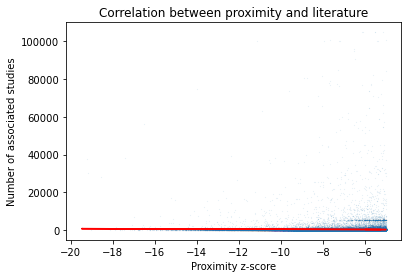

In [18]:
import scipy
from scipy import stats

prox_zscore=[] 
lit_annotation=[]

for couple,prox in real_significant_final_exp_proximity.items():
    prox_zscore.append(prox[1])
    lit_annotation.append(lit_associations_dis_chem_dict_real[couple])

print(scipy.stats.pearsonr(prox_zscore,lit_annotation))  # Pearson's r
print(scipy.stats.spearmanr(prox_zscore,lit_annotation)) # Spearman's rho
slope, intercept, r, p, stderr = scipy.stats.linregress(prox_zscore,lit_annotation)
fig, ax = plt.subplots()
ax.scatter(prox_zscore,lit_annotation, s= 0.001)
y=[]
for i in prox_zscore:
    g=(intercept + slope * i)
    y.append(g)


ax.plot(prox_zscore, y,color='r')
ax.set_xlabel('Proximity z-score')
ax.set_ylabel('Number of associated studies')

plt.title('Correlation between proximity and literature')
#ax.legend(facecolor='white')
plt.show()


(-0.018743193610603687, 4.708775223225086e-12)
SpearmanrResult(correlation=-0.049546289338744005, pvalue=1.059567827756352e-74)


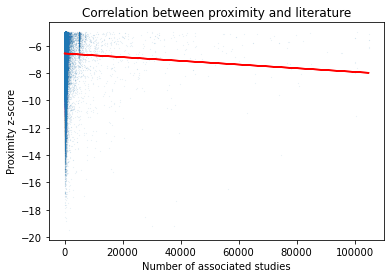

In [23]:
#Let's see what happens if I remove the 0 values

import scipy
from scipy import stats

prox_zscore_nozeroassociation=[] 
lit_annotation_nozeroassociation=[]

for couple,count in lit_associations_dis_chem_dict_real.items():
    if count!=0:
        prox_zscore_nozeroassociation.append(real_significant_final_exp_proximity[couple][1])
        lit_annotation_nozeroassociation.append(count)

print(scipy.stats.pearsonr(lit_annotation_nozeroassociation,prox_zscore_nozeroassociation))  # Pearson's r
print(scipy.stats.spearmanr(lit_annotation_nozeroassociation,prox_zscore_nozeroassociation)) # Spearman's rho
slope, intercept, r, p, stderr = scipy.stats.linregress(lit_annotation_nozeroassociation,prox_zscore_nozeroassociation)
fig, ax = plt.subplots()
ax.scatter(lit_annotation_nozeroassociation,prox_zscore_nozeroassociation, s= 0.001)
y=[]
for i in lit_annotation_nozeroassociation:
    g=(intercept + slope * i)
    y.append(g)


ax.plot(lit_annotation_nozeroassociation, y,color='r')
ax.set_xlabel('Number of associated studies')
ax.set_ylabel('Proximity z-score')

plt.title('Correlation between proximity and literature')
#ax.legend(facecolor='white')
plt.show()



(-0.06500504325561146, 2.895806250729054e-123)
SpearmanrResult(correlation=-0.04891059084752858, pvalue=1.4983670872014403e-70)


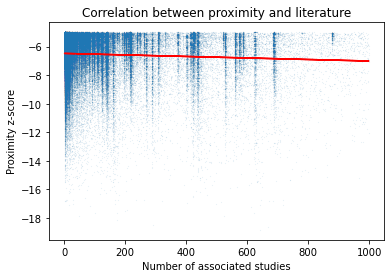

In [25]:
#Let's see what happens if I remove the 0 values and I limit the number of papers to 1000

import scipy
from scipy import stats

prox_zscore_nozeroassociation=[] 
lit_annotation_nozeroassociation=[]

for couple,count in lit_associations_dis_chem_dict_real.items():
    if count!=0 and count<1000:
        prox_zscore_nozeroassociation.append(real_significant_final_exp_proximity[couple][1])
        lit_annotation_nozeroassociation.append(count)

print(scipy.stats.pearsonr(lit_annotation_nozeroassociation,prox_zscore_nozeroassociation))  # Pearson's r
print(scipy.stats.spearmanr(lit_annotation_nozeroassociation,prox_zscore_nozeroassociation)) # Spearman's rho
slope, intercept, r, p, stderr = scipy.stats.linregress(lit_annotation_nozeroassociation,prox_zscore_nozeroassociation)
fig, ax = plt.subplots()
ax.scatter(lit_annotation_nozeroassociation,prox_zscore_nozeroassociation, s= 0.001)
y=[]
for i in lit_annotation_nozeroassociation:
    g=(intercept + slope * i)
    y.append(g)


ax.plot(lit_annotation_nozeroassociation, y,color='r')
ax.set_xlabel('Number of associated studies')
ax.set_ylabel('Proximity z-score')

plt.title('Correlation between proximity and literature')
#ax.legend(facecolor='white')
plt.show()


In [ ]:
#Binning values by proximity and take a certain number of random comparisons could give better results probably



In [ ]:
zscore_list=[]
for pair,stat in final_exp_proximity.items():
    zscore_list.append(stat[1])

In [ ]:
grouped_exp_by_zscore_dict={}
for el in list(range(-19,6)):
    exp_pair_list=[]
    for pair,stat in final_exp_proximity.items():
        if len(exp_pair_list)<1000:
            if el<stat[1]<el+1:
                exp_pair_list.append(pair)
            else:
                pass
        else:
            break
    grouped_exp_by_zscore_dict[el]=exp_pair_list

In [ ]:
from Bio import Entrez
Entrez.email = "yourmail@gmail.com"


grouped_exp_by_zscore_cit_count={}
for gr,exp_dis_pair_list in grouped_exp_by_zscore_dict.items():
    lit_associations_dis_chem_dict={}
    for exp_dis in exp_dis_pair_list:
        dis_chem_lit_association_list=[]
        try:
            handle = Entrez.esearch(db="pubmed", term="%s AND %s" %(exp_dis[1],exp_dis[0]), retmax=100000, usehistory = 'y', retmode="xml")
            records = Entrez.read(handle)
            dis_chem_lit_association_list.extend(records["IdList"])
        except:
            pass  
        try:
            handle = Entrez.esearch(db="pubmed", term="%s AND %s" %(dis_name_id_conversion[exp_dis[1]],exp_dis[0]), retmax=100000, usehistory = 'y', retmode="xml")
            records = Entrez.read(handle)
            dis_chem_lit_association_list.extend(records["IdList"])
        except:
            pass
        try:
            handle = Entrez.esearch(db="pubmed", term="%s AND %s" %(exp_dis[1],chem_id_name_conversion[exp_dis[0]]), retmax=100000, usehistory = 'y', retmode="xml")
            records = Entrez.read(handle)
            dis_chem_lit_association_list.extend(records["IdList"])
        except:
            pass  
        try:
            handle = Entrez.esearch(db="pubmed", term="%s AND %s" %(dis_name_id_conversion[exp_dis[1]],chem_id_name_conversion[exp_dis[0]]), retmax=100000, usehistory = 'y', retmode="xml")
            records = Entrez.read(handle)
            dis_chem_lit_association_list.extend(records["IdList"])
        except:
            pass
        try:
            handle = Entrez.esearch(db="pubmed", term="%s AND %s" %(exp_dis_pair_list[1],chem_id_cas_conversion[exp_dis[0]]), retmax=100000, usehistory = 'y', retmode="xml")
            records = Entrez.read(handle)
            dis_chem_lit_association_list.extend(records["IdList"])
        except:
            pass  
        try:
            handle = Entrez.esearch(db="pubmed", term="%s AND %s" %(dis_name_id_conversion[exp_dis[1]],chem_id_cas_conversion[exp_dis[0]]), retmax=100000, usehistory = 'y', retmode="xml")
            records = Entrez.read(handle)
            dis_chem_lit_association_list.extend(records["IdList"])
        except:
            pass         
        lit_associations_dis_chem_dict[exp_dis]=len(set(dis_chem_lit_association_list))
    grouped_exp_by_zscore_cit_count[gr]=lit_associations_dis_chem_dict
    

In [ ]:
with open('output/exp_random/grouped_exp_by_zscore_cit_count.pickle', 'wb') as handle:
    pk.dump(grouped_exp_by_zscore_cit_count, handle, protocol=pk.HIGHEST_PROTOCOL)

In [1]:
import pickle as pk
with open('output/exp_random/grouped_exp_by_zscore_cit_count.pickle', 'rb') as handle:
    grouped_exp_by_zscore_cit_count = pk.load(handle)

In [7]:
import pandas as pd
column_names = ["Count", "Group"]

exp_grouped_count_df = pd.DataFrame(columns = column_names)
for gr,count_dict in grouped_exp_by_zscore_cit_count.items():
    for pair,count in count_dict.items():
        new_row={"Count":count,"Group":gr}
        exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)

<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython

<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython

<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython

<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython

<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython

<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython

<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython

<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython

<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython

<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython

<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython

<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython

<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython

<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython

<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython

<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython

<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython

<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython

<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython

<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython

<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython

<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython

<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython

<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython

<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython

<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython

<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython

<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython

<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython

<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython

<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython

<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython

<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython

<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython

<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython

<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython

<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython

<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython

<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython

<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython

<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython

<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython

<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython

<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython

<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython

<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython

<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython

<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython

<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython

<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython

<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython

<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython

<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython-input-7-01de73a81757>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  exp_grouped_count_df = exp_grouped_count_df.append(new_row, ignore_index=True)
<ipython

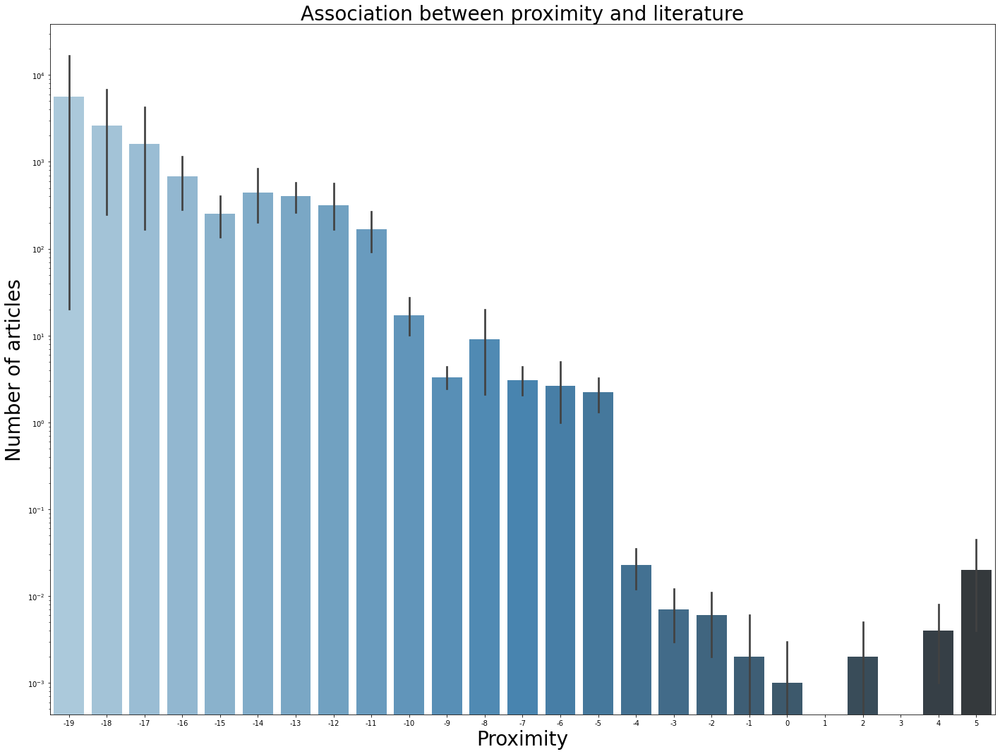

In [4]:
import seaborn as sns
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(24, 18))
ax = sns.barplot(x="Group", y="Count", data=exp_grouped_count_df,
                 palette="Blues_d")
ax.set_yscale("log")
ax.set_title("Association between proximity and literature",fontsize=28)
ax.set_ylabel("Number of articles",fontsize=28)
ax.set_xlabel("Proximity",fontsize=28)
plt.show()
#vertical lines are error bars

<ipython-input-10-968a0b660c09>:15: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(ax.get_yticks(), size = 36)


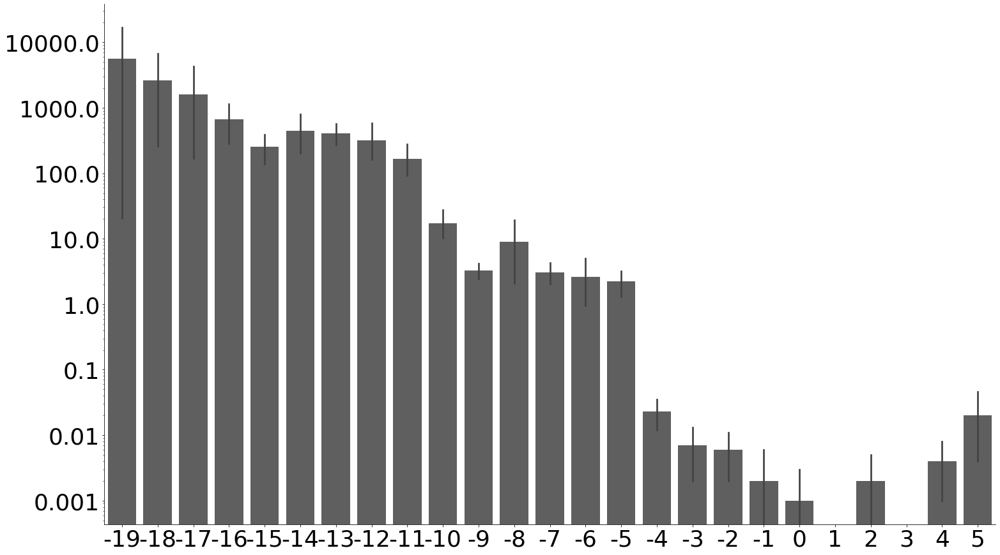

In [10]:
import seaborn as sns
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(25, 15))
ax = sns.barplot(x="Group", y="Count", data=exp_grouped_count_df,
                 color="#5F5F5F")
ax.set_yscale("log")
#ax.set_title("Association between proximity and literature",fontsize=28)
proximity_x=list(range(-19,6))
ax.set_ylabel("",fontsize=28)
ax.set_xlabel("",fontsize=28)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(True)
ax.spines['left'].set_visible(True)
ax.set_yticklabels(ax.get_yticks(), size = 36)
ax.set_xticklabels(proximity_x, size = 36)
import matplotlib
matplotlib.pyplot.rcParams.update({
    "pgf.preamble": [
         "\\usepackage{arev}",
        "\\usepackage[T1]{fontenc}"]
})

plt.savefig('output/Figures/Figure4B.pdf',format='pdf',dpi=300, bbox_inches = "tight")
plt.show()